## Import

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [3]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [4]:
pre_path = "../../../../../../../"
physical_model = "MIST"
path_to_data = pre_path + "data/MIST_v1.2_vvcrit0.0_basic_isos/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "scale_power_14"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["phase"]

In [5]:
override = True
use_preds = False
save = True
show = True
scaler_name = "power"

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading MIST dataframe from MIST_reclassified_iso_full_data.csv file...


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,3.486221,3.131342,-1.0,-0.25,0.100000,0.153402
1,5.0,3.487362,3.126808,-1.0,-0.25,0.102645,0.160326
2,5.0,3.489243,3.119367,-1.0,-0.25,0.107039,0.171785
3,5.0,3.491102,3.112165,-1.0,-0.25,0.111419,0.183099
4,5.0,3.492937,3.105143,-1.0,-0.25,0.115789,0.194305
...,...,...,...,...,...,...,...
1467117,10.3,4.402490,7.777159,6.0,0.50,0.532726,-1.806255
1467118,10.3,4.387132,7.783242,6.0,0.50,0.532730,-1.809295
1467119,10.3,4.371789,7.789130,6.0,0.50,0.532735,-1.812237
1467120,10.3,4.356480,7.794844,6.0,0.50,0.532741,-1.815091


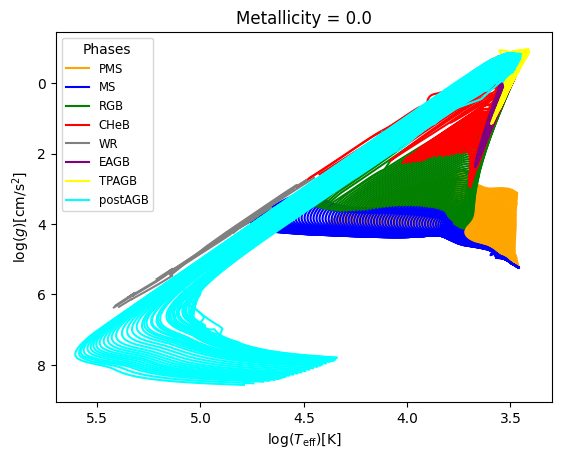

In [6]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['log10_isochrone_age_yr', 'log_Teff', 'log_g', 'phase', 'metallicity', 'star_mass', 'log_R'], 
                              physical_model, reclassify=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.00,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.00,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.00,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.05,4.482577,4.350883,0.0,-0.25,12.925175,0.596074
4,5.05,4.485667,4.349692,0.0,-0.25,13.105490,0.600130
...,...,...,...,...,...,...,...
519286,10.30,3.602322,1.827453,3.0,0.50,0.866616,1.274247
519287,10.30,3.600999,1.809405,3.0,0.50,0.866614,1.283270
519288,10.30,3.599710,1.791489,3.0,0.50,0.866612,1.292228
519289,10.30,3.598418,1.773621,3.0,0.50,0.866610,1.301161


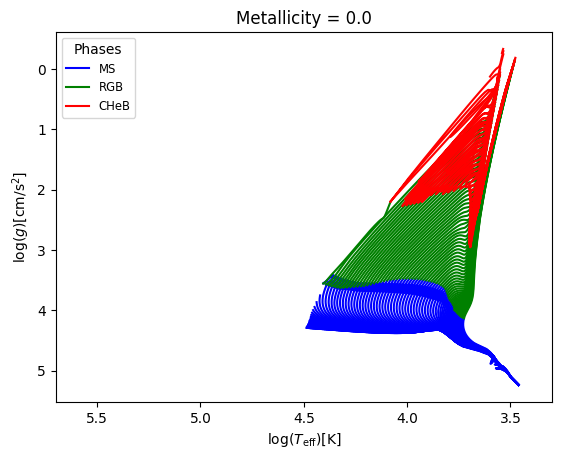

In [7]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3], 'star_mass':('<', 14)})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [8]:
print_all_uniques(phase_filtered_iso_df)

log10_isochrone_age_yr  : Range : 5.0 - 10.3, Mean : 8.4629, Median : 8.5

log_Teff  : Range : 3.34 - 4.6345, Mean : 3.9346, Median : 3.8644

log_g  : Range : -1.08 - 5.4331, Mean : 3.5485, Median : 3.9492

Values in phase column : 0.0, 2.0, 3.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.5, -3.0, -3.5, -4.0, 0.0, 0.25, 0.5 

star_mass  : Range : 0.1 - 13.9995, Mean : 3.398, Median : 2.0471

log_R  : Range : -1.0 - 3.0828, Mean : 0.6067, Median : 0.5386



In [9]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_filtered_iso_df, x_cols=['log10_isochrone_age_yr', 'metallicity', 'star_mass'], 
                               y_cols=['log_Teff', 'log_g', 'log_R'], categories_cols=['phase'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the log_Teff parameter : 3.344668191350628 - 4.634489491902143
Median value in train data for the log_Teff parameter: 3.8641118622993966
Mean value in train data for the log_Teff parameter: 3.9345581069095505

Range in train data for the log_g parameter : -1.0828963170617296 - 5.433094523832443
Median value in train data for the log_g parameter: 3.9484790508590737
Mean value in train data for the log_g parameter: 3.548006174763417

Range in train data for the log_R parameter : -0.9974747647513328 - 3.082068881511837
Median value in train data for the log_R parameter: 0.5381900688843242
Mean value in train data for the log_R parameter: 0.6069651248403705

Testing set statistics:
Range in test data for the log_Teff parameter : 3.344711147414537 - 4.633956017110521
Median value in test data for the log_Teff parameter: 3.865317881638998
Mean value in test data for the log_Teff parameter: 3.9346904482232112

Range in test data for the log_g p

## Model training

### Linear regression

In [10]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_power_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.8705144530900057
  RMSE :  0.12926388902506009
  MAE :  0.11331134713832179
  MedAE :  0.1207213255800923
  CORR :  0.9376643545917648
  MAX_ER :  0.6492027056352865
  Percentiles : 
    75th percentile :  0.15742359458134736
    90th percentile :  0.18349167252775497
    95th percentile :  0.19924074007319828
    99th percentile :  0.23783226726654785

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.6665703342626754
  RMSE :  0.1533777142151886
  MAE :  0.11534070676044077
  MedAE :  0.09117158489659216
  CORR :  0.8199427746320549
  MAX_ER :  0.6246799169651984
  Percentiles : 
    75th percentile :  0.15101145257784088
    90th percentile :  0.24297372932665498
    

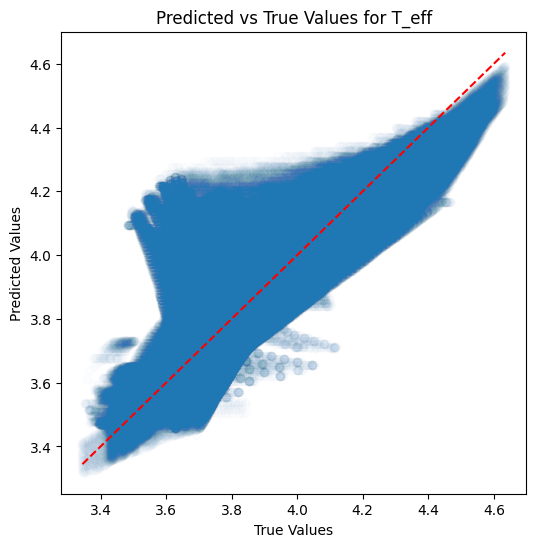

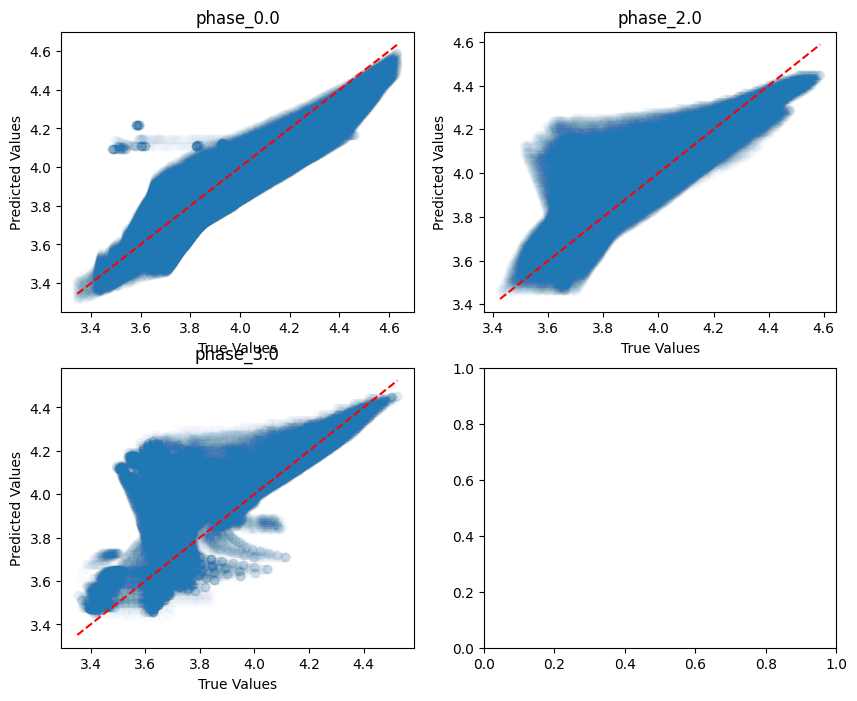

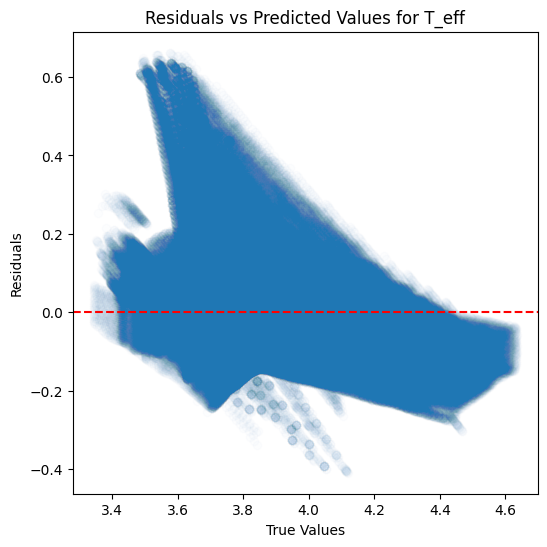

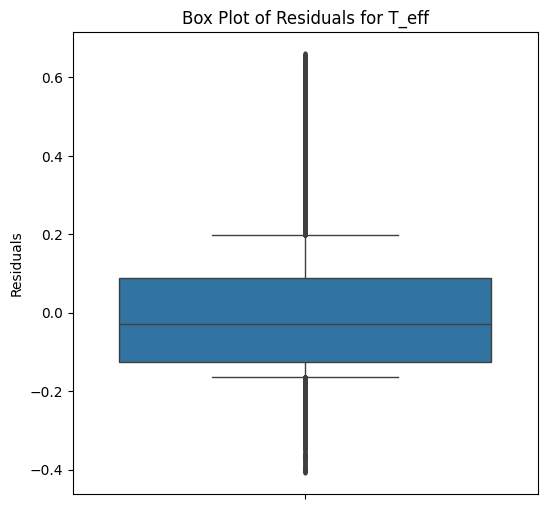

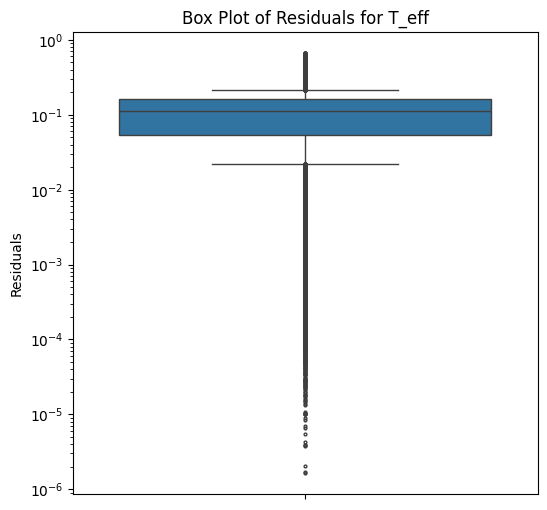

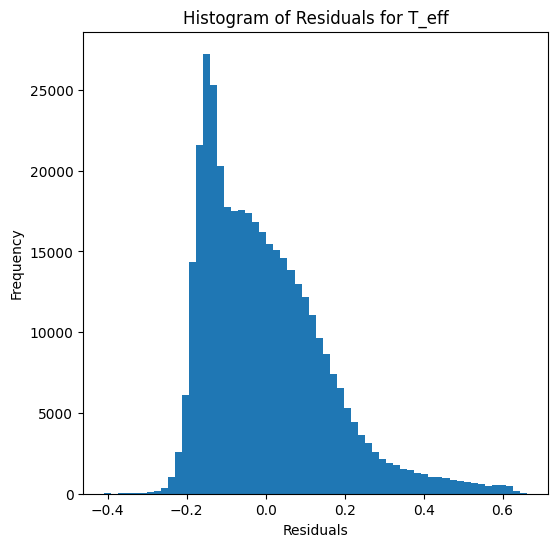

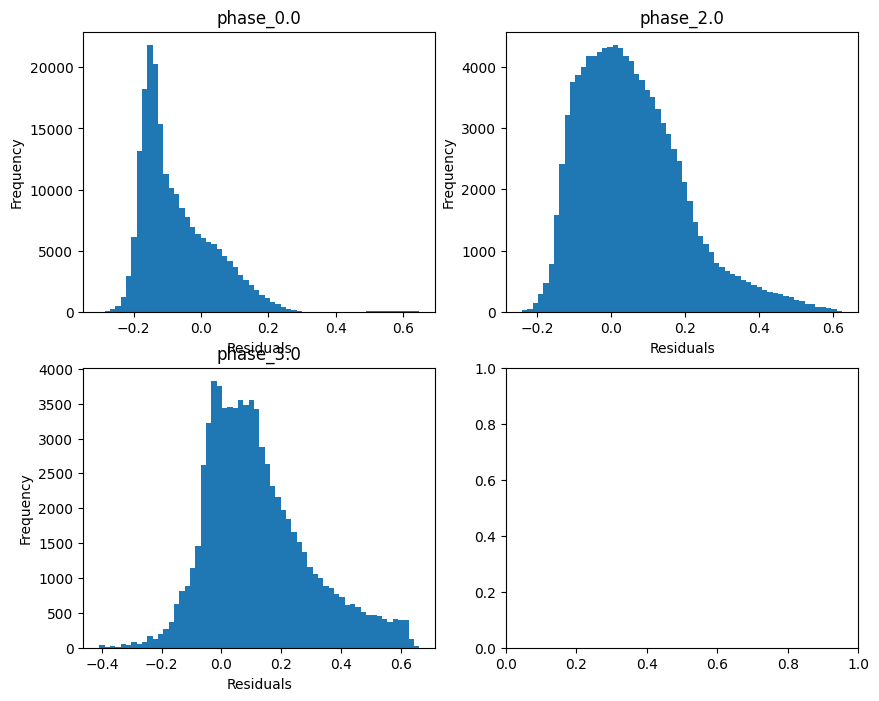

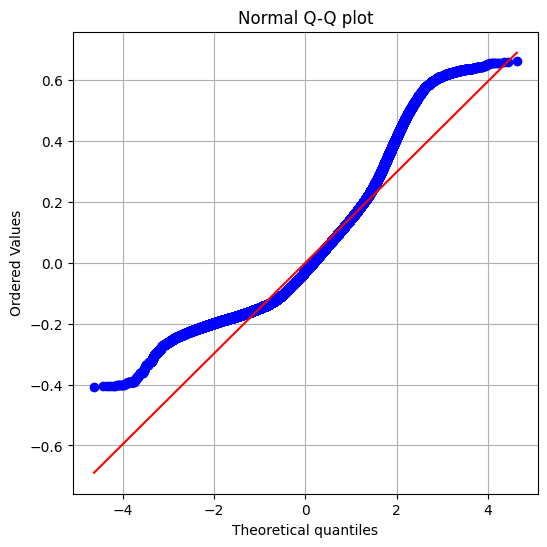

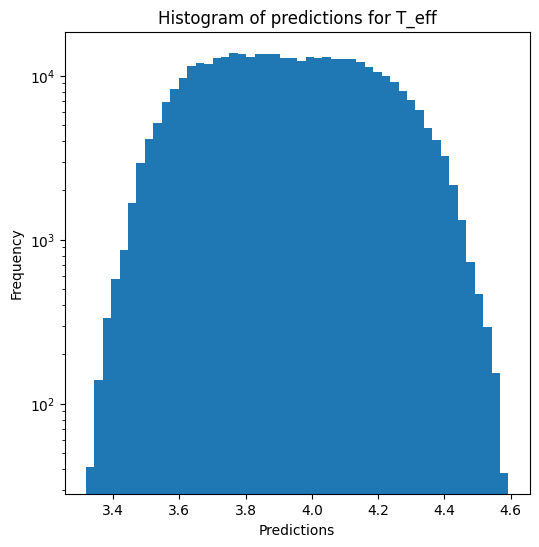

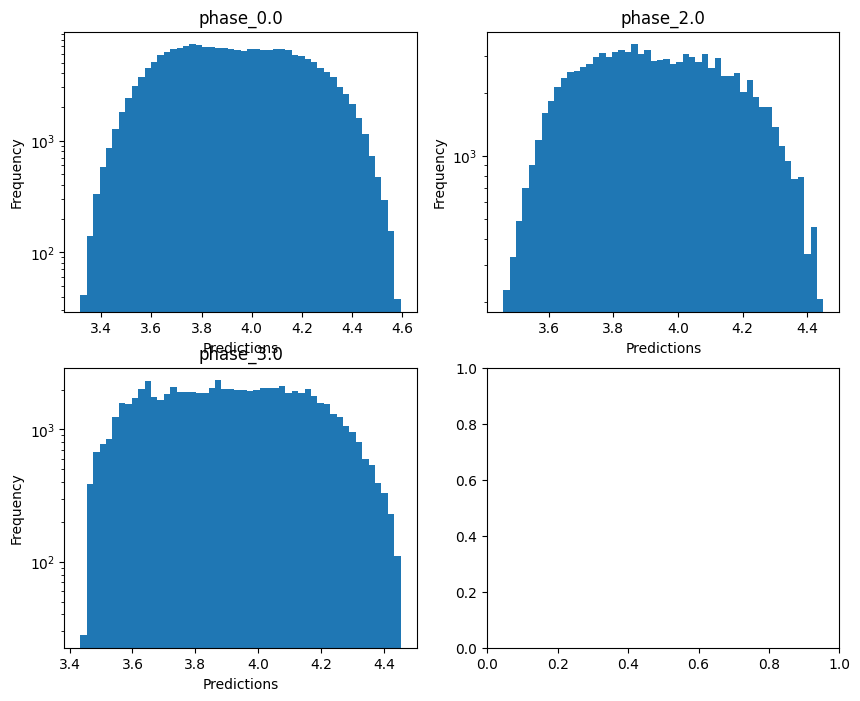

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -1.0257442414365125
  RMSE :  0.826273409187774
  MAE :  0.71499677873758
  MedAE :  0.7375082157260255
  CORR :  0.6570917059275475
  MAX_ER :  3.265258649407378
  Percentiles : 
    75th percentile :  0.9549148148587929
    90th percentile :  1.2029205028817973
    95th percentile :  1.427422733339754
    99th percentile :  1.8653346662729735

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.15029338858357189
  RMSE :  0.9349813428375886
  MAE :  0.7262579194988024
  MedAE :  0.5647236111313658
  CORR :  0.38873001360181064
  MAX_ER :  2.671966849366286
  Percentiles : 
    75th percentile :  1.025250785385972
    90th percentile :  1.6314487303526204
    95th percentile :  1.986773385670902
    99th percentile :  2.413024562866997

log_g results for the phase categor

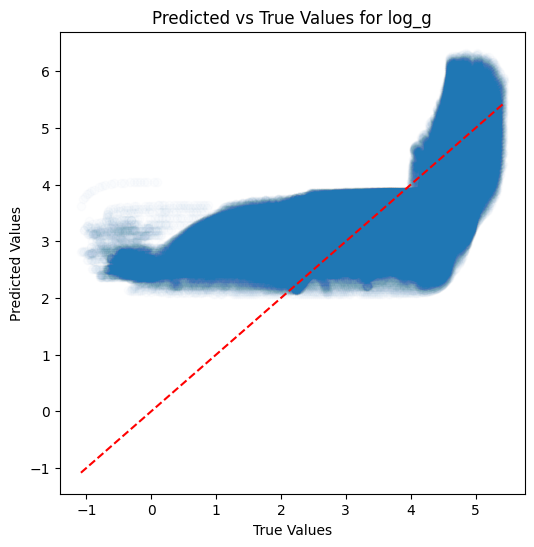

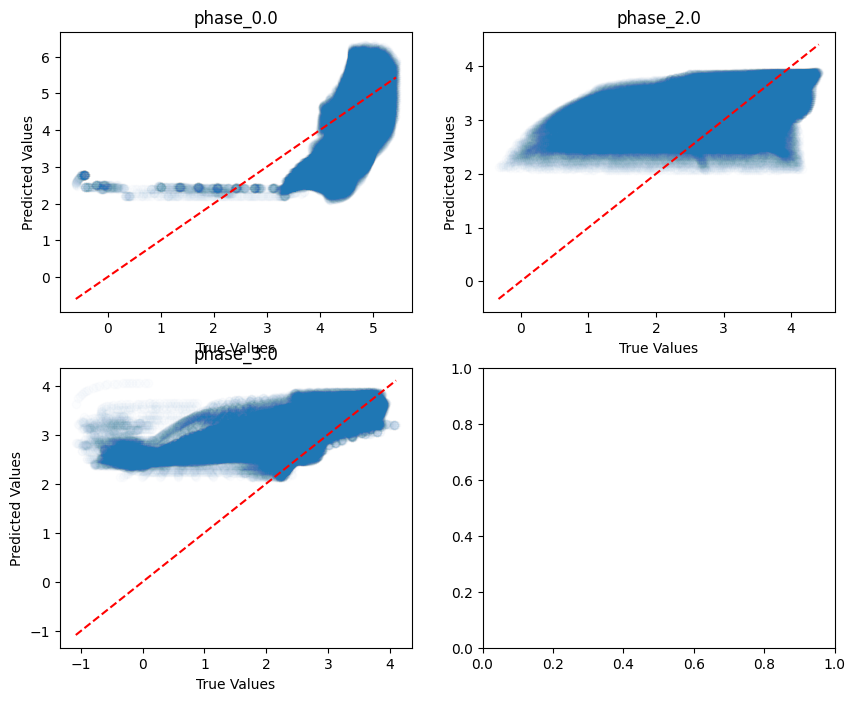

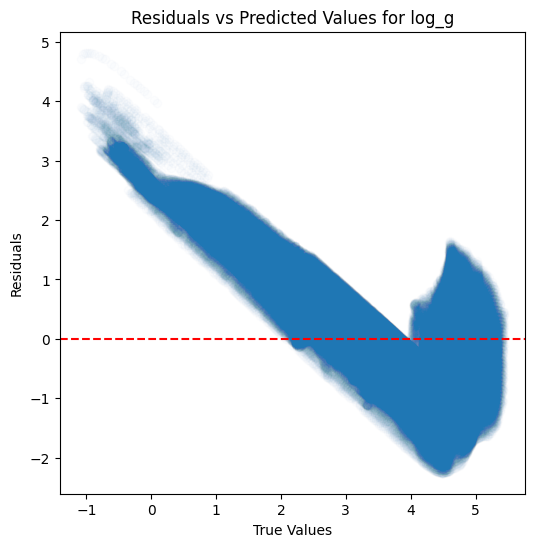

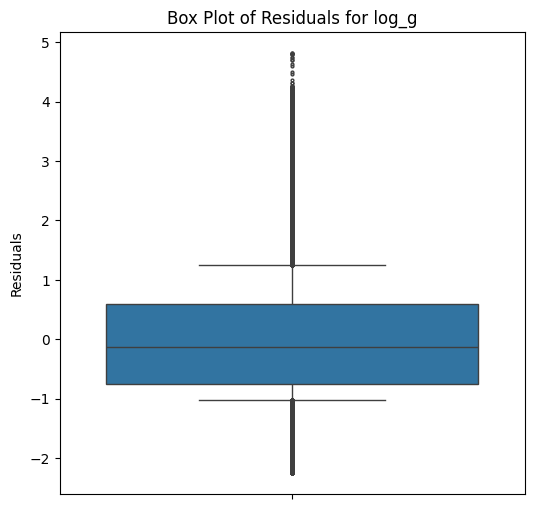

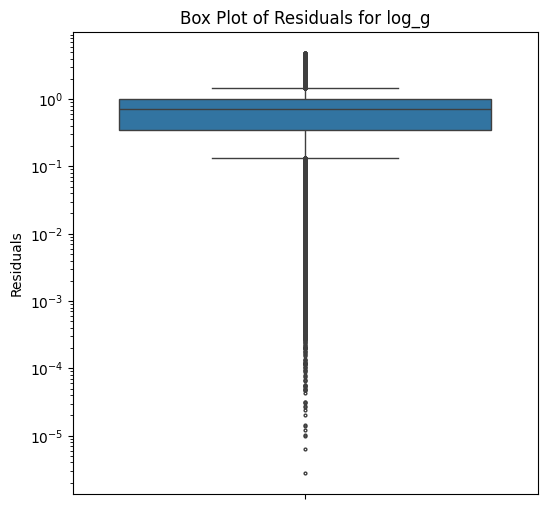

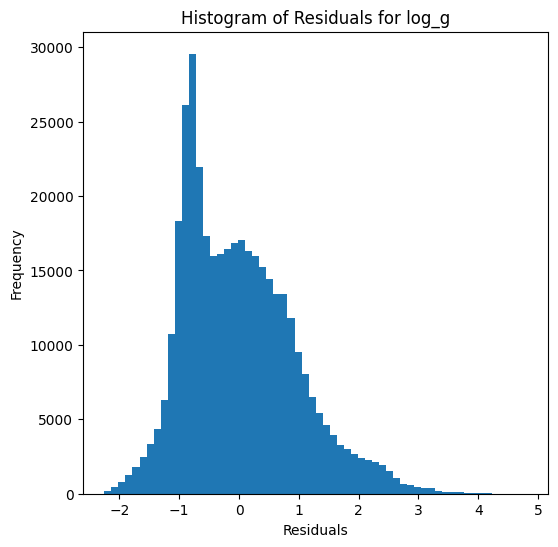

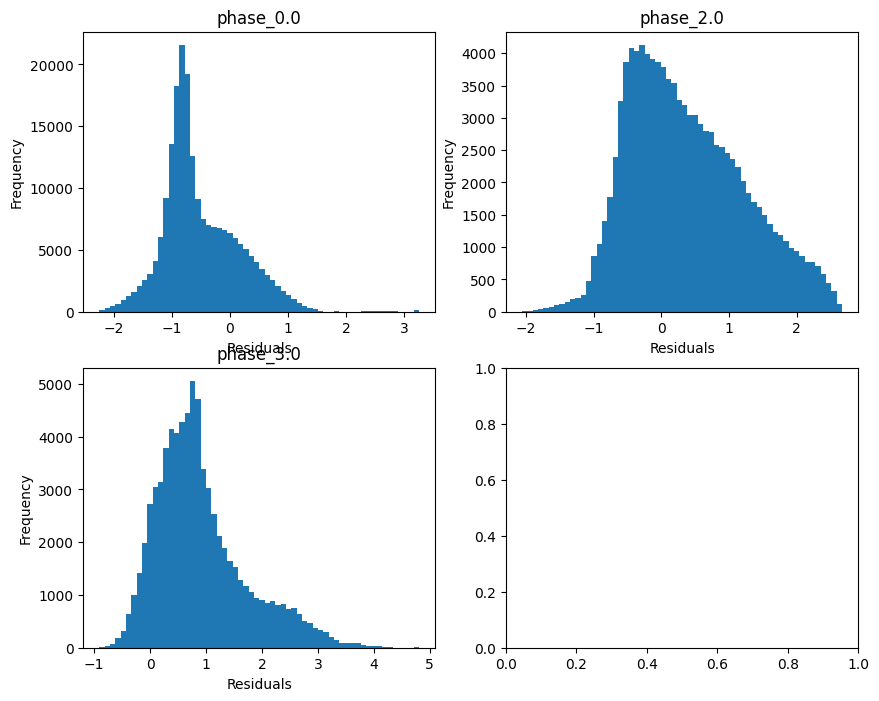

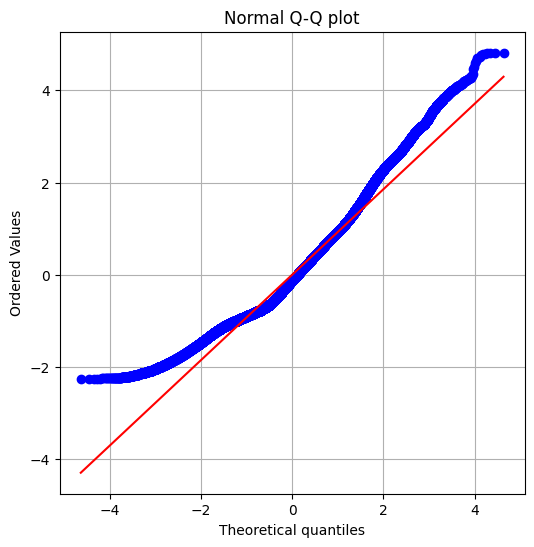

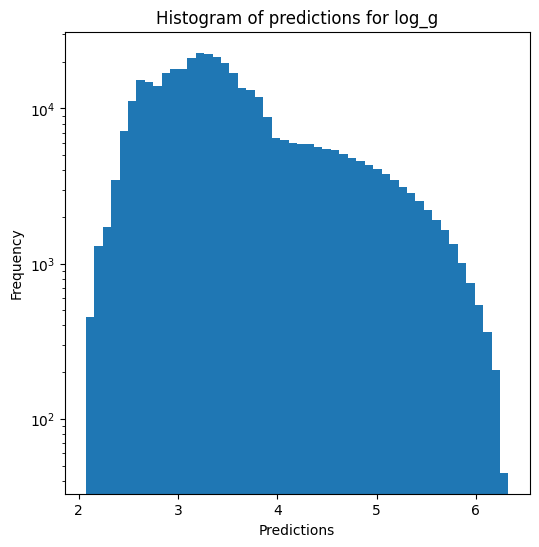

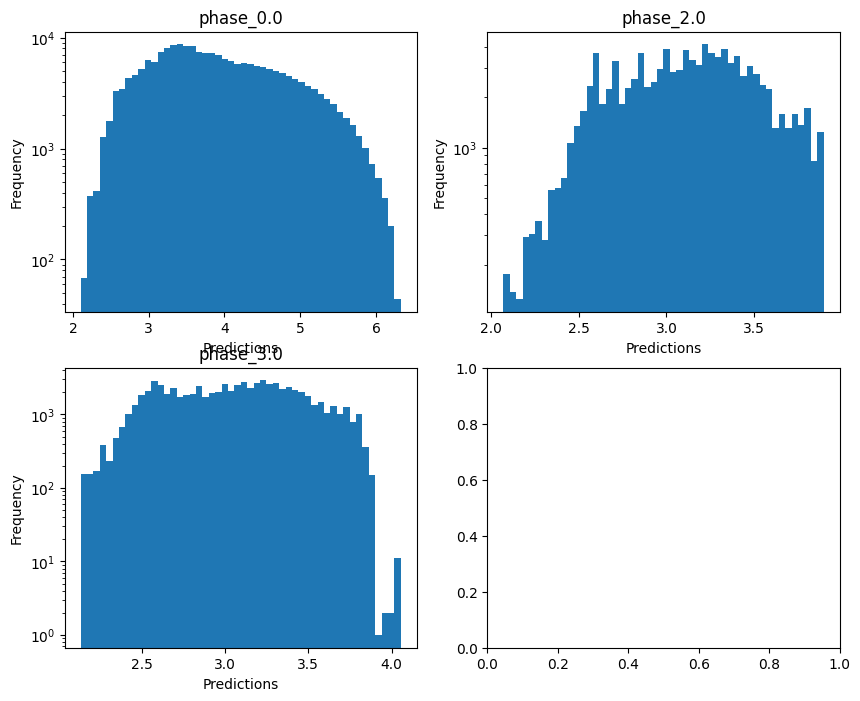


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.3773889425313739
  RMSE :  0.42033982589896884
  MAE :  0.3640442628165195
  MedAE :  0.37173901345943494
  CORR :  0.8063820006676287
  MAX_ER :  1.6223016322346753
  Percentiles : 
    75th percentile :  0.4882220687332523
    90th percentile :  0.6162827978997899
    95th percentile :  0.7310285638270692
    99th percentile :  0.93656118451335

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.14534164593350996
  RMSE :  0.4705476258608576
  MAE :  0.36537157522481084
  MedAE :  0.28430229688658193
  CORR :  0.42804073316699864
  MAX_ER :  1.3475951775812653
  Percentiles : 
    75th percentile :  0.5153935296613119
    90th percentile :  0.8196172824860103
    95th percentile :  1.001964609188795
    99th percentile :  1.2182597127493107

radius results for the phase category with a

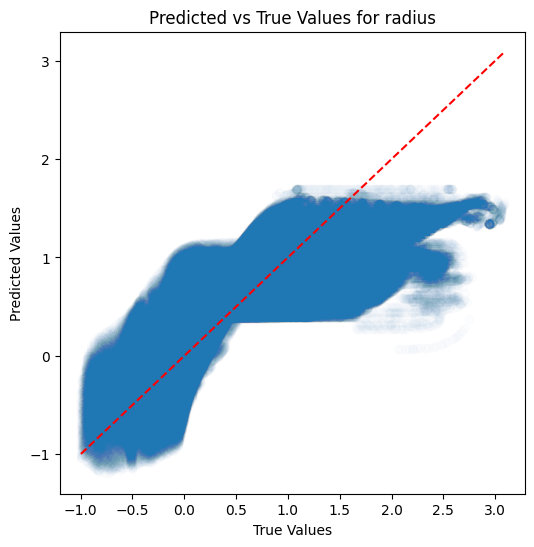

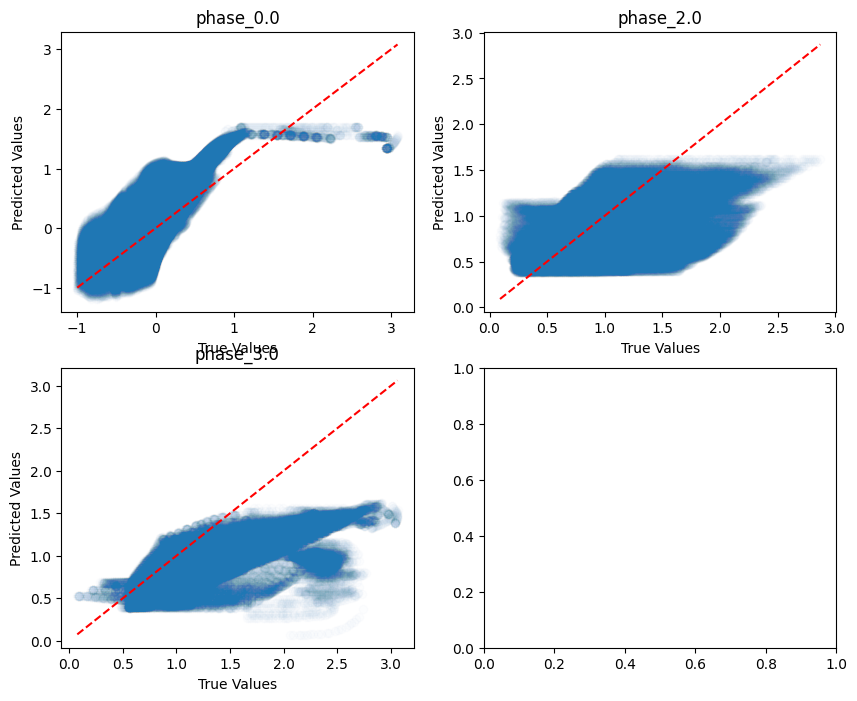

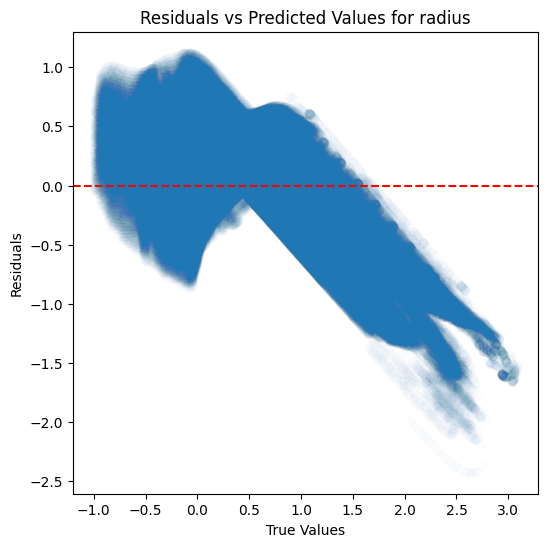

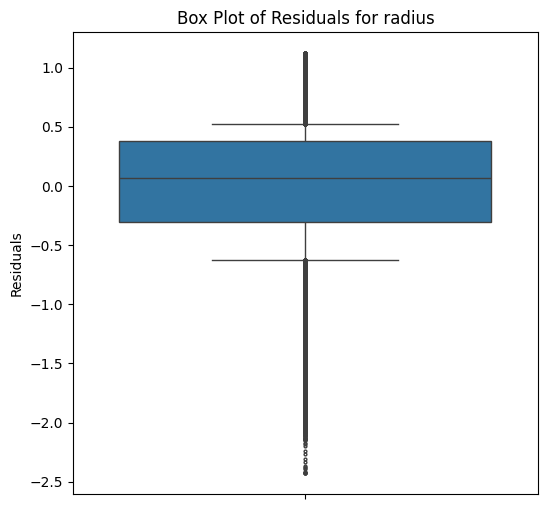

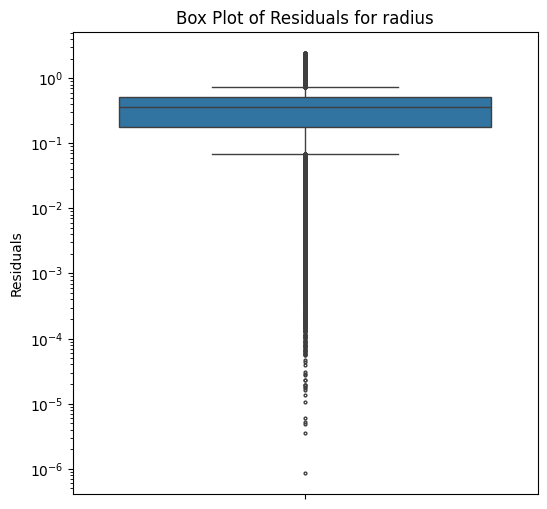

...

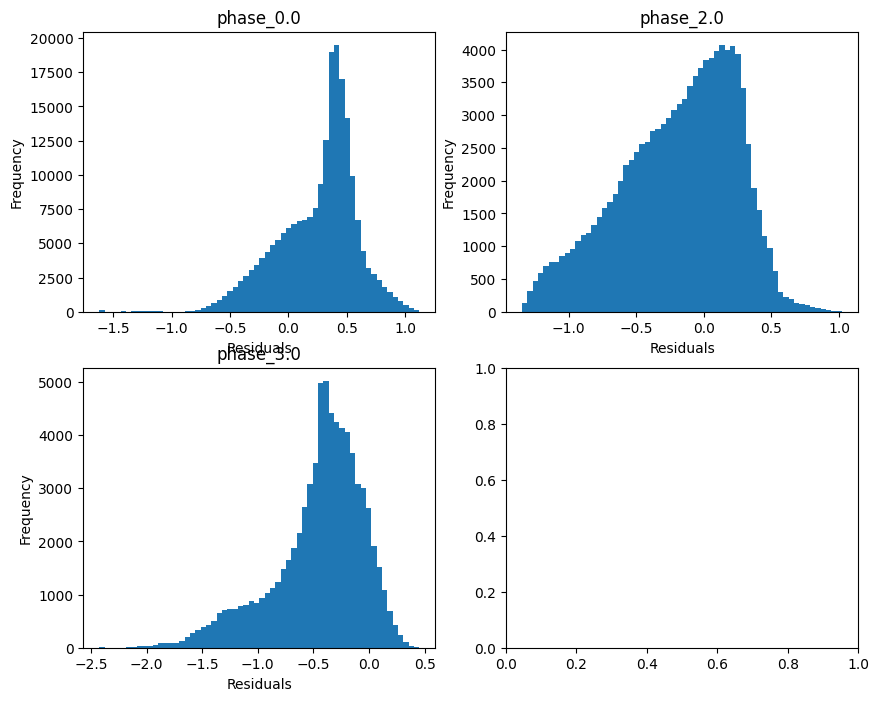

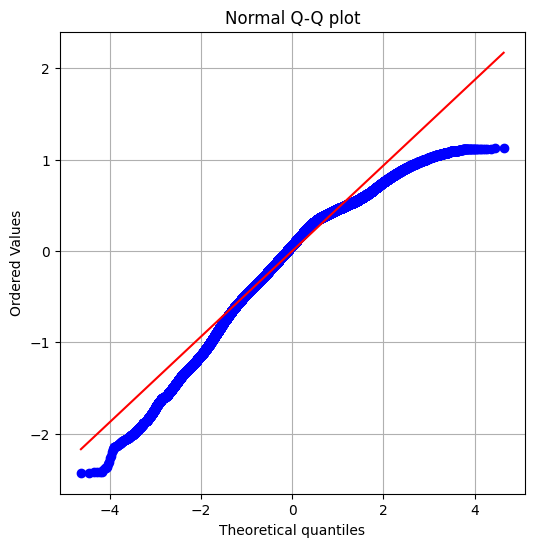

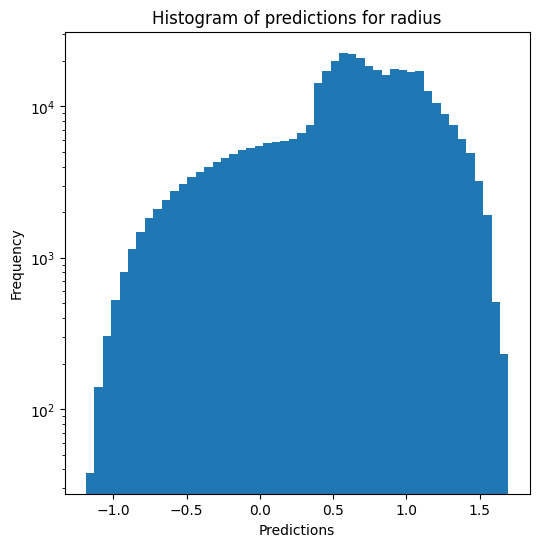

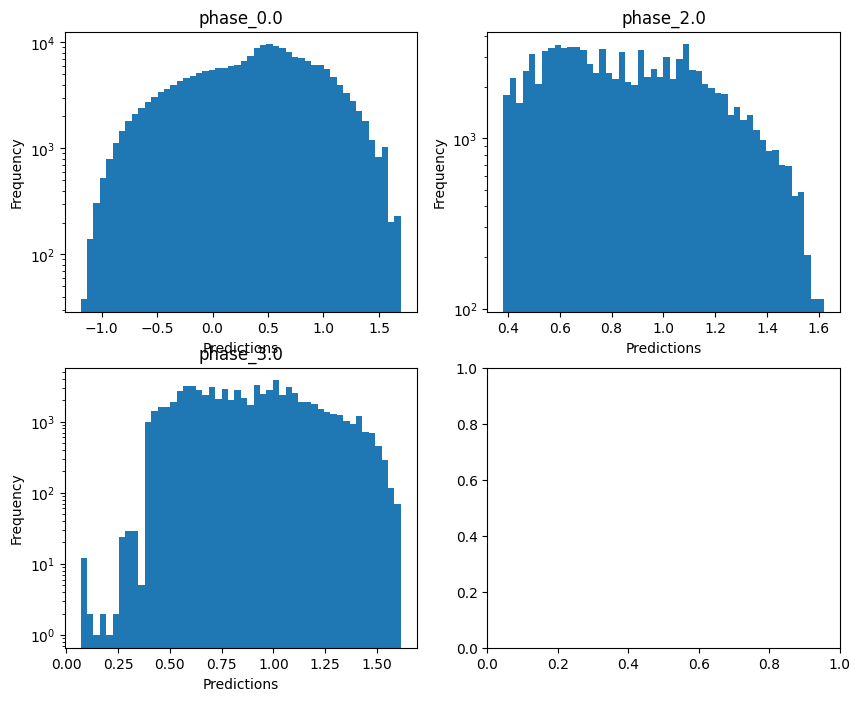

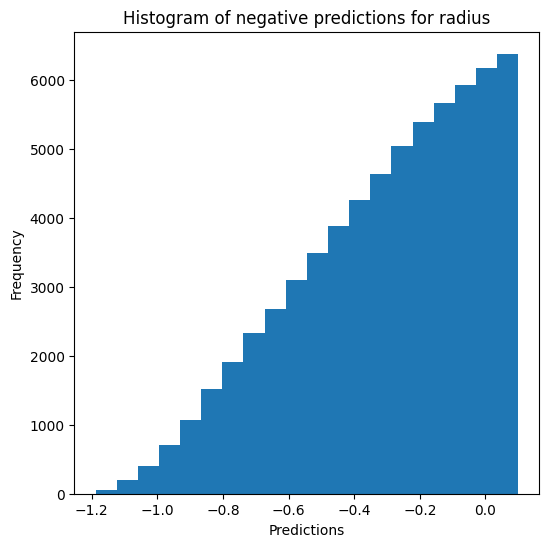

Saving predictions and results...


In [11]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name) #, override=False, use_preds=True

### Decision tree

In [12]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_power_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9710153972138863
  RMSE :  0.05089213711511897
  MAE :  0.007014048792430462
  MedAE :  0.0010163757282661834
  CORR :  0.9857128557668081
  MAX_ER :  0.9170521162841481
  Percentiles : 
    75th percentile :  0.002228232200809366
    90th percentile :  0.00398721207103261
    95th percentile :  0.007280715905883089
    99th percentile :  0.194671219854663

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.9291257275927656
  RMSE :  0.06539727418327579
  MAE :  0.026700672976454346
  MedAE :  0.003702655449708381
  CORR :  0.9642919620585271
  MAX_ER :  0.8297717313302497
  Percentiles : 
    75th percentile :  0.014481517338952532
    90th percentile :  0.09379059904496

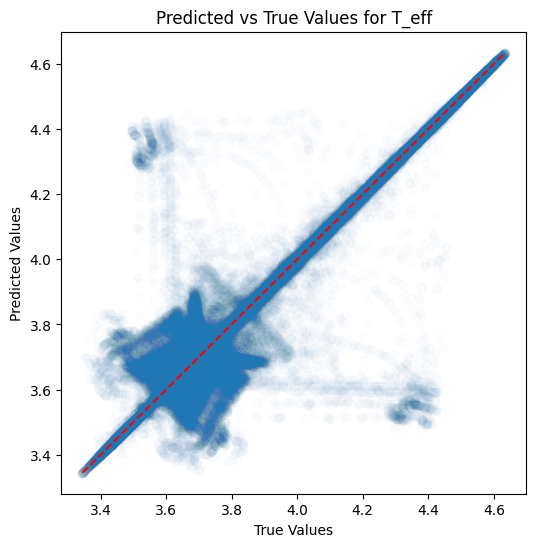

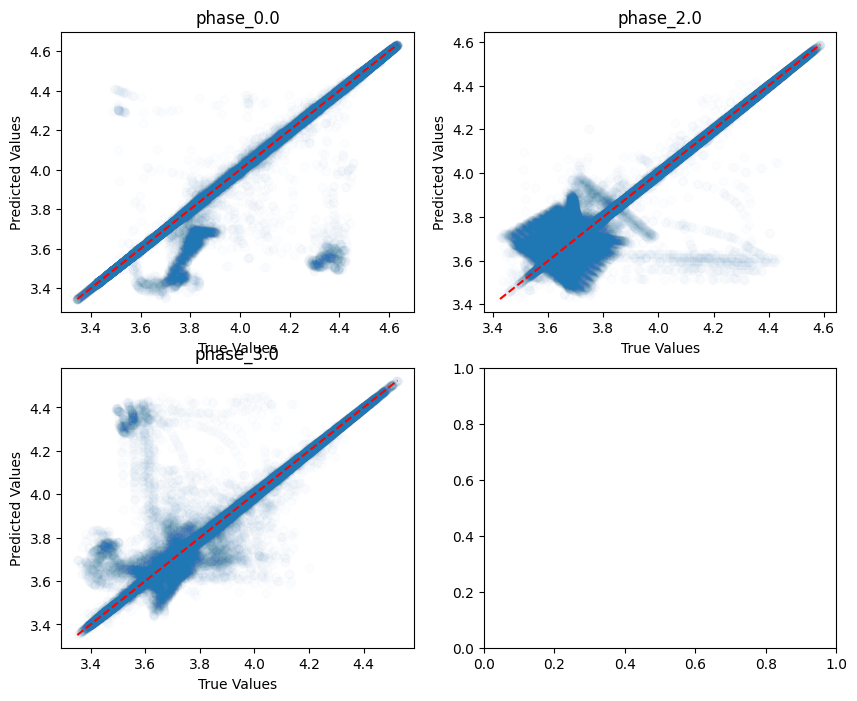

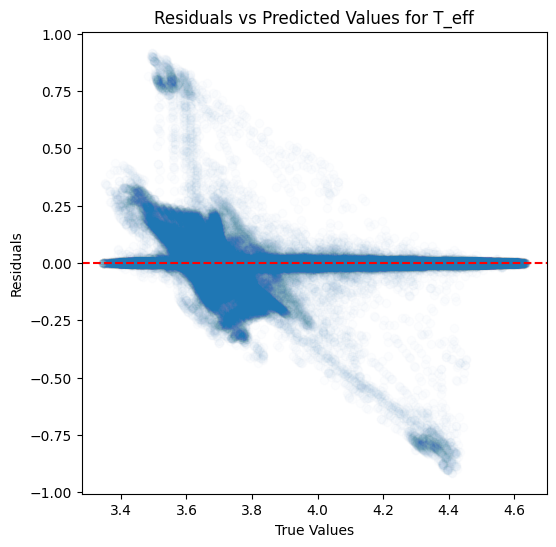

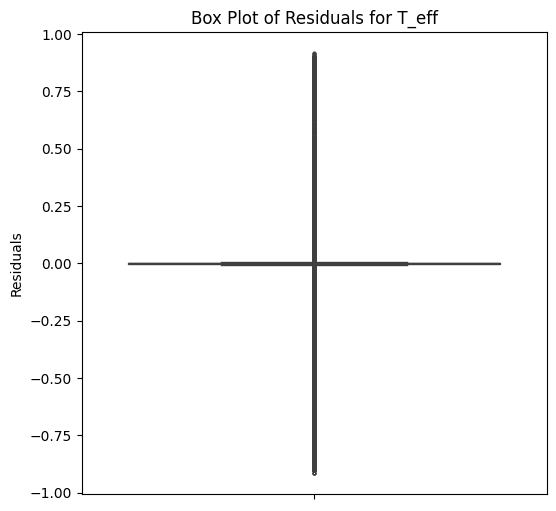

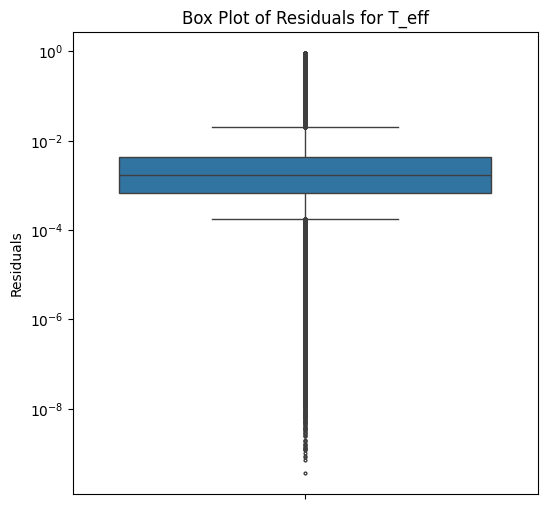

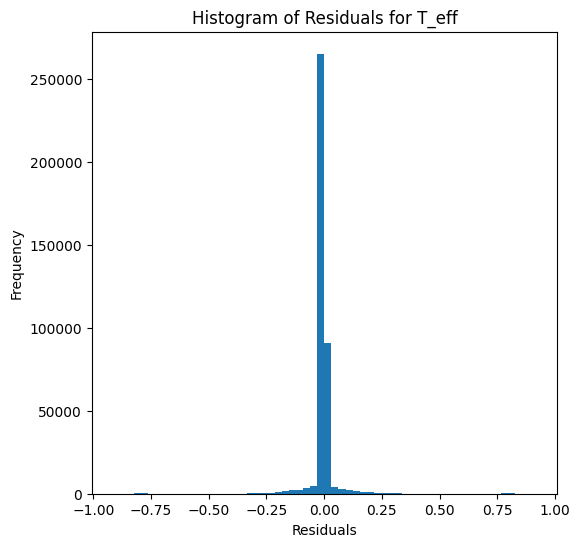

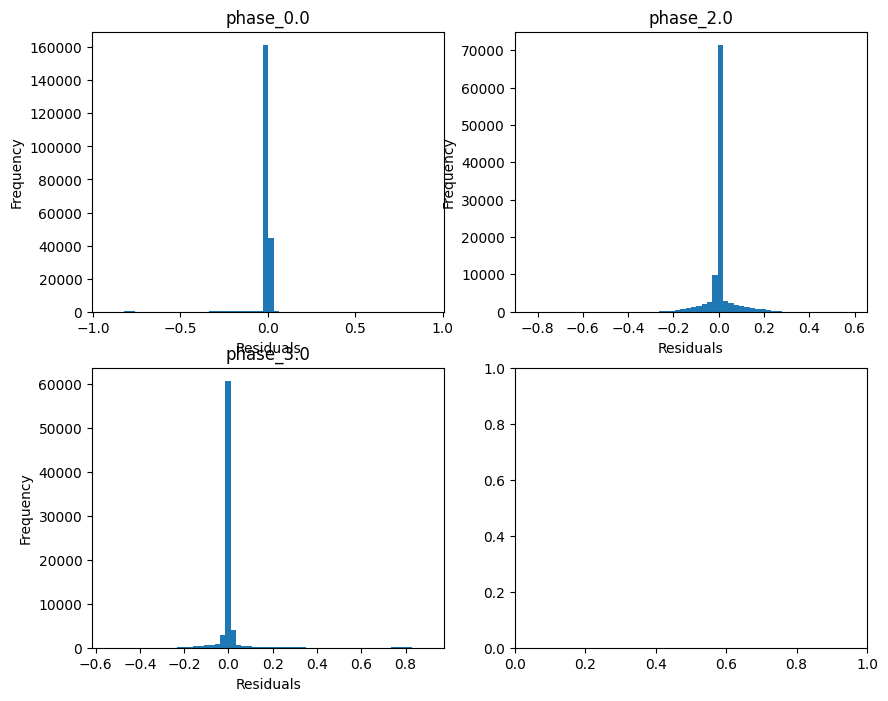

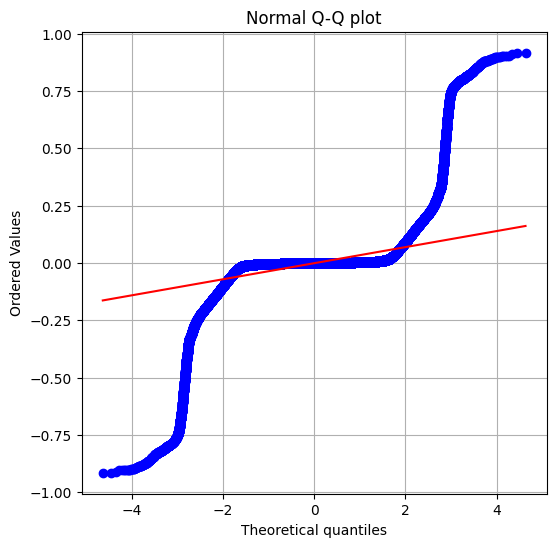

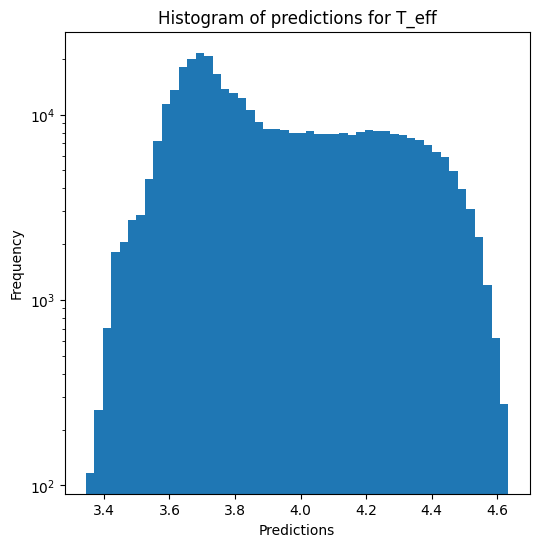

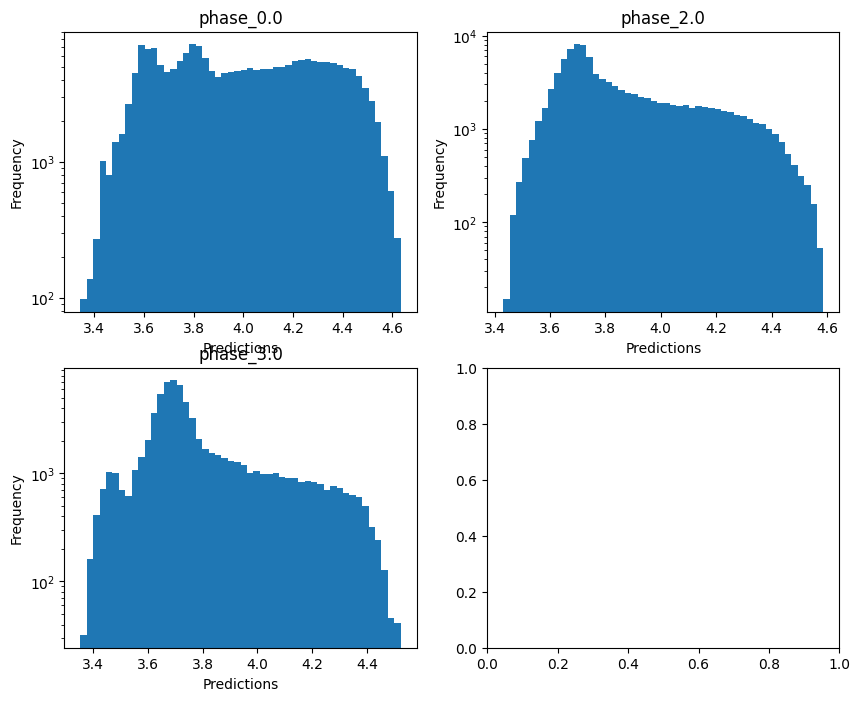


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.05607957562042609
  RMSE :  0.4458393073973824
  MAE :  0.059812328277065674
  MedAE :  0.003625862569630378
  CORR :  0.7391239757188113
  MAX_ER :  5.693303843114662
  Percentiles : 
    75th percentile :  0.00720737031353913
    90th percentile :  0.012513220645585757
    95th percentile :  0.021262494569274537
    99th percentile :  3.17939603520488

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  -0.03469053690145896
  RMSE :  0.9438528971273673
  MAE :  0.4191784804710861
  MedAE :  0.01827806780917529
  CORR :  0.47998314183547286
  MAX_ER :  4.637418133429539
  Percentiles : 
    75th percentile :  0.24459983905533816
    90th percentile :  1.752442771313638
    95th percentile :  2.5261948177876
    99th percentile :  3.5393757759933804

log_g results for the phase category with

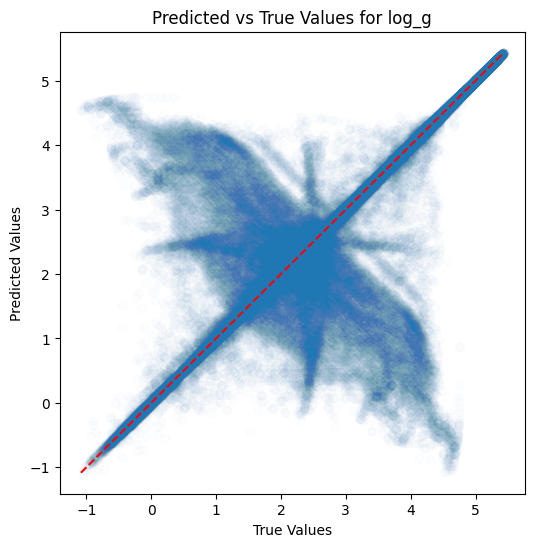

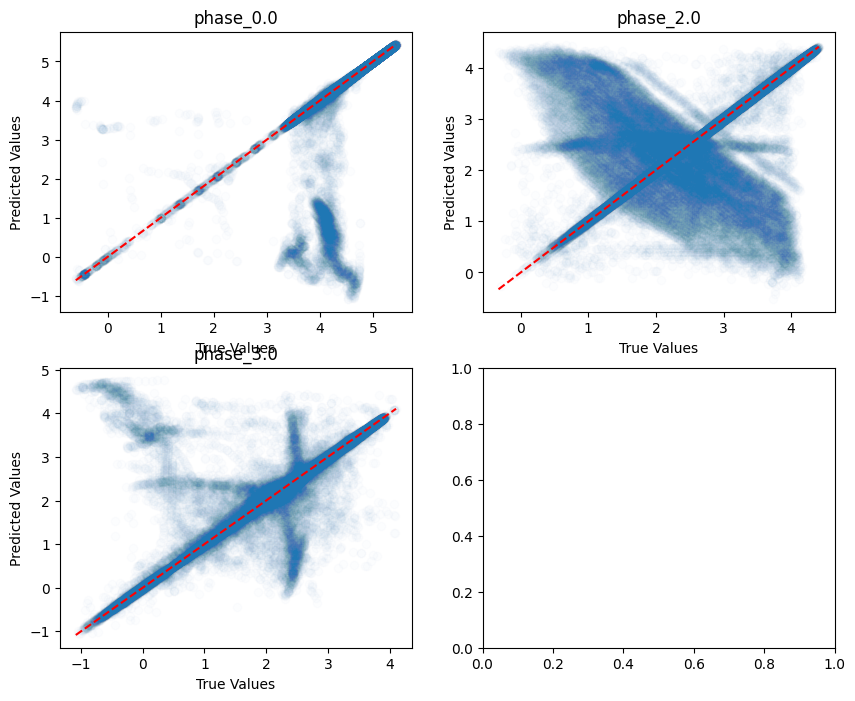

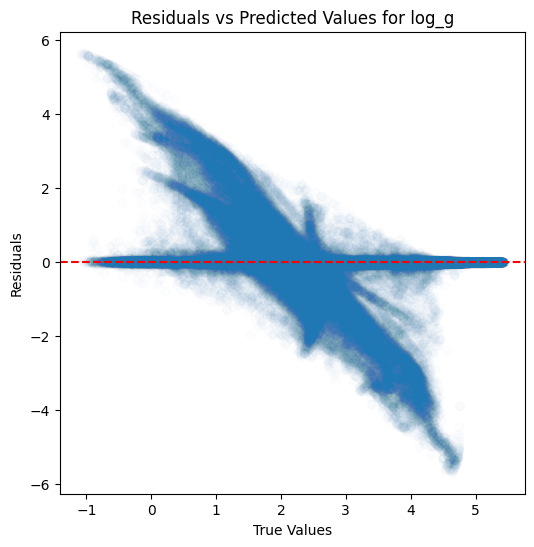

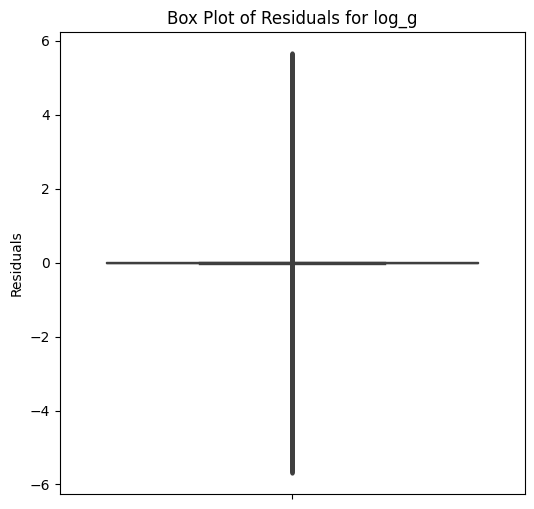

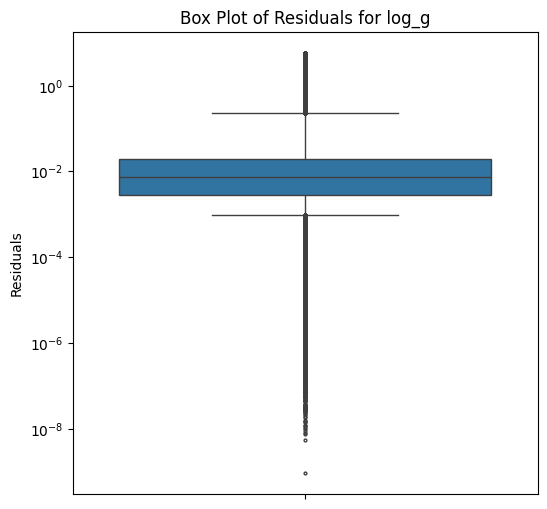

...

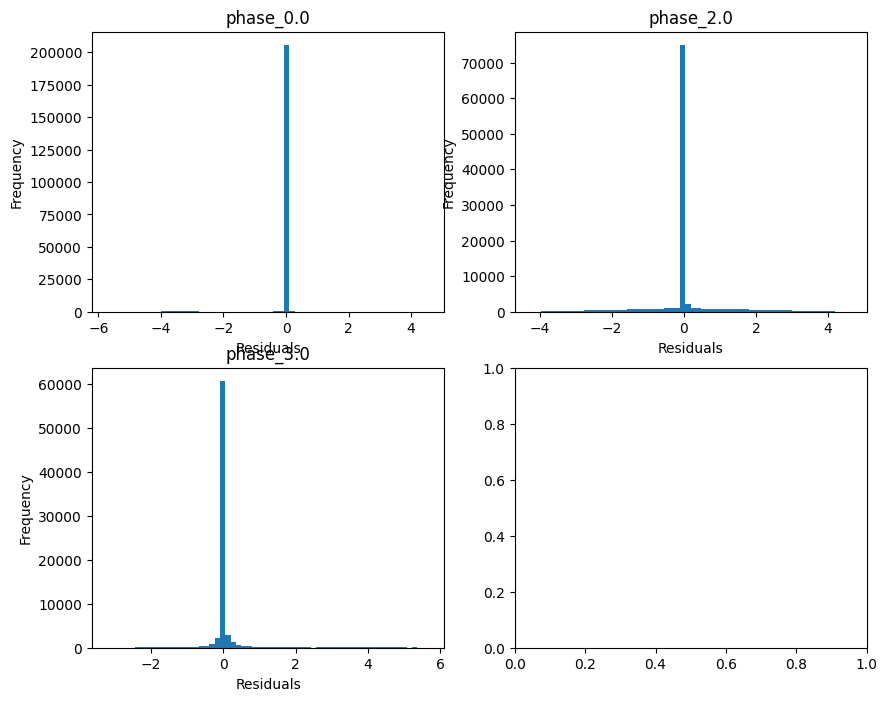

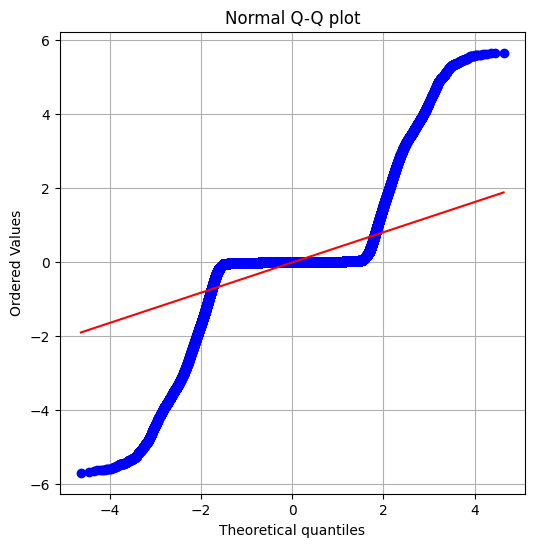

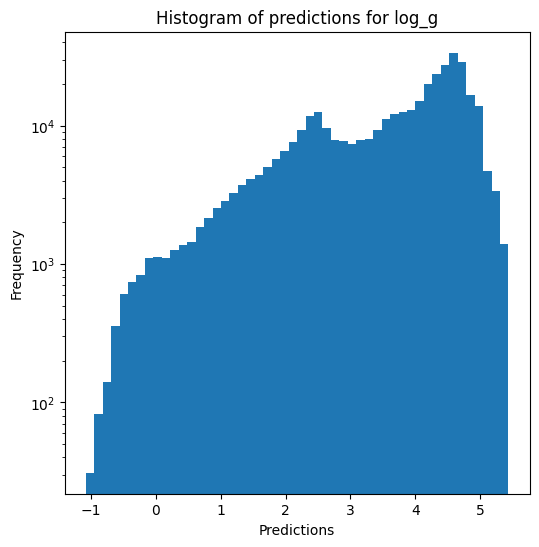

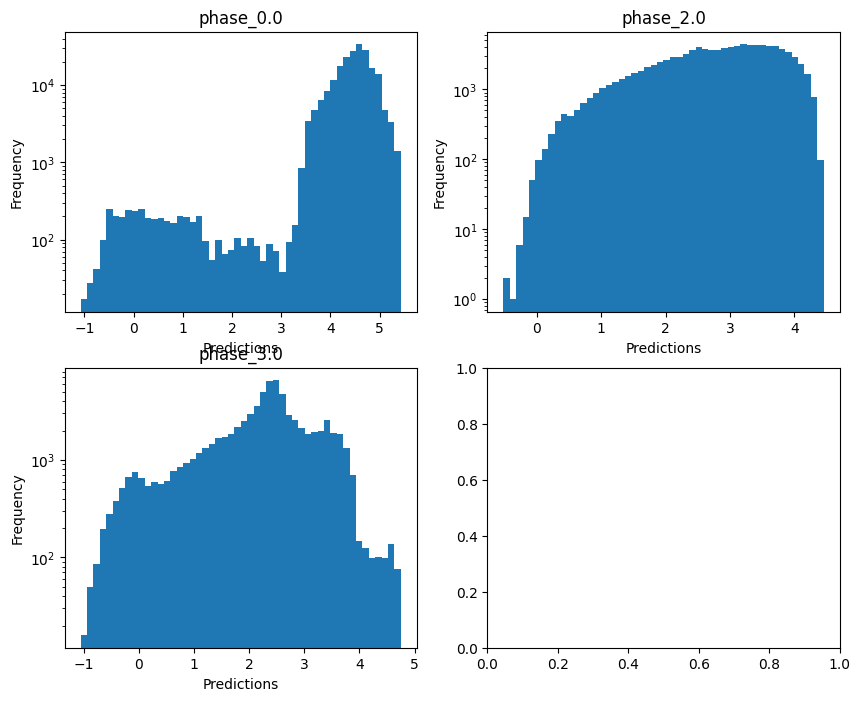

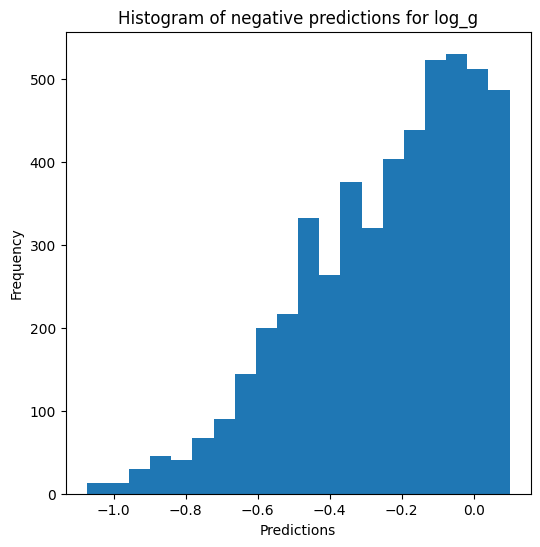


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.723666588130612
  RMSE :  0.22294773685373145
  MAE :  0.030612713116941293
  MedAE :  0.0024820844491514893
  CORR :  0.887179018293916
  MAX_ER :  2.84673517851732
  Percentiles : 
    75th percentile :  0.004663966649403051
    90th percentile :  0.007961389767700429
    95th percentile :  0.012258576280005746
    99th percentile :  1.5893419713736314

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  -0.0280904897023162
  RMSE :  0.47191465179294845
  MAE :  0.20959501818006418
  MedAE :  0.009154072903988286
  CORR :  0.49829477296218494
  MAX_ER :  2.3190299467163435
  Percentiles : 
    75th percentile :  0.1222847056798928
    90th percentile :  0.8763563172094623
    95th percentile :  1.2630914474893096
    99th percentile :  1.7696302821343683

radius results for the phase cate

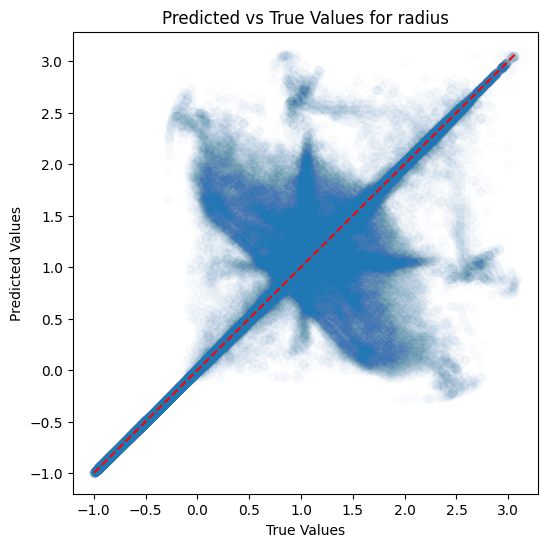

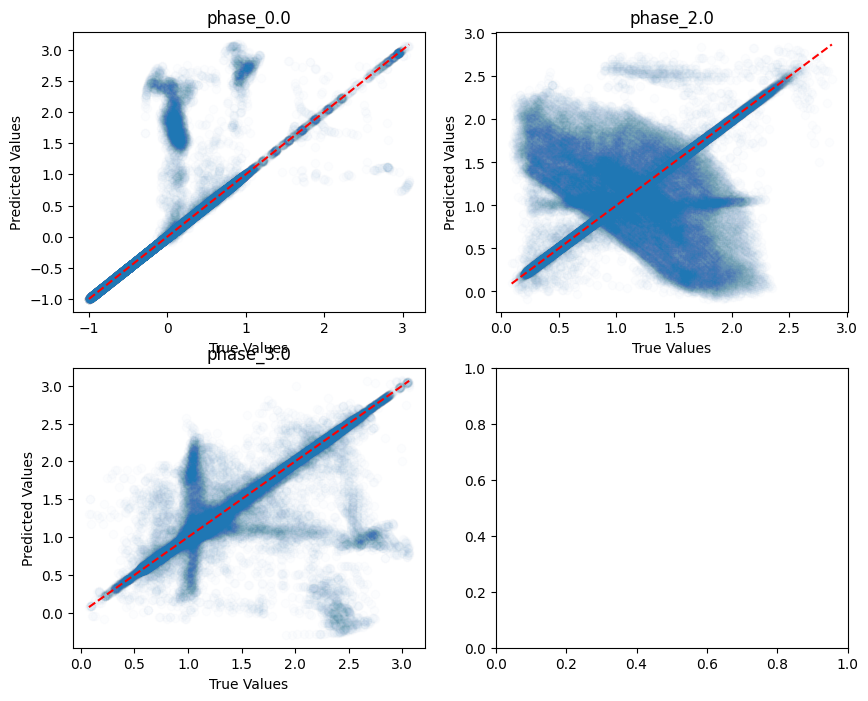

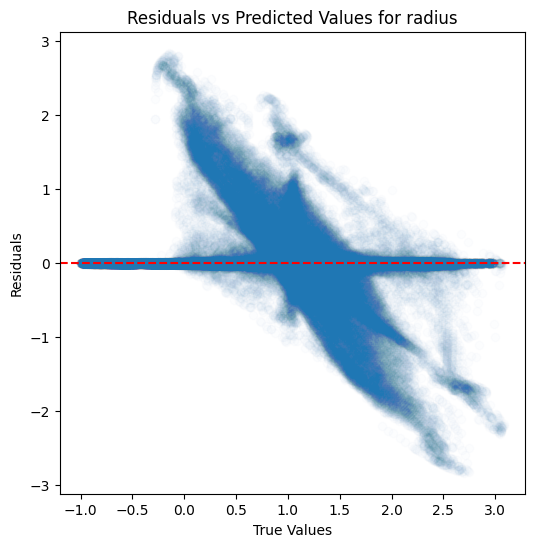

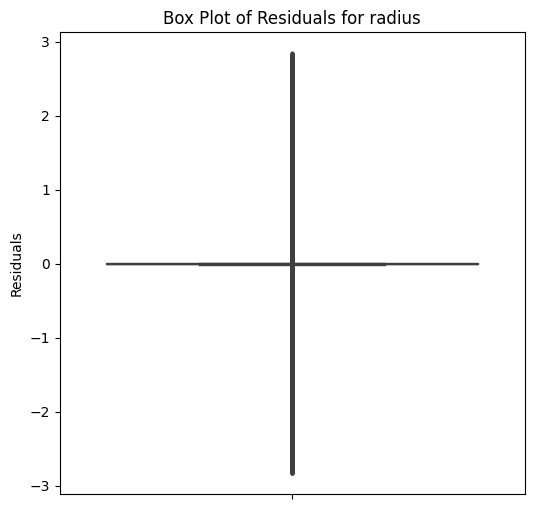

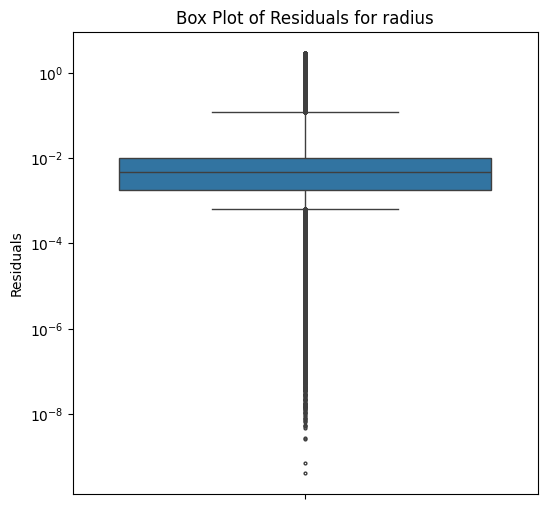

...

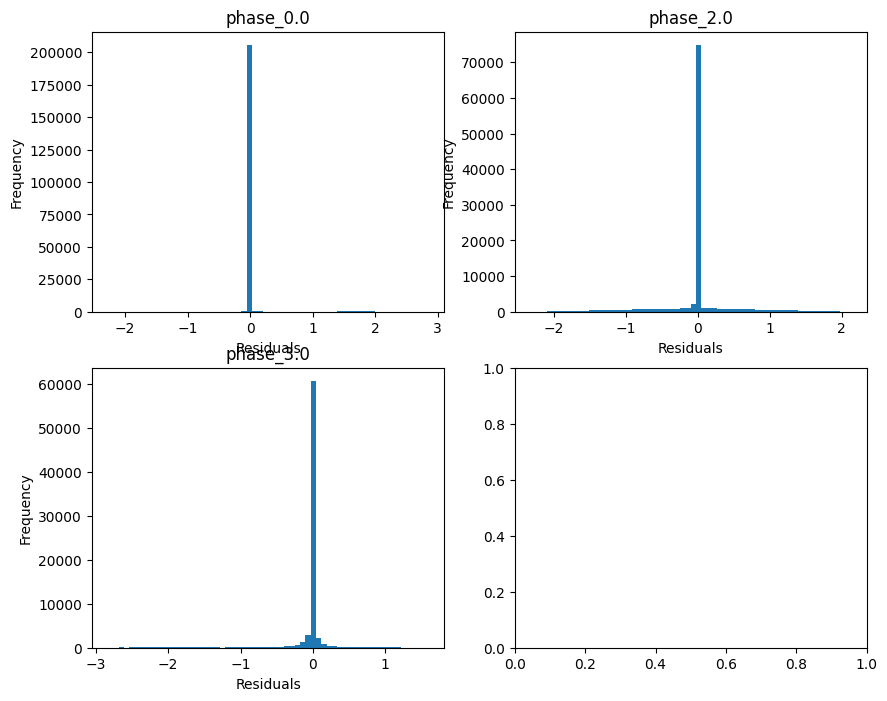

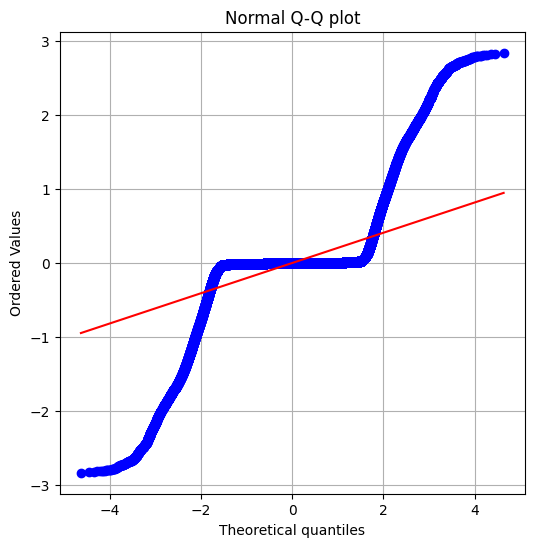

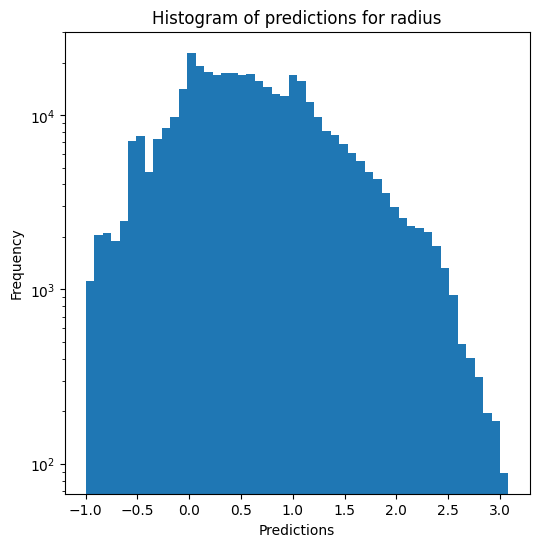

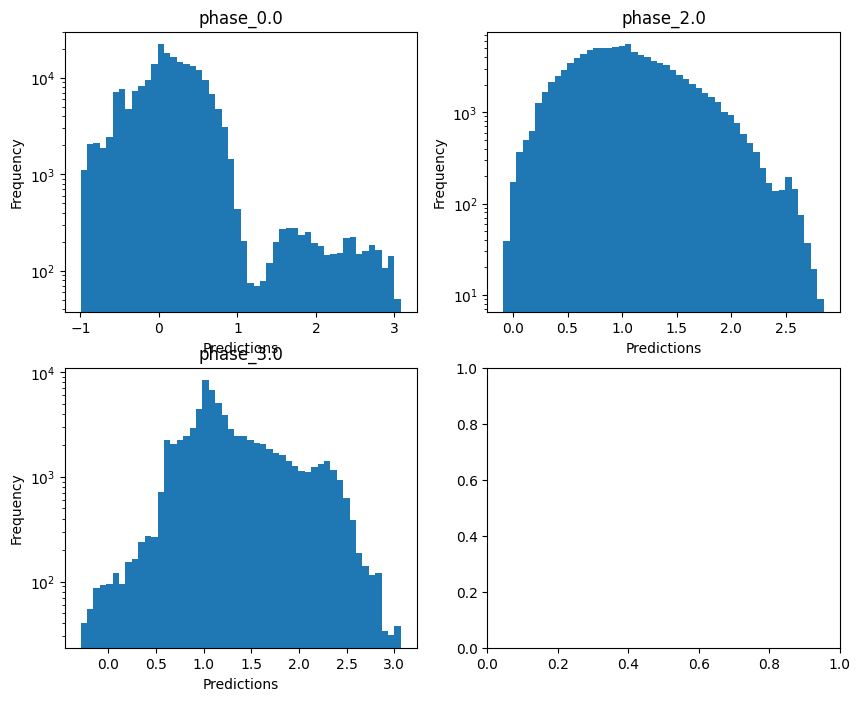

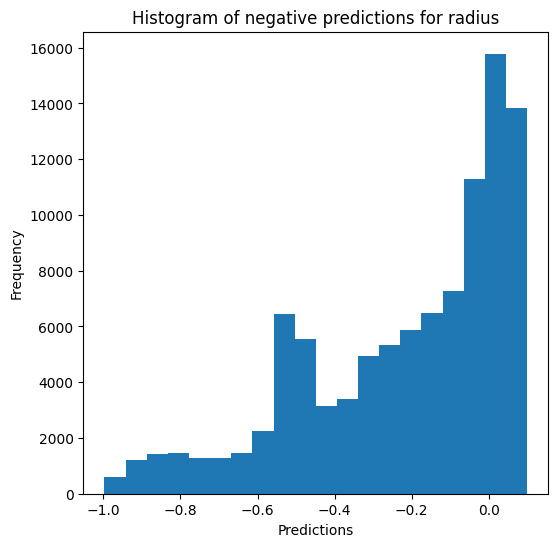

Saving predictions and results...


In [13]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### K-nearest neighbours

In [14]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_power_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9854290276634738
  RMSE :  0.03609579846297717
  MAE :  0.005382918221544262
  MedAE :  0.0010166577717538594
  CORR :  0.9927486988783154
  MAX_ER :  0.916834883708407
  Percentiles : 
    75th percentile :  0.0021129560490926735
    90th percentile :  0.0037938551169910185
    95th percentile :  0.005723302565516334
    99th percentile :  0.1200999469608406

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.97241539388603
  RMSE :  0.0408063742590493
  MAE :  0.018298024507928543
  MedAE :  0.002664988762710596
  CORR :  0.9861266431478806
  MAX_ER :  0.6260565282565982
  Percentiles : 
    75th percentile :  0.015498387502951183
    90th percentile :  0.06208175015086

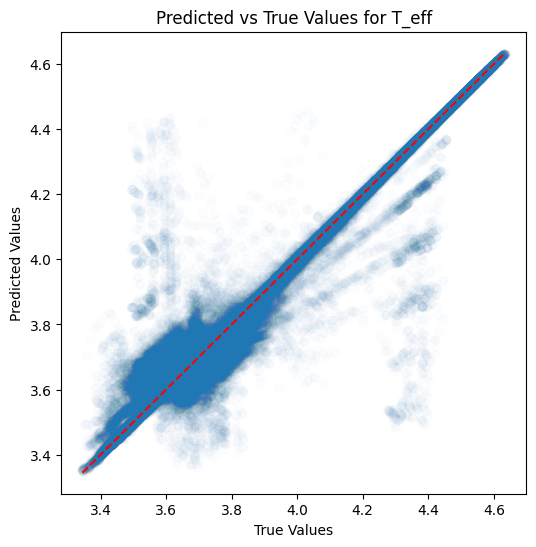

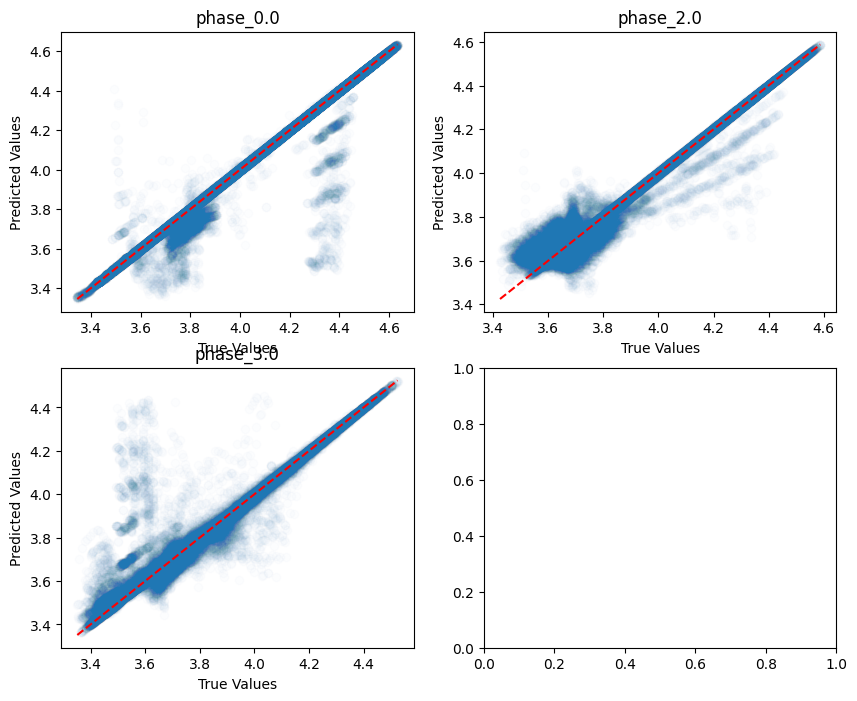

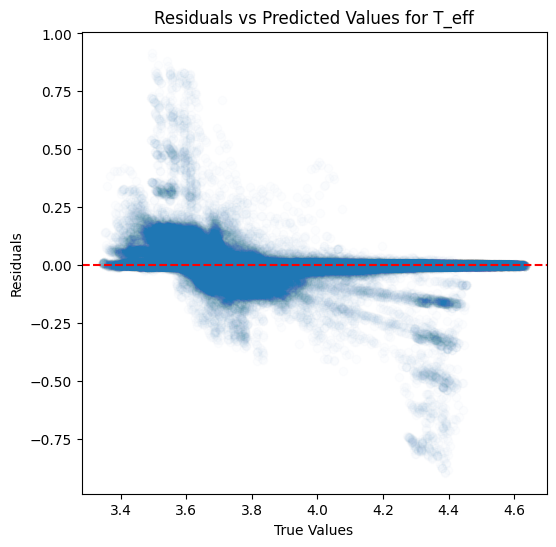

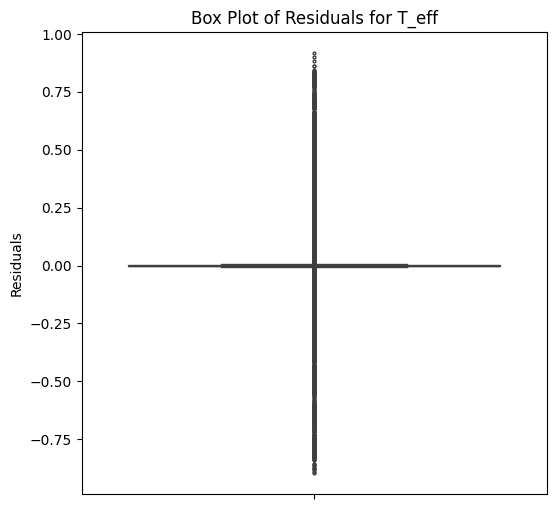

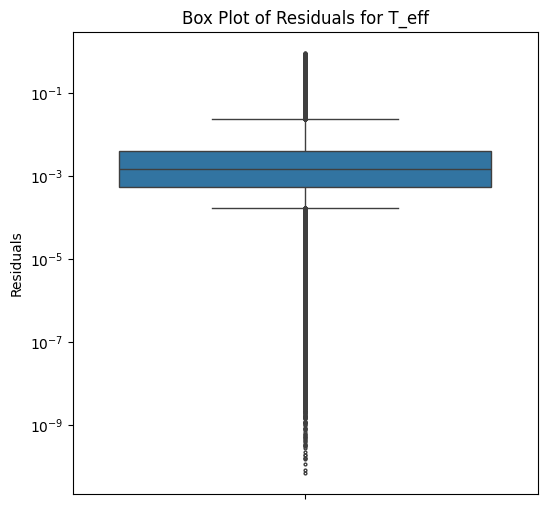

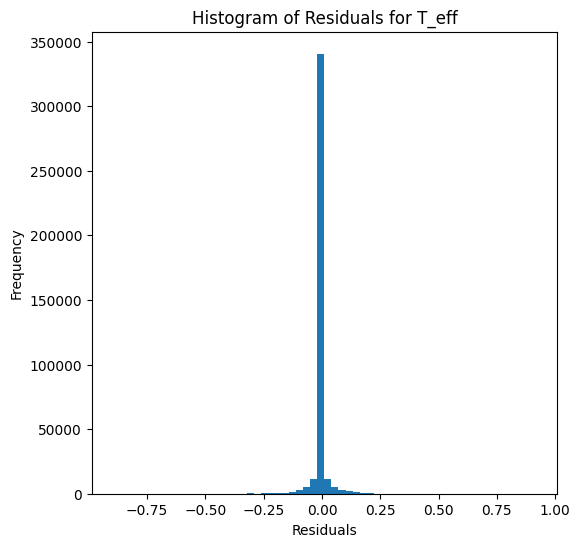

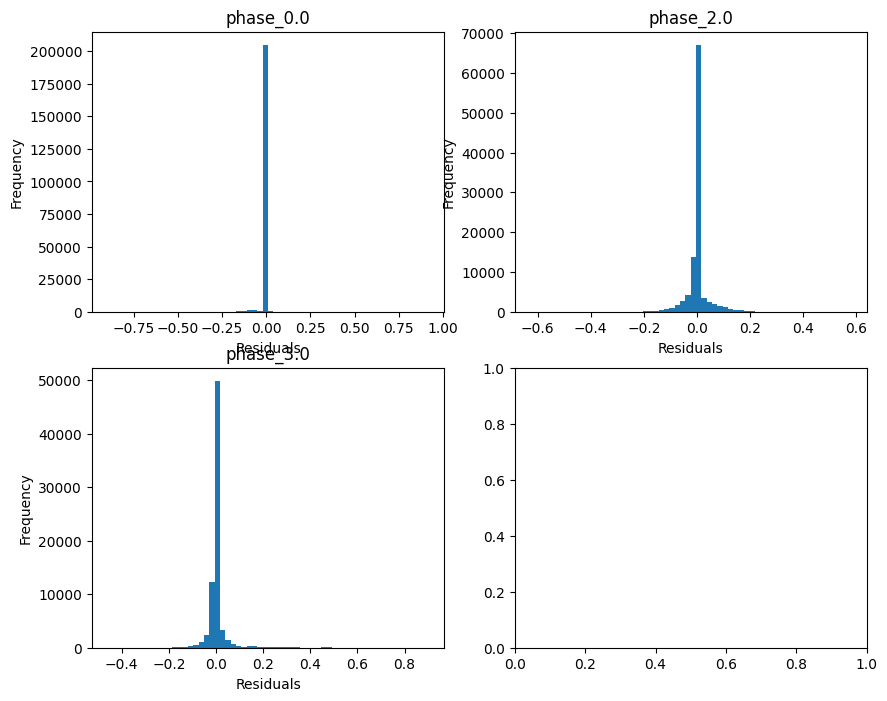

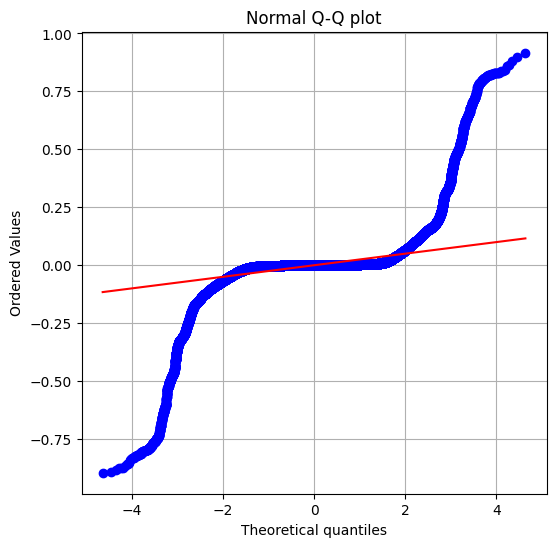

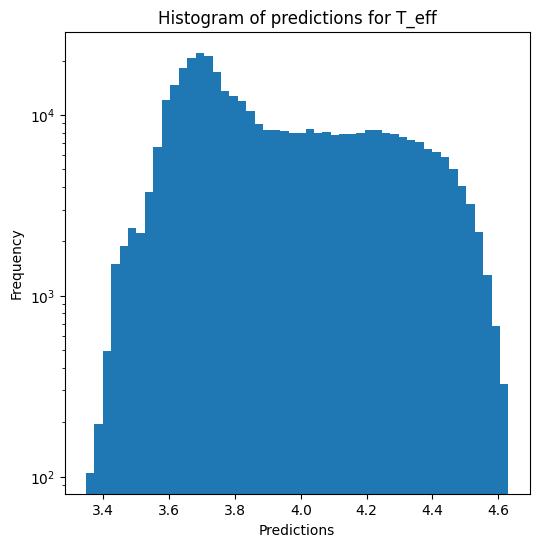

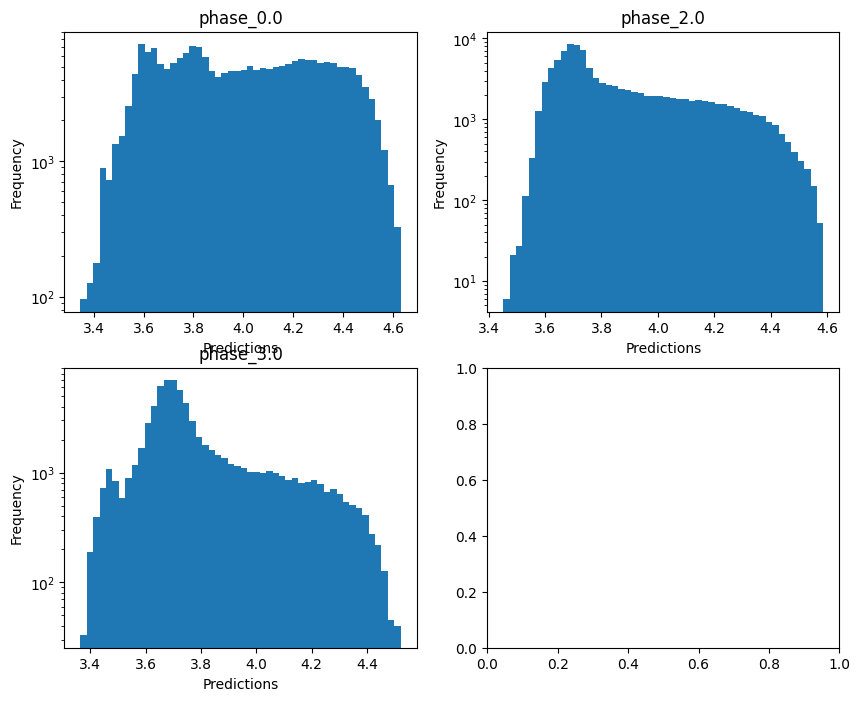


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.5208540081446053
  RMSE :  0.3181859904063404
  MAE :  0.04640338250158773
  MedAE :  0.0022567706649025965
  CORR :  0.8355624028574229
  MAX_ER :  5.545795164845766
  Percentiles : 
    75th percentile :  0.005215899427871484
    90th percentile :  0.010707106763407925
    95th percentile :  0.017362555378668522
    99th percentile :  1.7253175179631888

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.5303307888658075
  RMSE :  0.636220905859843
  MAE :  0.29393574437198045
  MedAE :  0.013094017815075243
  CORR :  0.7349641672633209
  MAX_ER :  4.330710890208363
  Percentiles : 
    75th percentile :  0.3129302596942062
    90th percentile :  1.126167359044974
    95th percentile :  1.5956127808920144
    99th percentile :  2.408176926580269

log_g results for the phase category wit

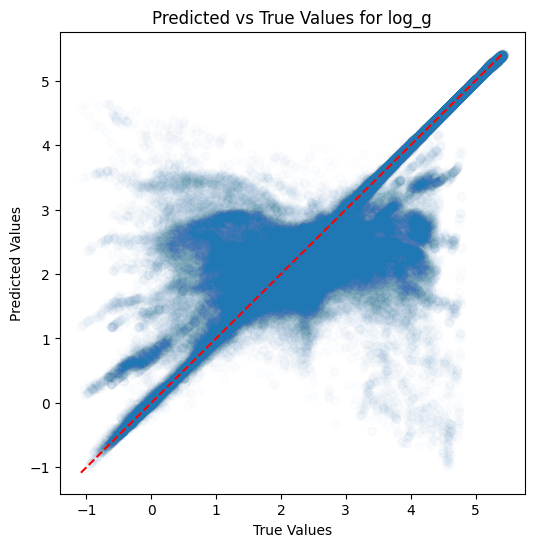

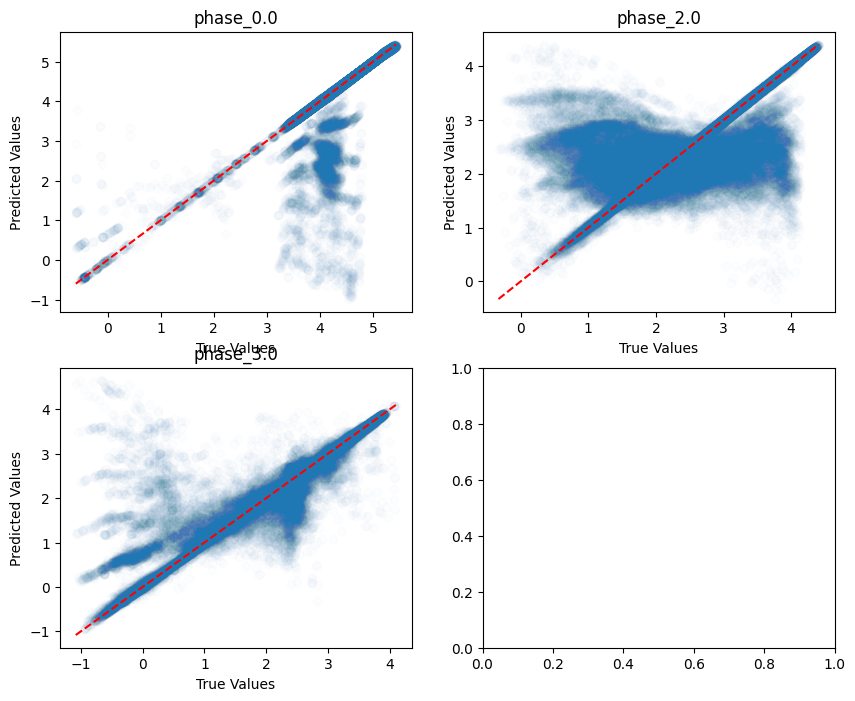

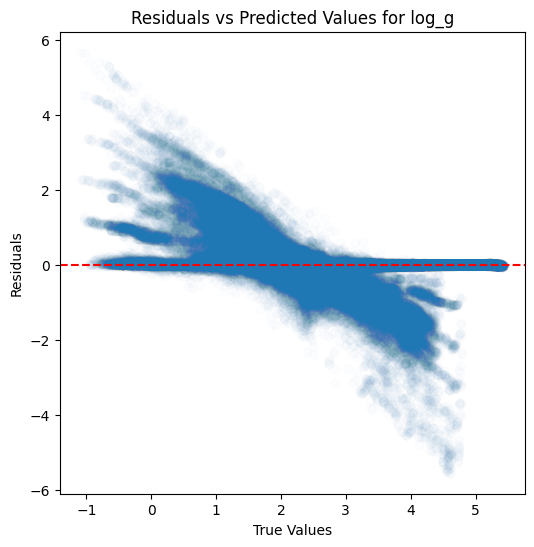

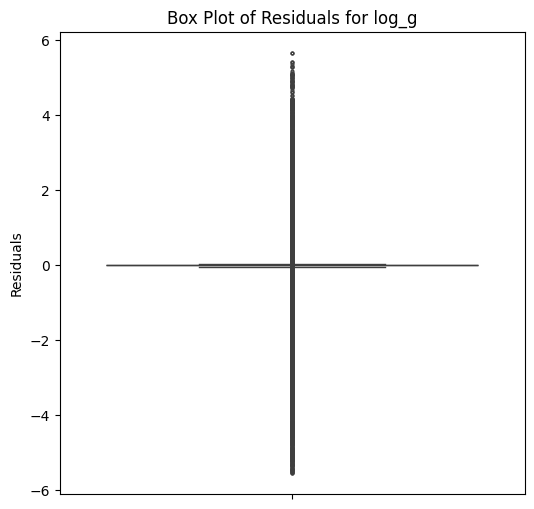

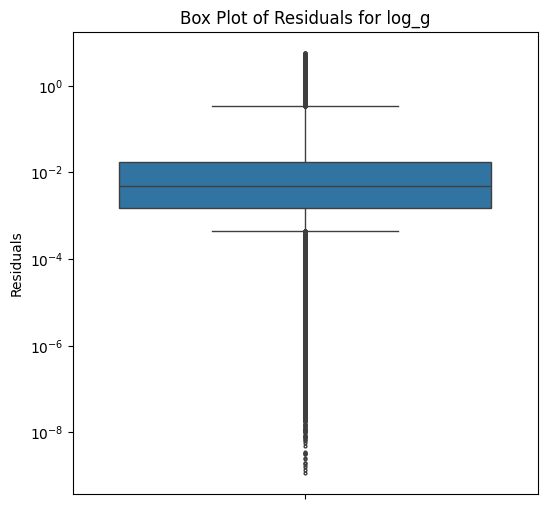

...

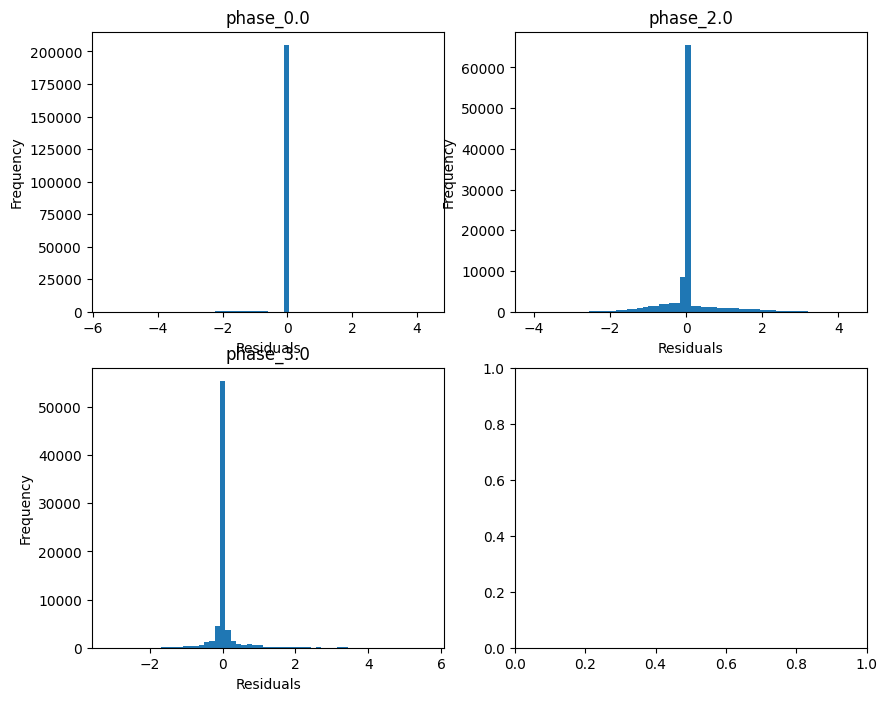

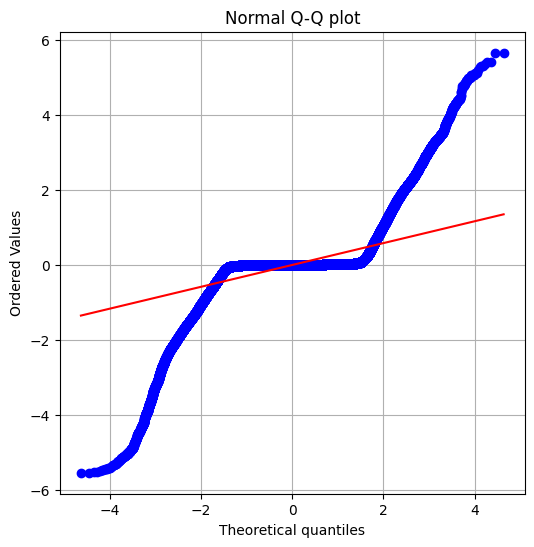

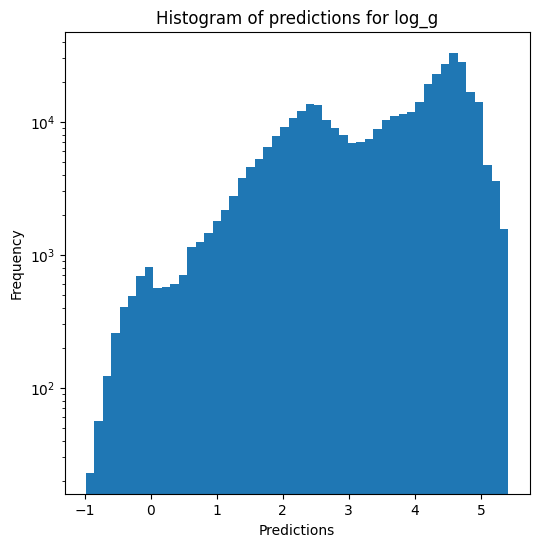

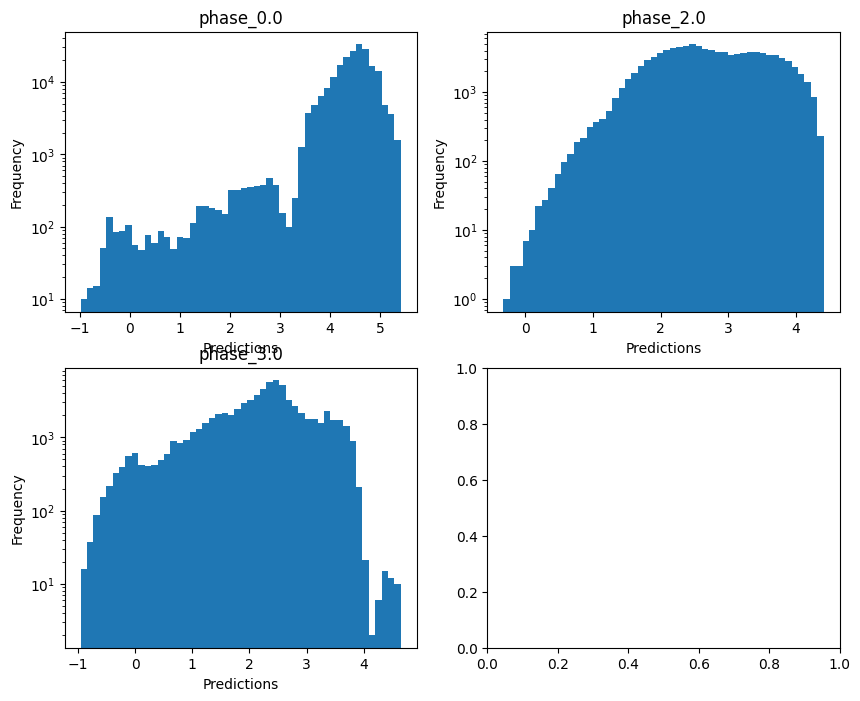

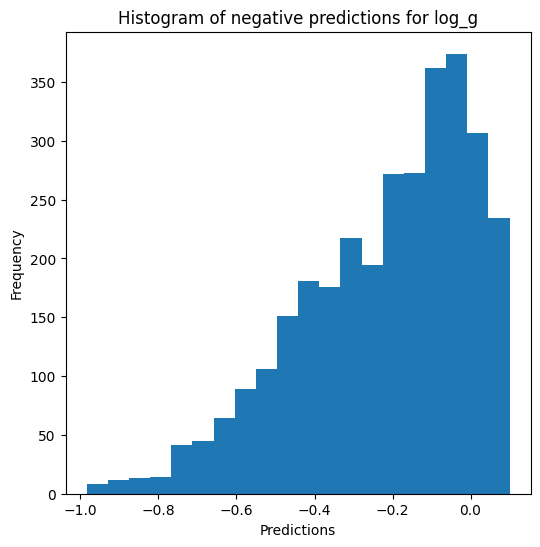


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.8596727221683853
  RMSE :  0.15915362184866327
  MAE :  0.02433387021900528
  MedAE :  0.001990582480535019
  CORR :  0.9373596330878264
  MAX_ER :  2.774405485576776
  Percentiles : 
    75th percentile :  0.0040249981966899995
    90th percentile :  0.007994752215530298
    95th percentile :  0.012815246626933388
    99th percentile :  0.8632649092447063

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.5333202486637145
  RMSE :  0.31810458821123166
  MAE :  0.14697224074986928
  MedAE :  0.006561186143741959
  CORR :  0.7405955760309848
  MAX_ER :  2.16546836611197
  Percentiles : 
    75th percentile :  0.15646983275236662
    90th percentile :  0.5631670973370123
    95th percentile :  0.7978390344350159
    99th percentile :  1.2041530257138433

radius results for the phase categ

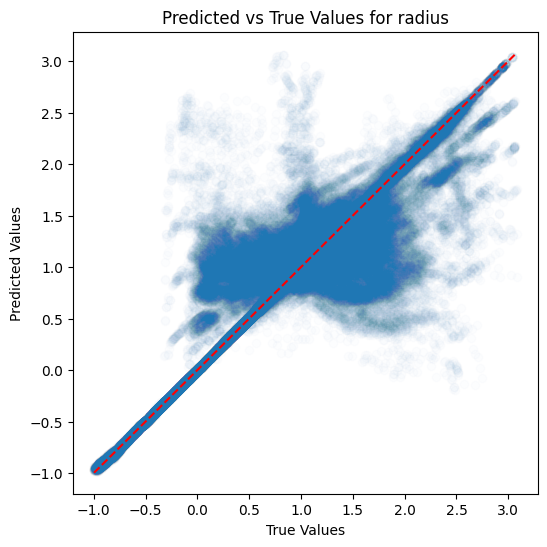

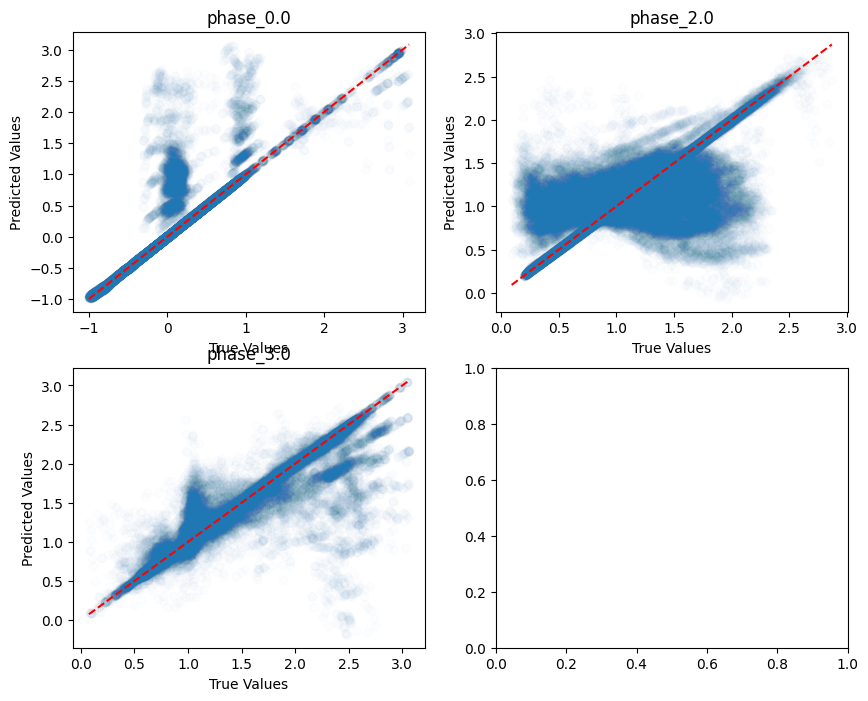

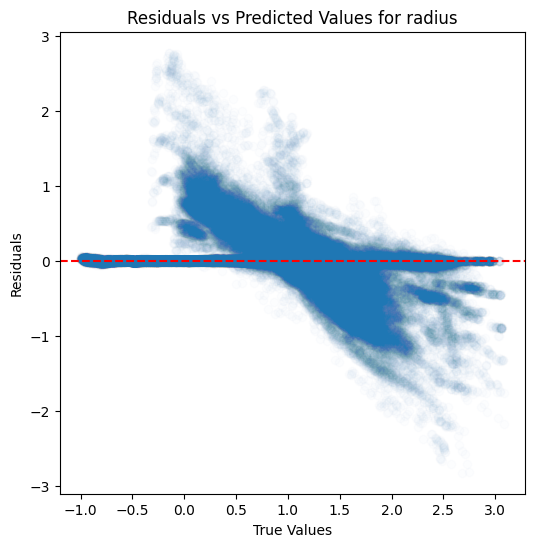

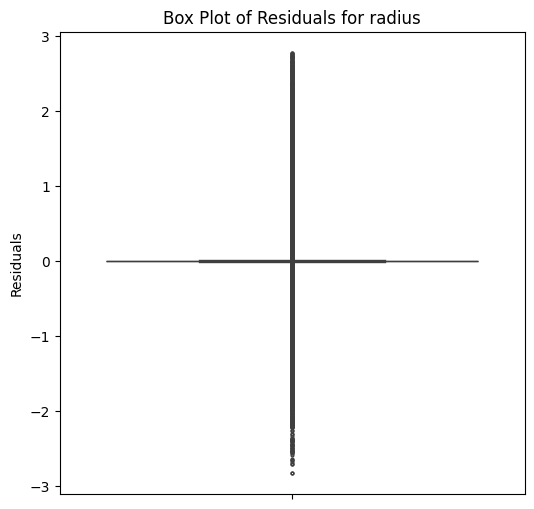

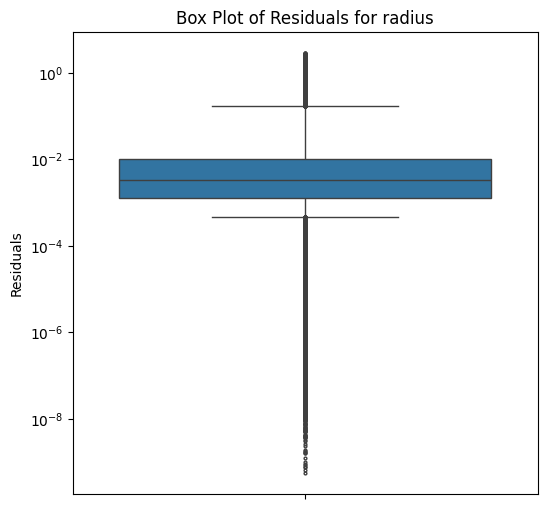

...

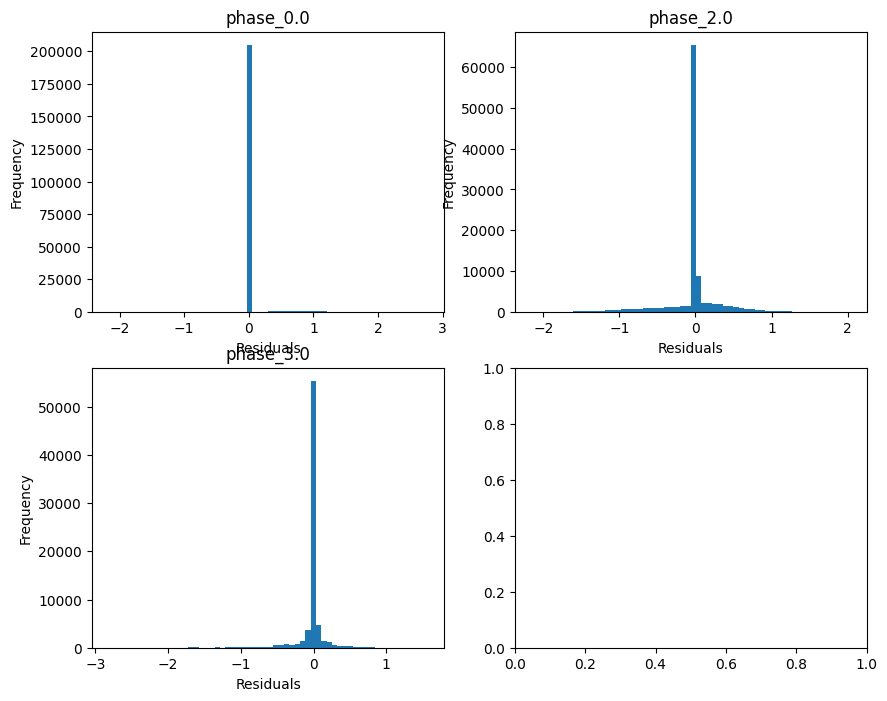

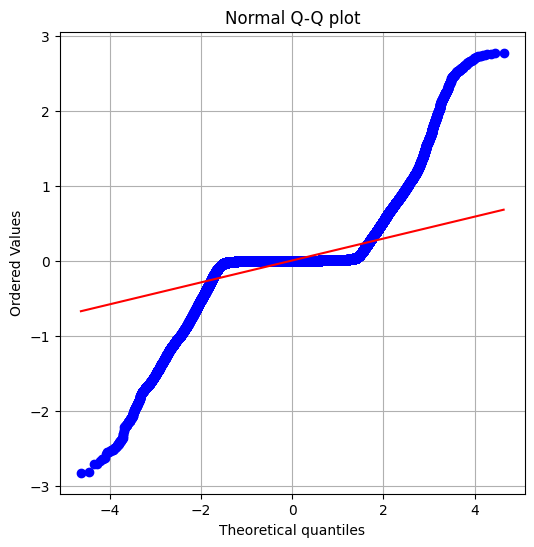

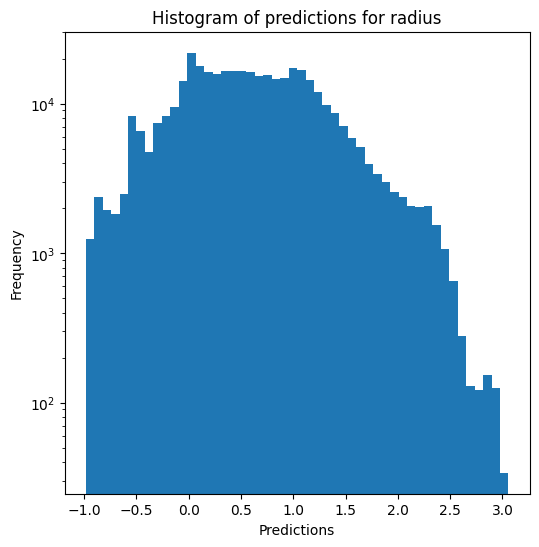

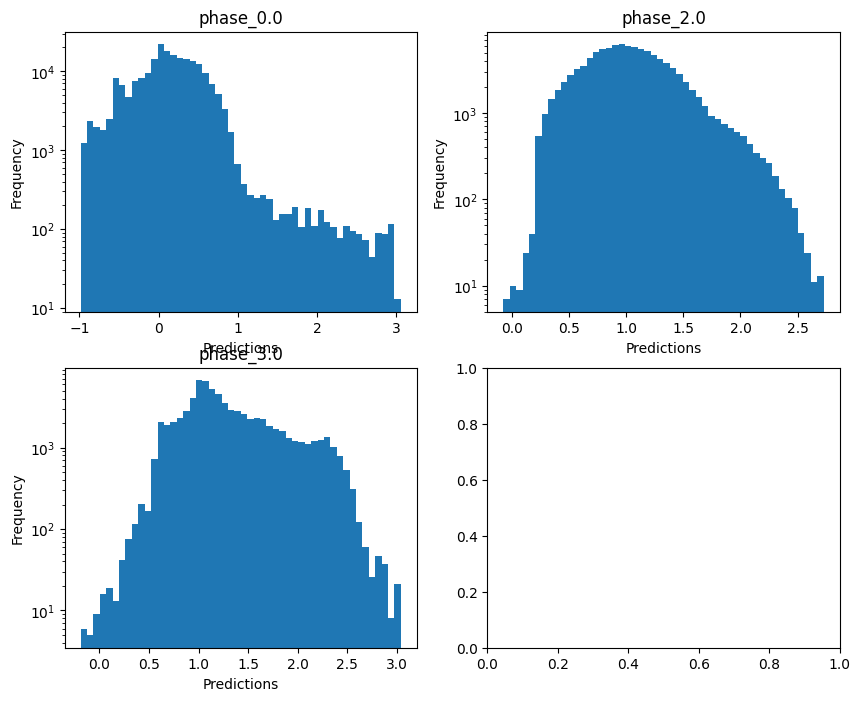

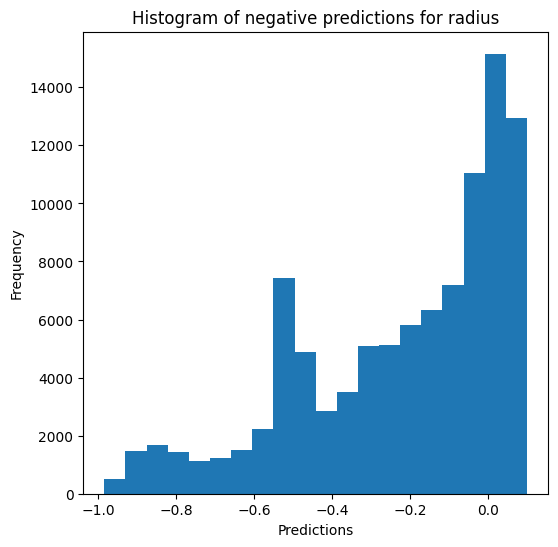

Saving predictions and results...


In [15]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### Random forests

In [16]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_power_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.981368023714159
  RMSE :  0.040873181907743514
  MAE :  0.005961175399574373
  MedAE :  0.0005303343934794924
  CORR :  0.9907512478237867
  MAX_ER :  0.8894343124943829
  Percentiles : 
    75th percentile :  0.0013044240742079438
    90th percentile :  0.003572801388518166
    95th percentile :  0.008645497073066355
    99th percentile :  0.14034010812257514

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.9556078614487346
  RMSE :  0.05176272941904249
  MAE :  0.022230301519592818
  MedAE :  0.0026405278860077708
  CORR :  0.9775616415495514
  MAX_ER :  0.7097801636521002
  Percentiles : 
    75th percentile :  0.017751526335801904
    90th percentile :  0.076983875

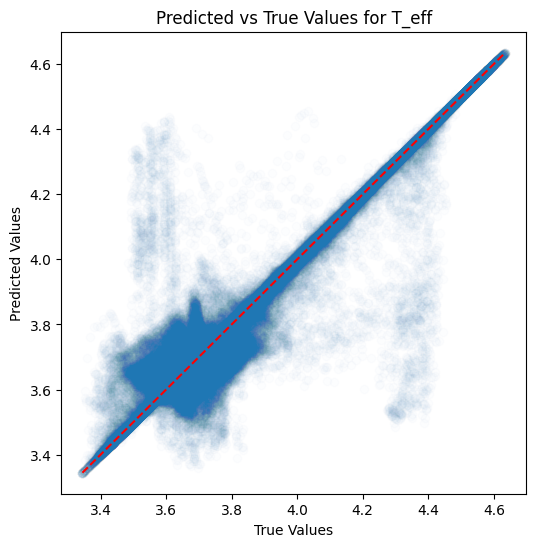

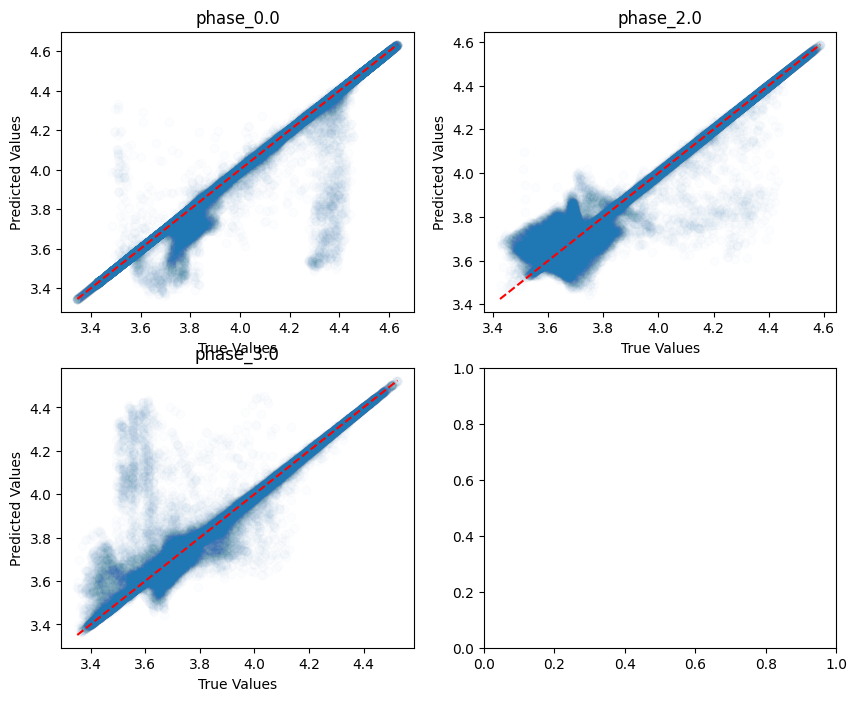

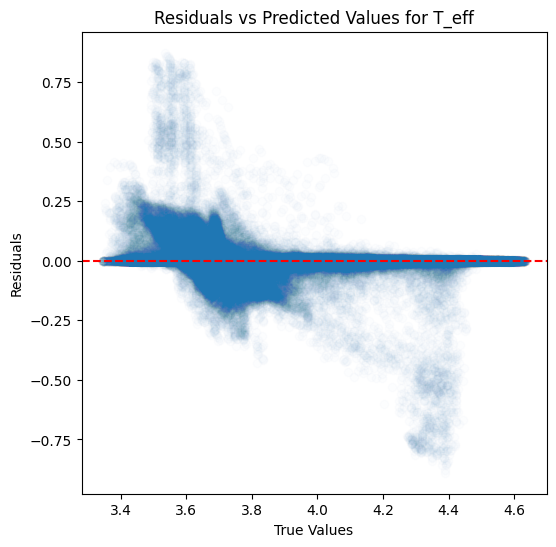

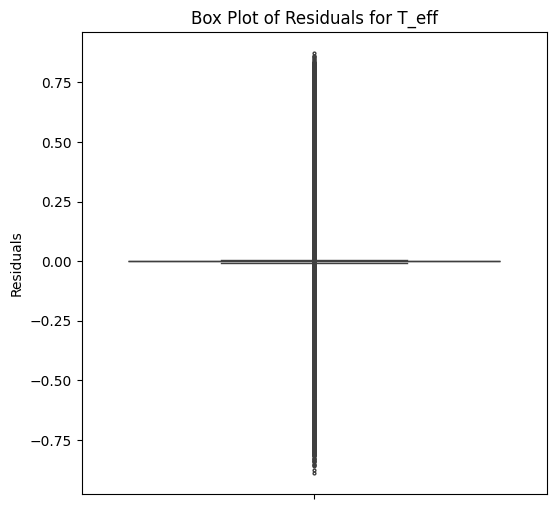

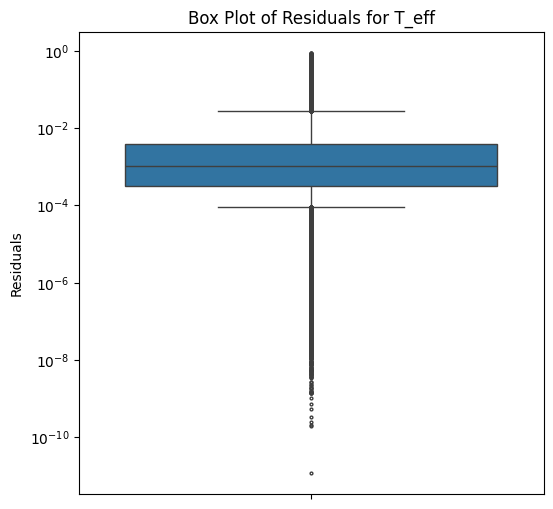

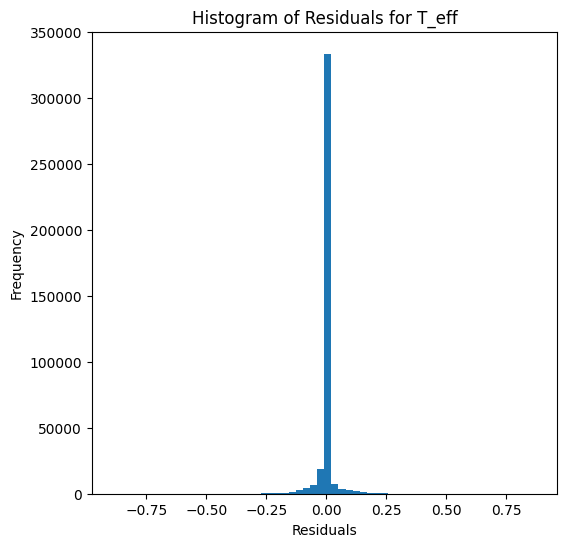

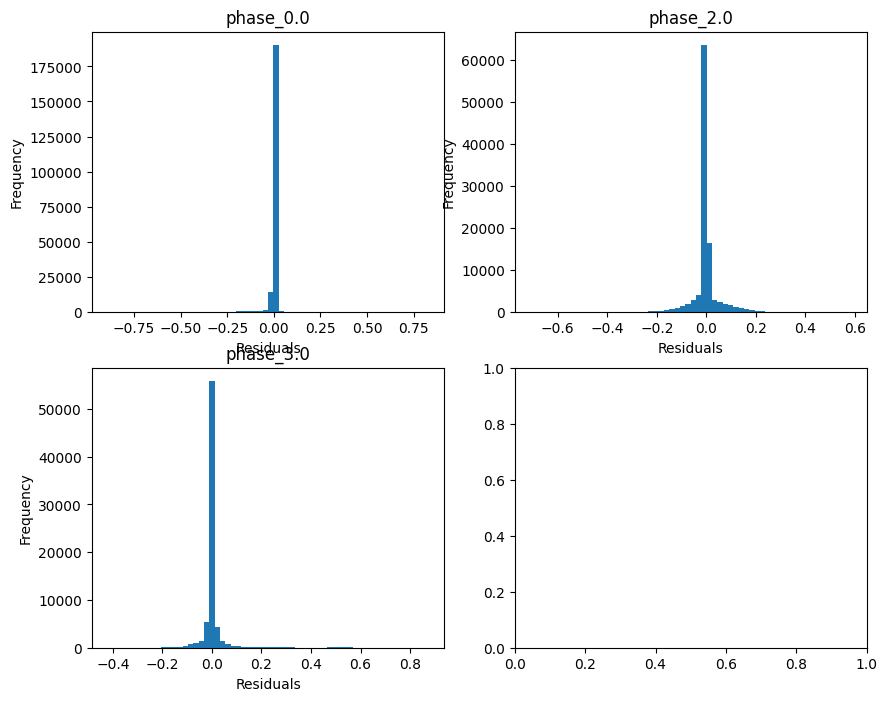

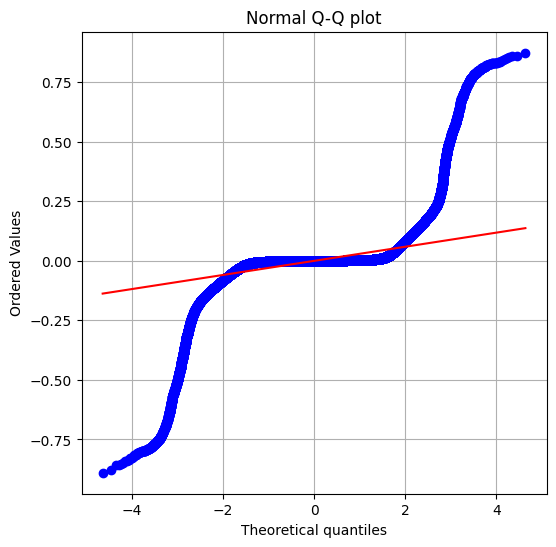

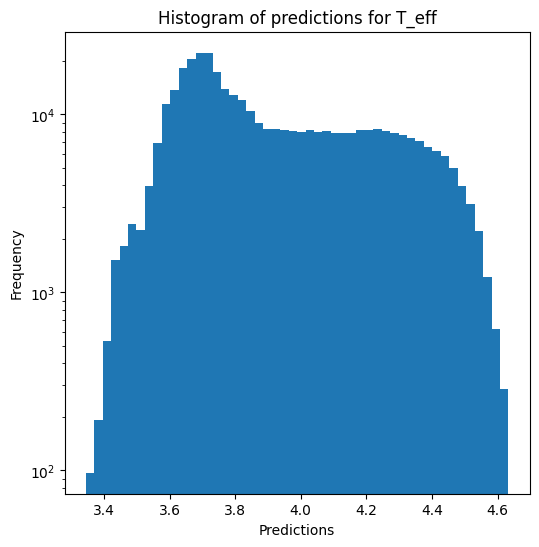

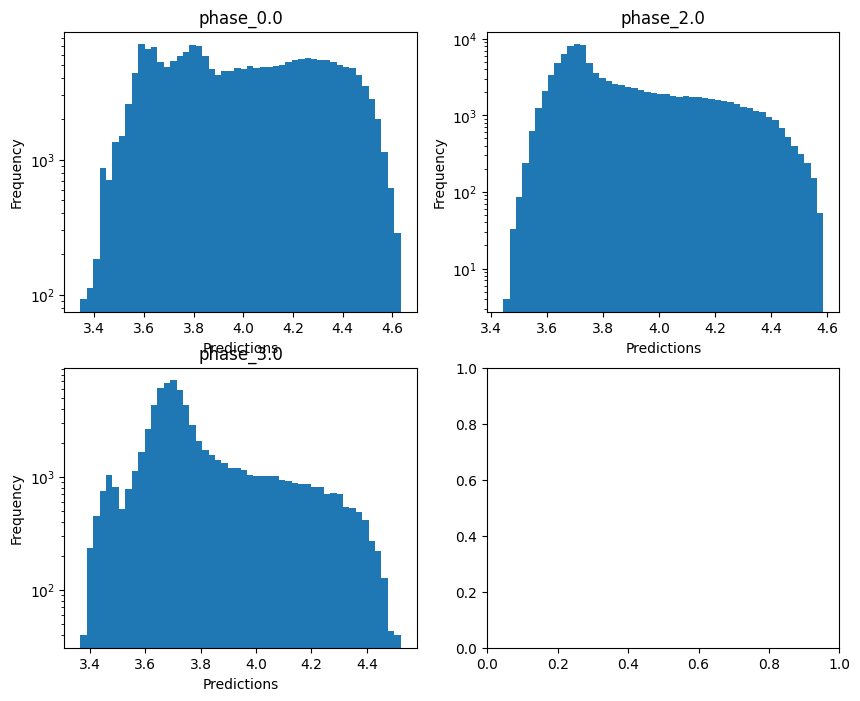


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.41010575233199464
  RMSE :  0.3536334494414807
  MAE :  0.05498122219781998
  MedAE :  0.0015250222125411383
  CORR :  0.8118095338764898
  MAX_ER :  5.575584576169203
  Percentiles : 
    75th percentile :  0.004199768448425623
    90th percentile :  0.01230945961662702
    95th percentile :  0.04560738006753954
    99th percentile :  2.154422130525548

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.287331746870526
  RMSE :  0.7836284624178604
  MAE :  0.3593458435468233
  MedAE :  0.013455030962731485
  CORR :  0.6035789396955819
  MAX_ER :  4.497984002676005
  Percentiles : 
    75th percentile :  0.3323241936442761
    90th percentile :  1.4364451749470926
    95th percentile :  2.0141358496571953
    99th percentile :  2.971666661823358

log_g results for the phase category with 

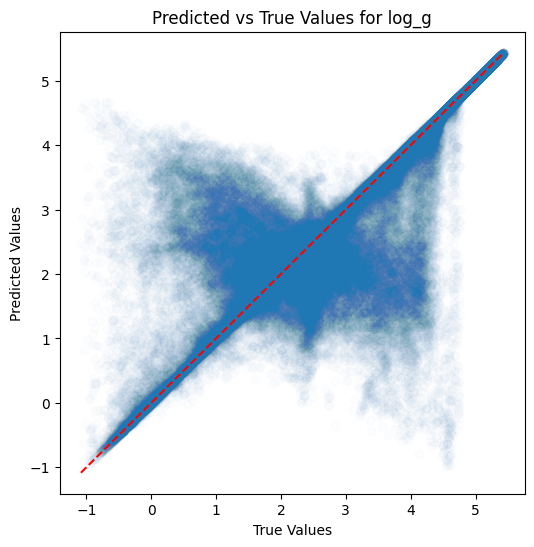

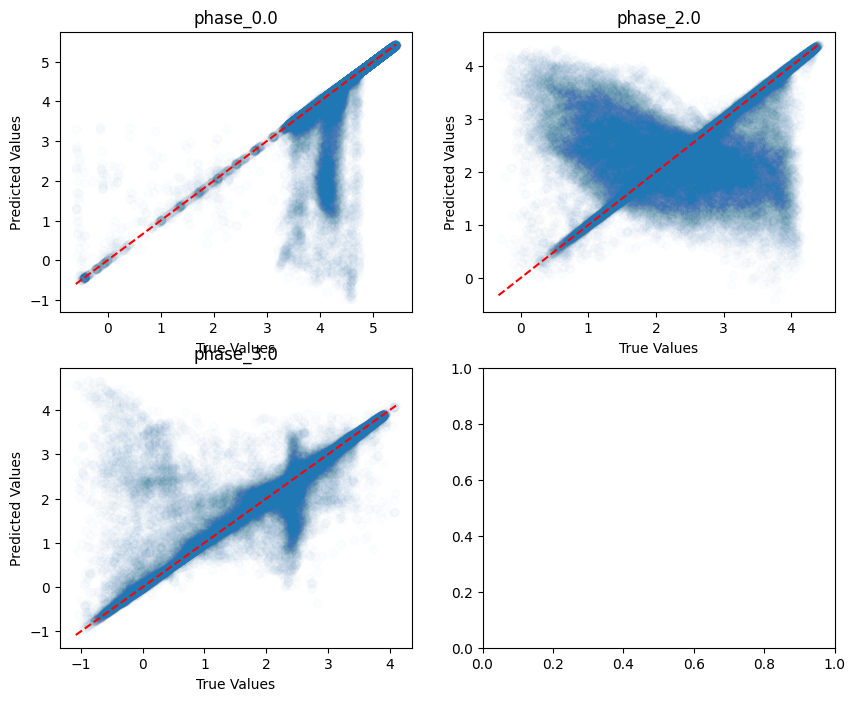

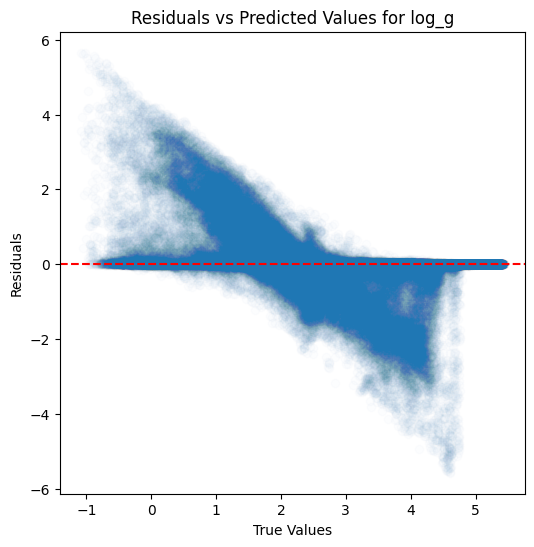

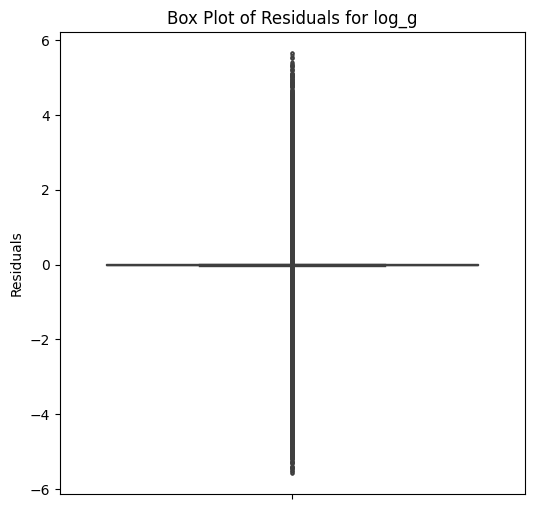

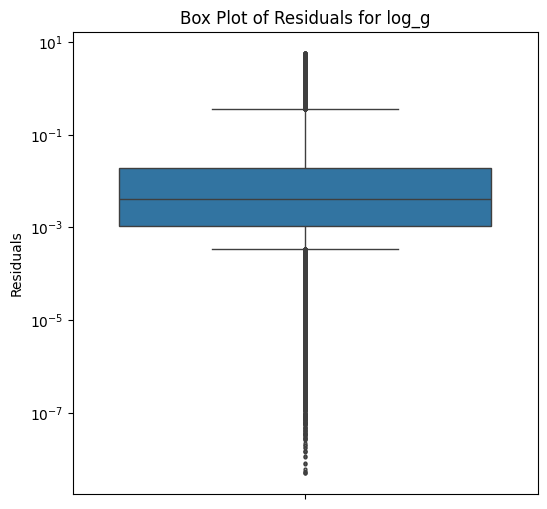

...

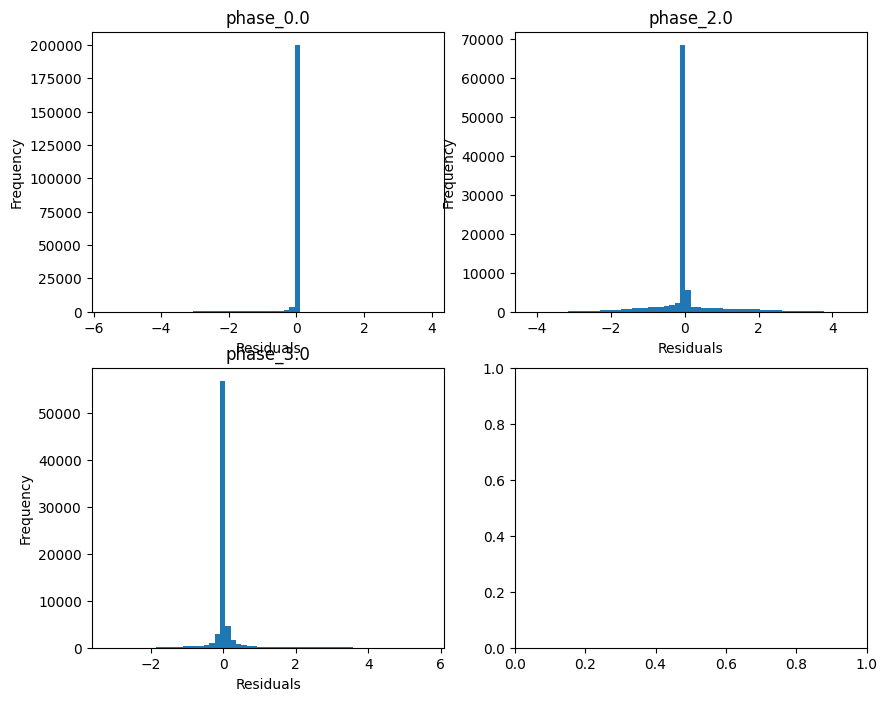

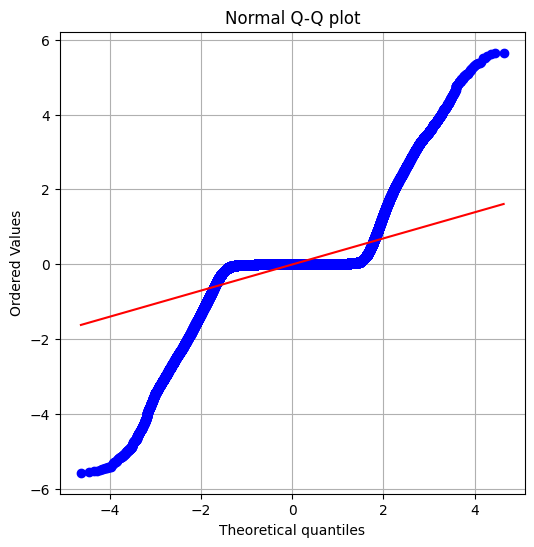

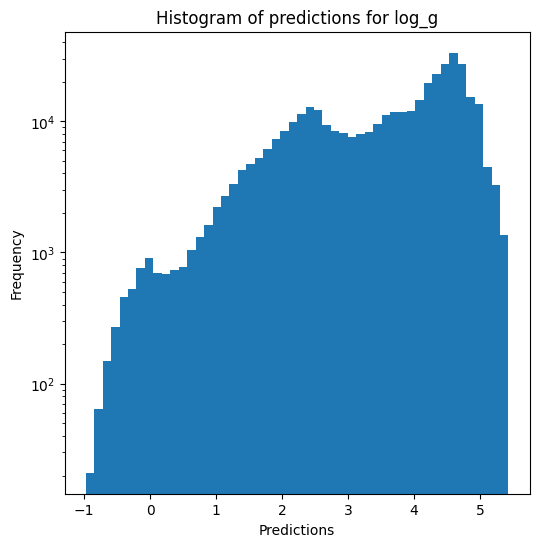

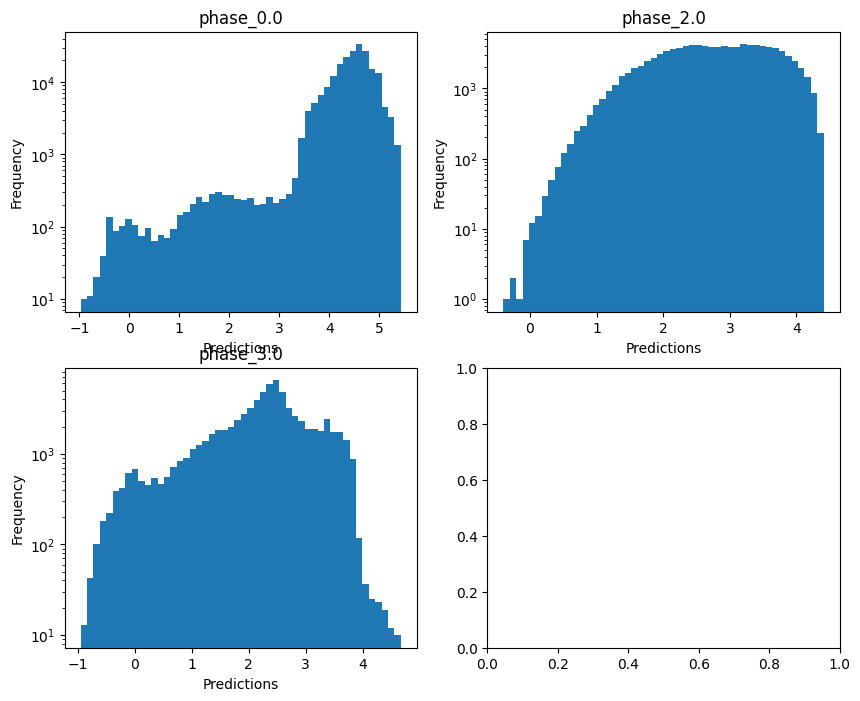

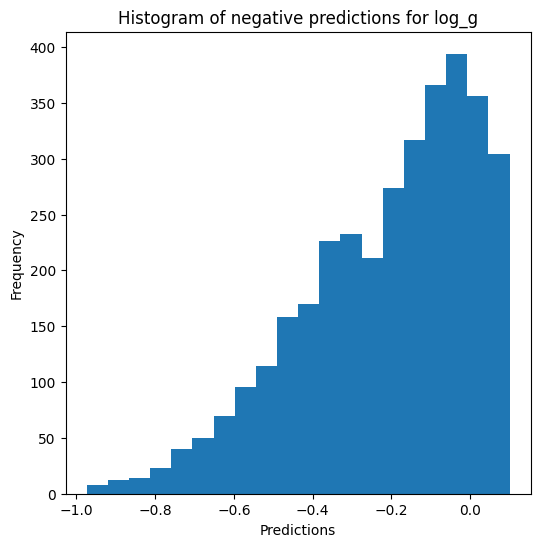


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.8273221778206018
  RMSE :  0.17683482312229024
  MAE :  0.0277168142536257
  MedAE :  0.0009723273233632132
  CORR :  0.9249891641140631
  MAX_ER :  2.789516803293309
  Percentiles : 
    75th percentile :  0.0024918554274448446
    90th percentile :  0.006733434359098574
    95th percentile :  0.023015794119402744
    99th percentile :  1.0773334826568355

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.2918756886661408
  RMSE :  0.3918050183169375
  MAE :  0.17967333954930864
  MedAE :  0.006740251181799051
  CORR :  0.6166448697132471
  MAX_ER :  2.249199914821532
  Percentiles : 
    75th percentile :  0.16616618707739006
    90th percentile :  0.7181765405471235
    95th percentile :  1.0069677723217427
    99th percentile :  1.486078087761946

radius results for the phase catego

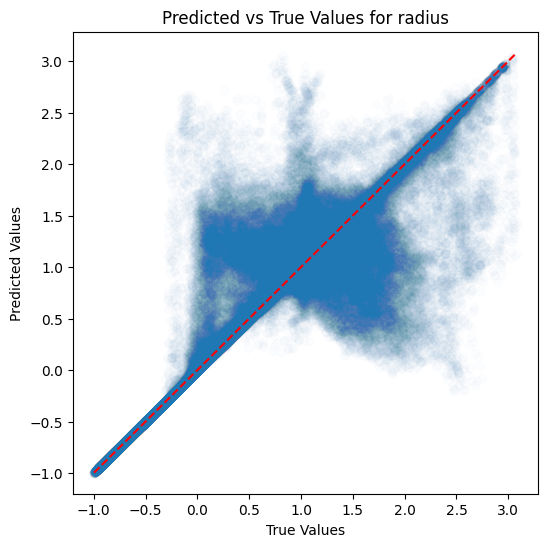

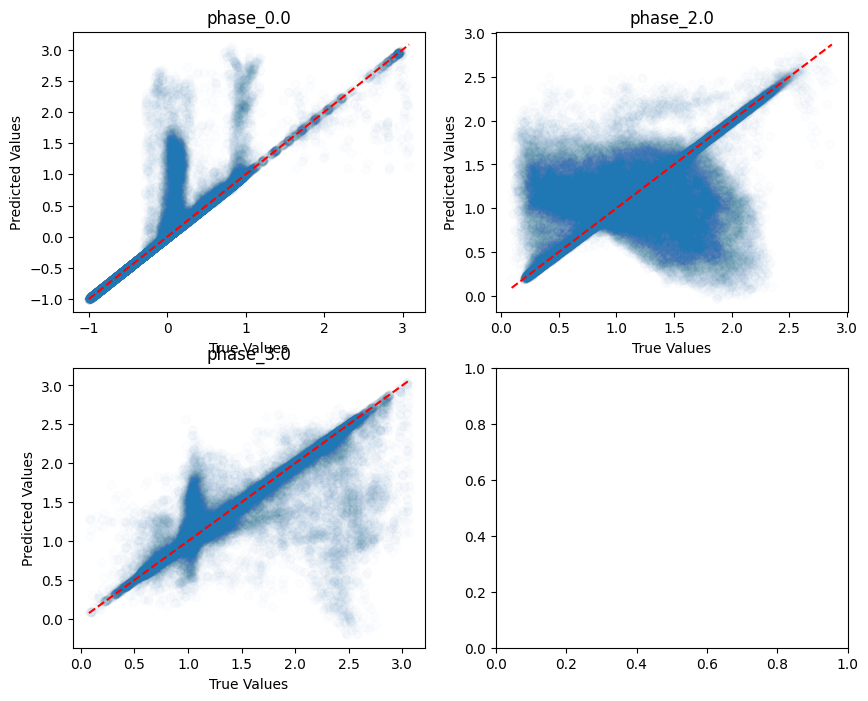

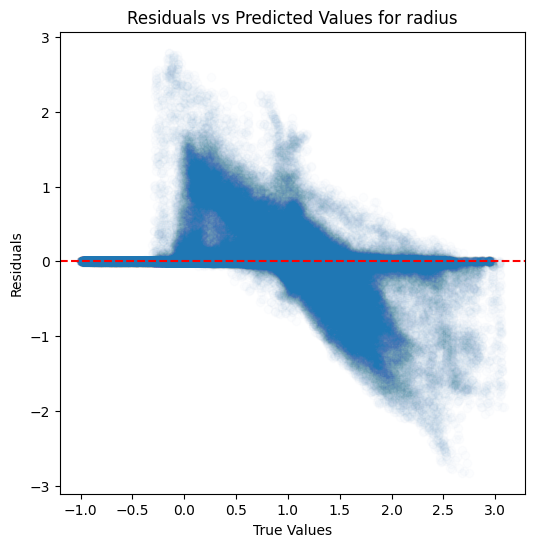

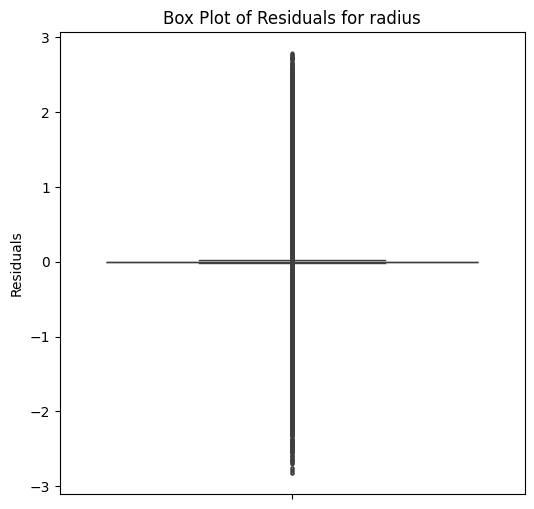

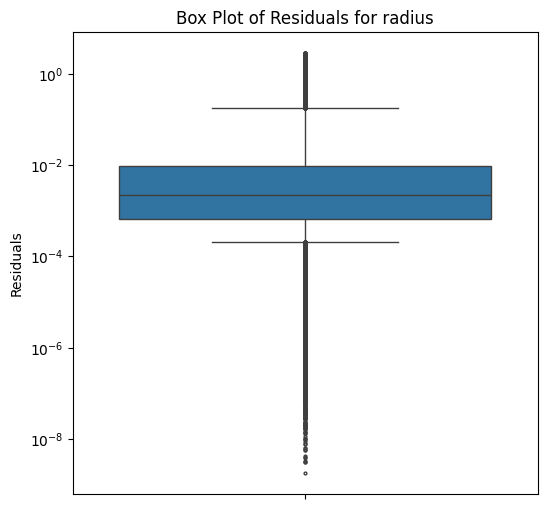

...

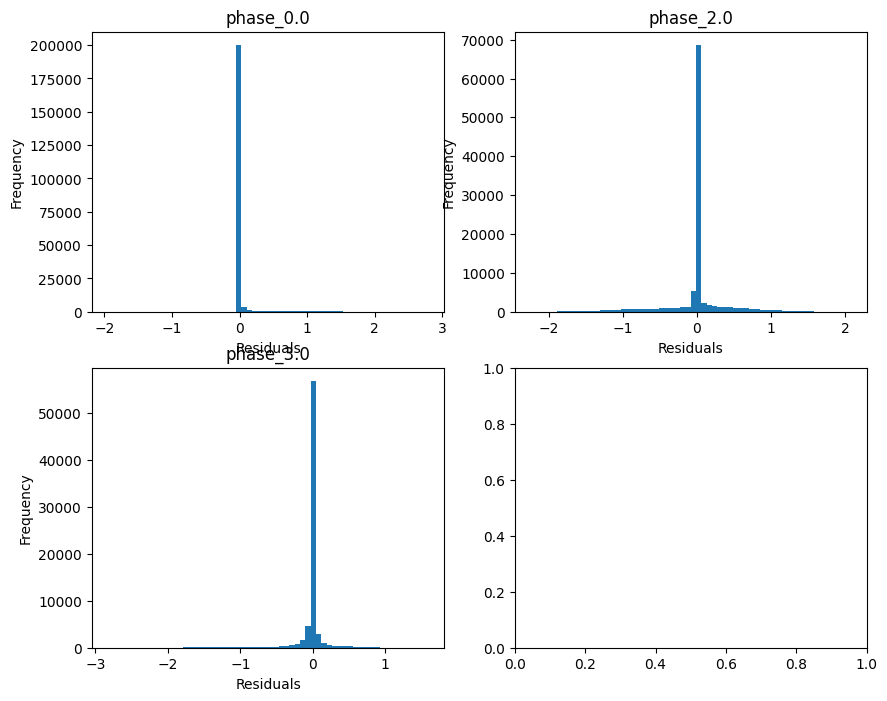

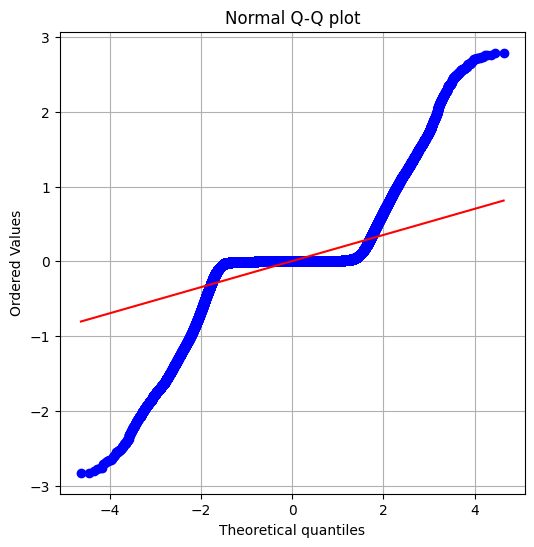

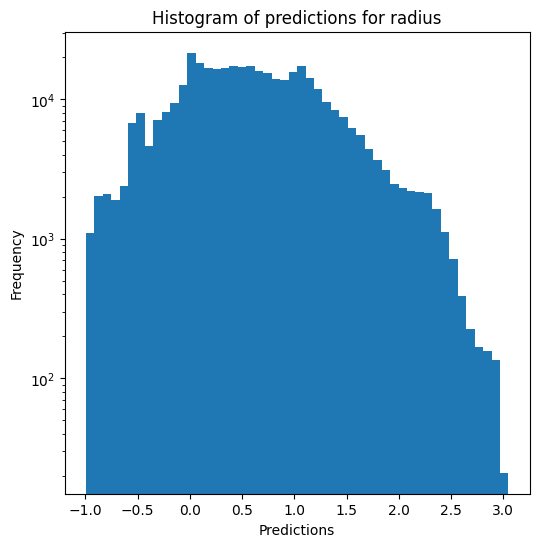

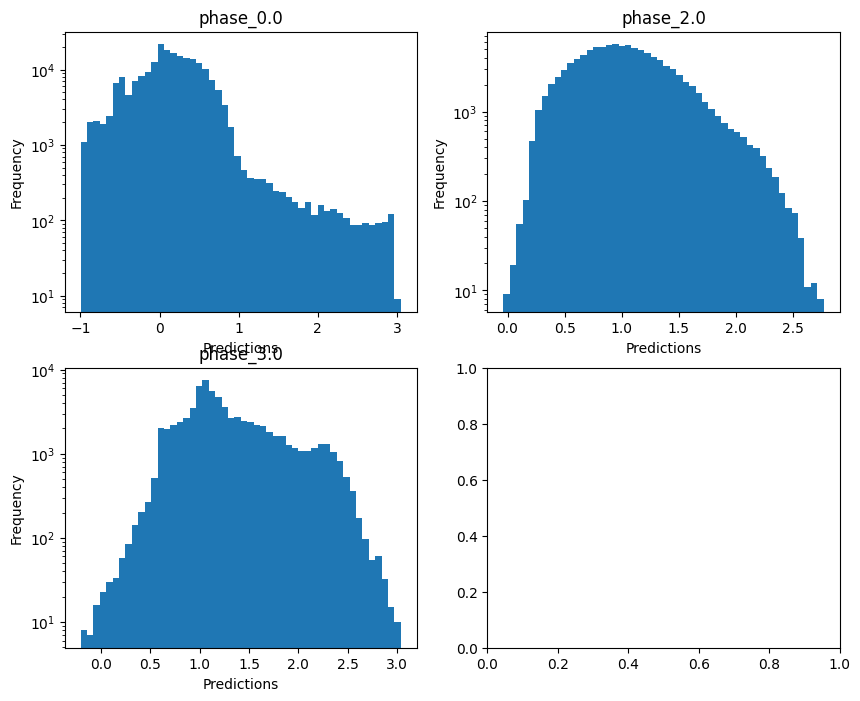

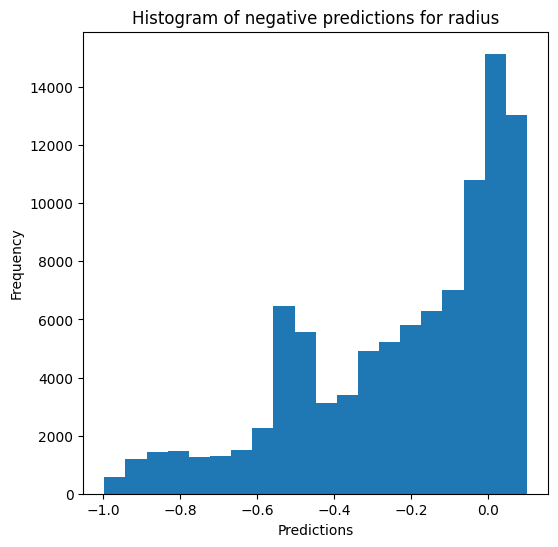

Saving predictions and results...


In [17]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)
# average depth de 44-46

### XGBoost

In [18]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_power_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9331336452057812
  RMSE :  0.08418994214519945
  MAE :  0.04421199074695226
  MedAE :  0.012740918296453962
  CORR :  0.9660496662958187
  MAX_ER :  0.7330427263185078
  Percentiles : 
    75th percentile :  0.04896949013642615
    90th percentile :  0.13690569118564827
    95th percentile :  0.20017179769996207
    99th percentile :  0.3378428937701155

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.7790180294331651
  RMSE :  0.11834956961877453
  MAE :  0.08972604545686719
  MedAE :  0.06989145374255967
  CORR :  0.8826863391993703
  MAX_ER :  0.530334156832331
  Percentiles : 
    75th percentile :  0.12361565487837922
    90th percentile :  0.19610053461275995
   

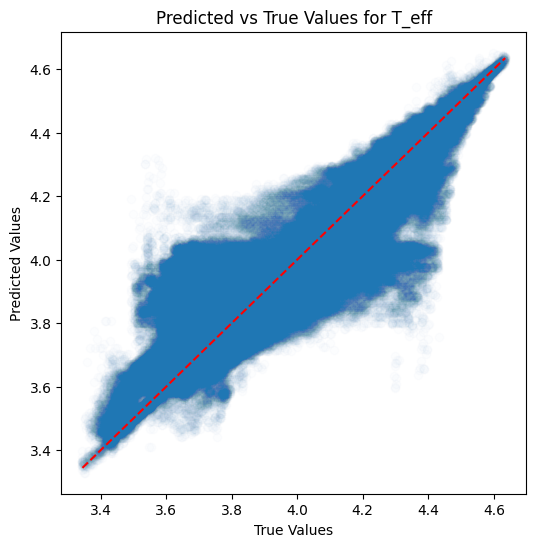

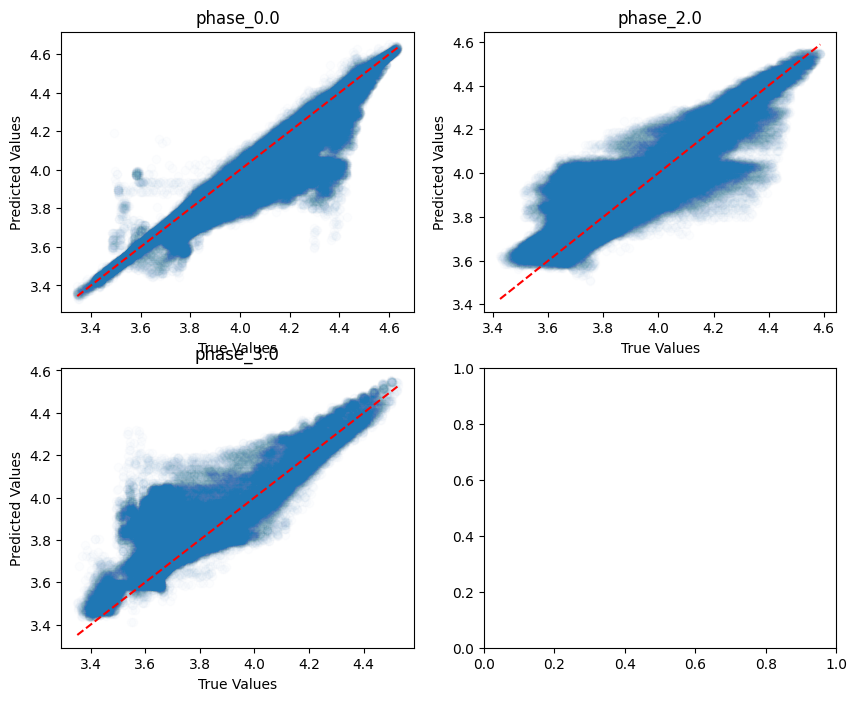

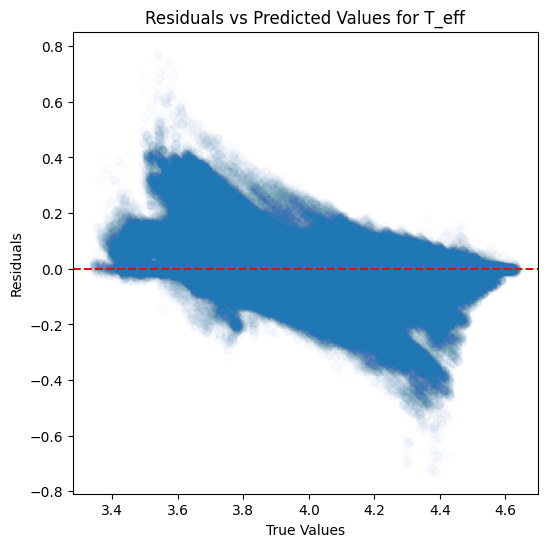

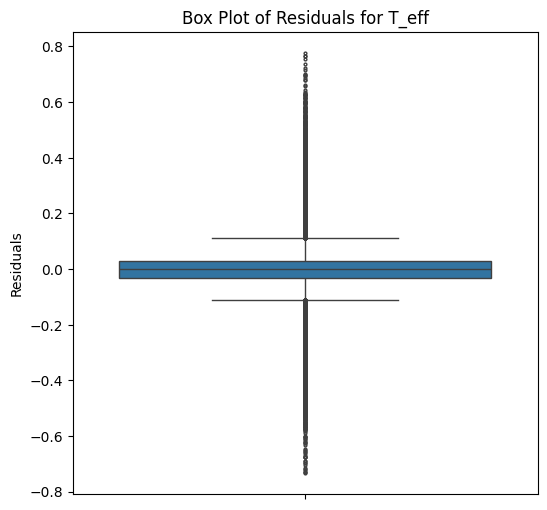

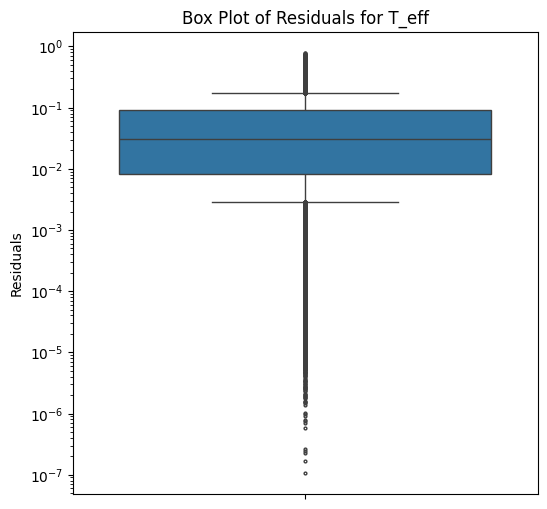

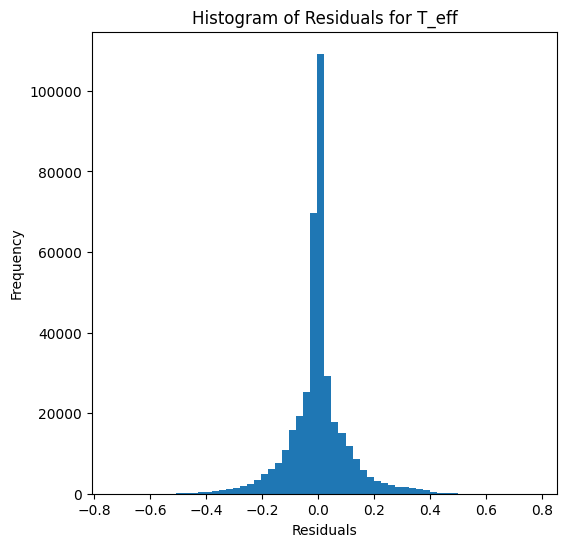

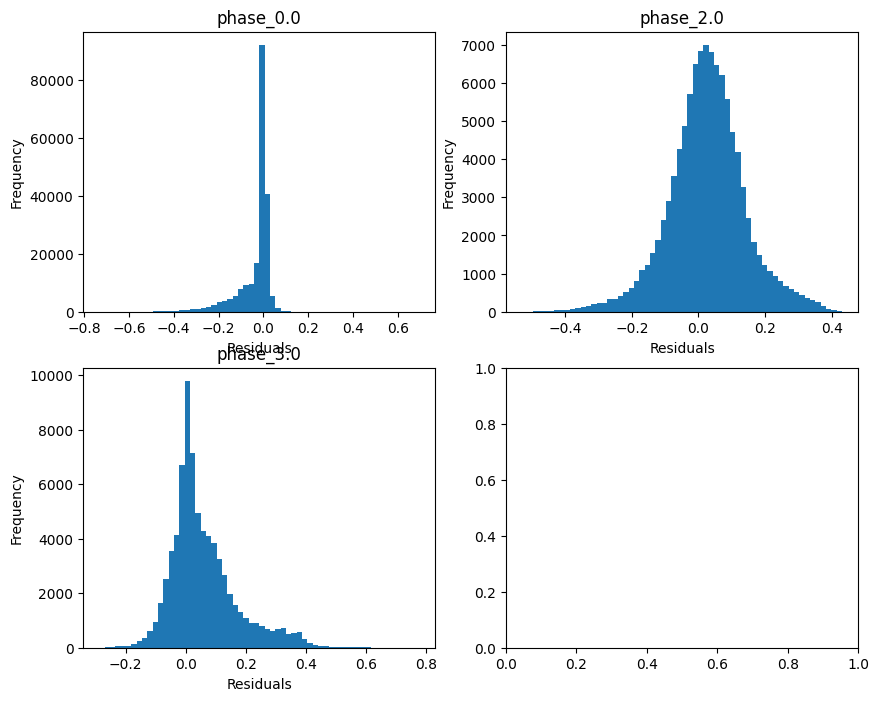

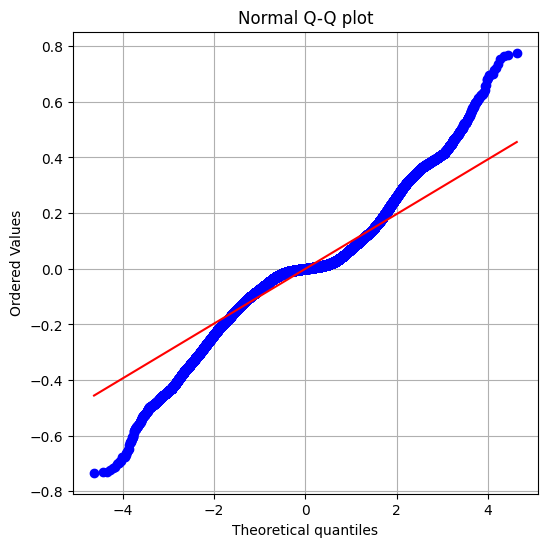

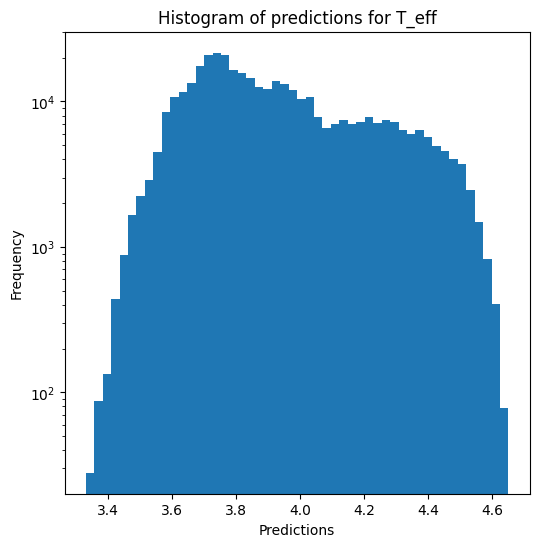

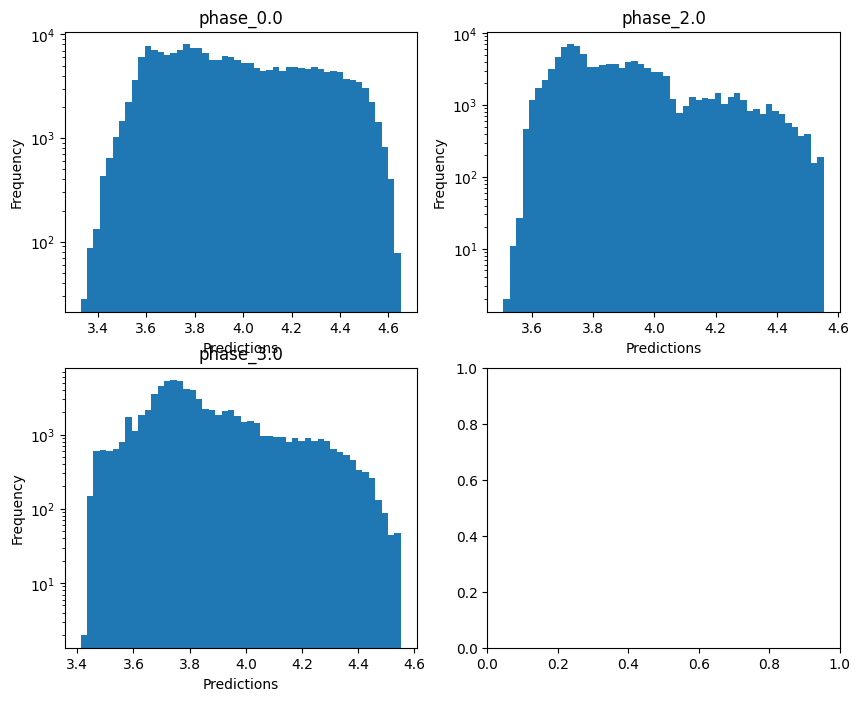


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.022039535919567865
  RMSE :  0.4954958705418479
  MAE :  0.2616090633790479
  MedAE :  0.06363452491242949
  CORR :  0.8403423908410921
  MAX_ER :  4.777865727291303
  Percentiles : 
    75th percentile :  0.31483412790604515
    90th percentile :  0.847393192066156
    95th percentile :  1.1697997418443693
    99th percentile :  1.7244973084881652

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.36138865278672105
  RMSE :  0.75064606661748
  MAE :  0.5829610033716409
  MedAE :  0.46796084113354
  CORR :  0.6011562182200291
  MAX_ER :  3.6747917188142463
  Percentiles : 
    75th percentile :  0.8374493883517555
    90th percentile :  1.241075774457115
    95th percentile :  1.5096877193056963
    99th percentile :  2.0843504000504782

log_g results for the phase category with a value 

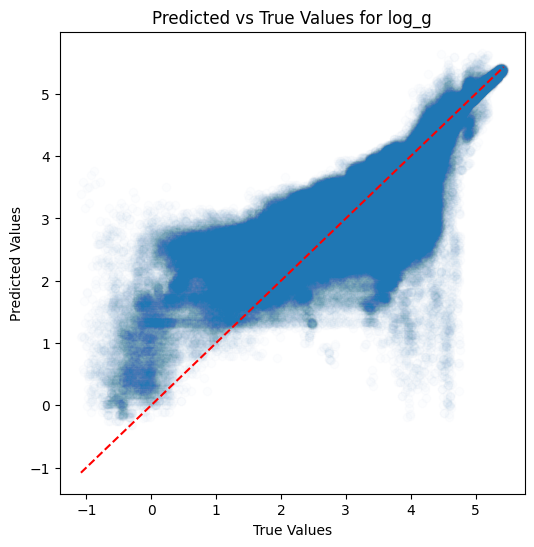

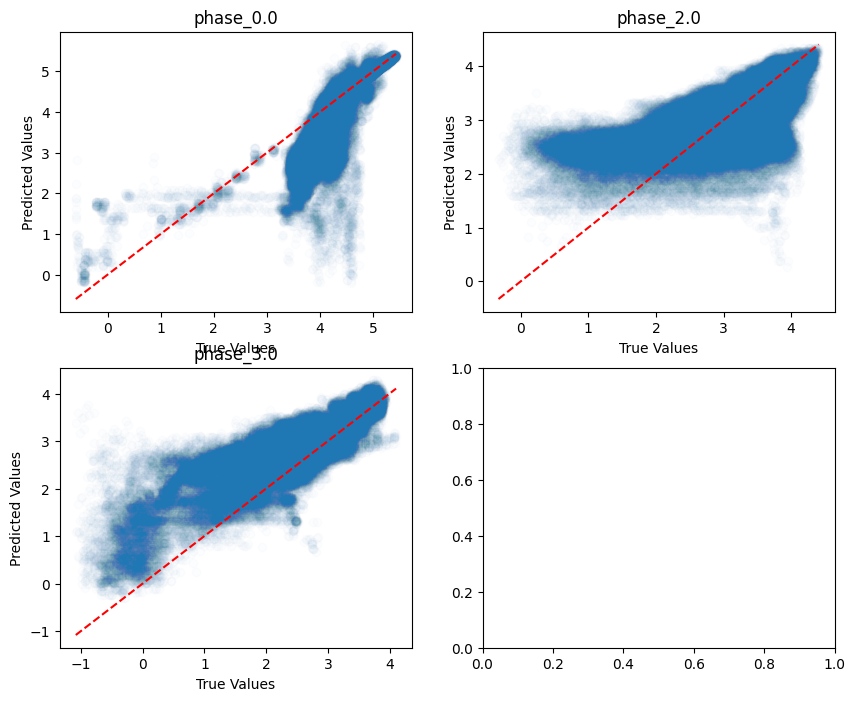

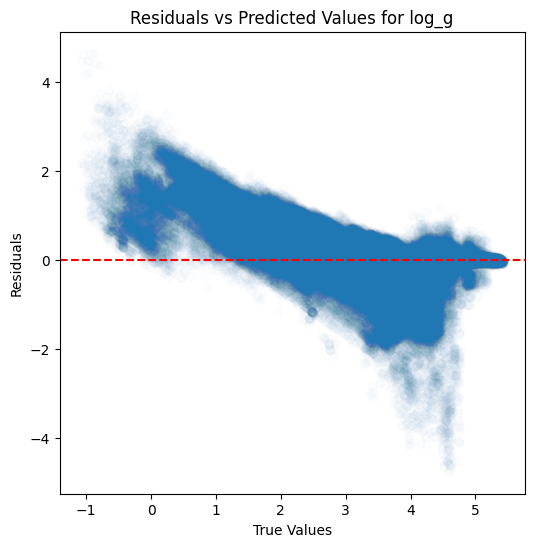

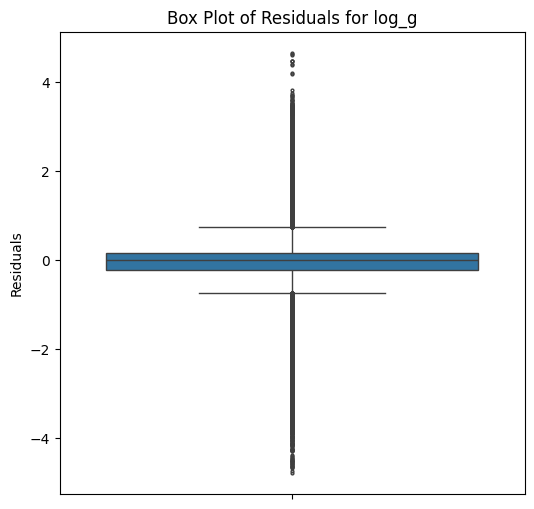

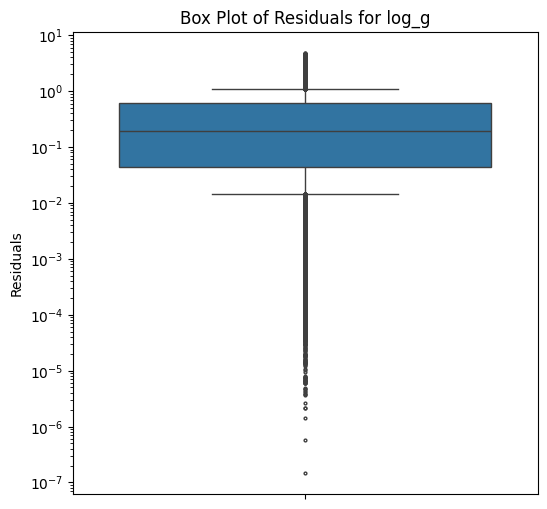

...

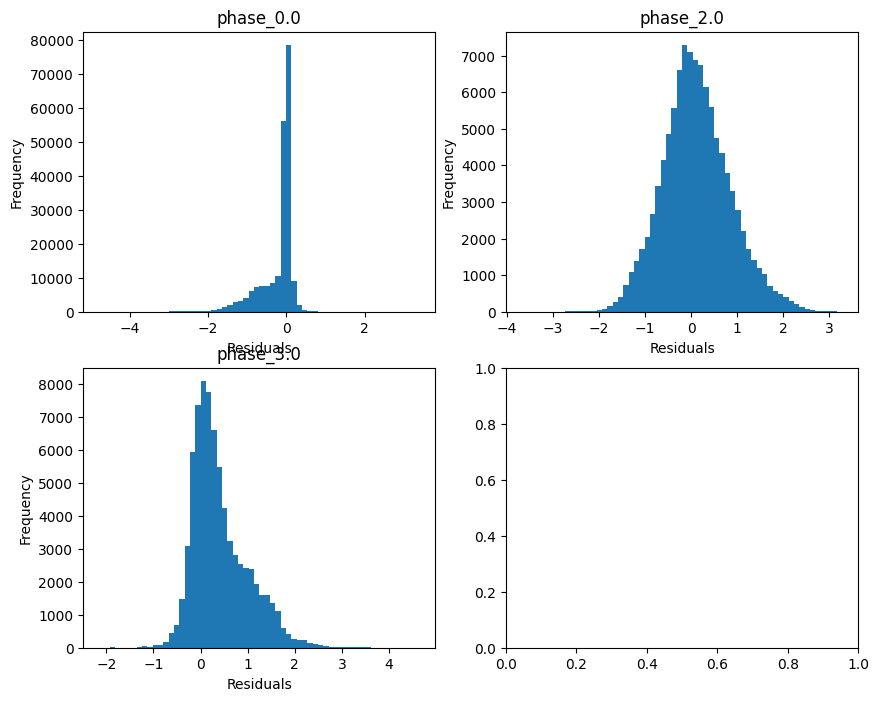

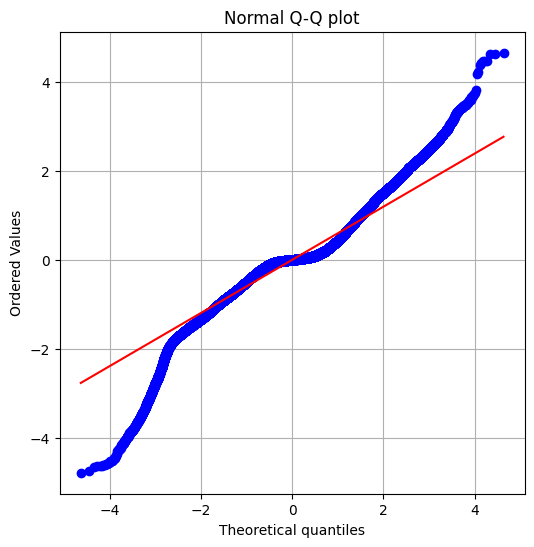

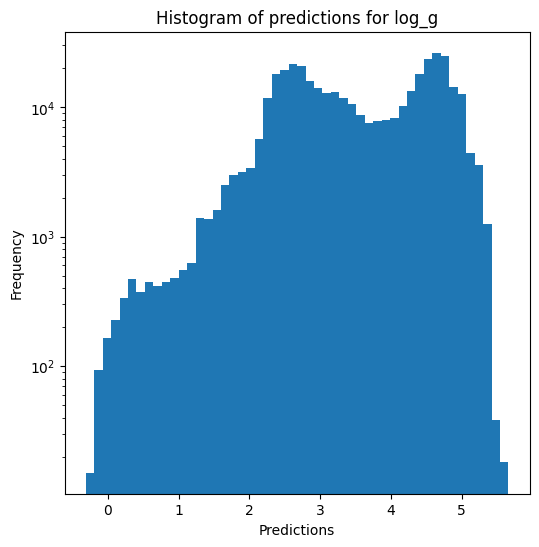

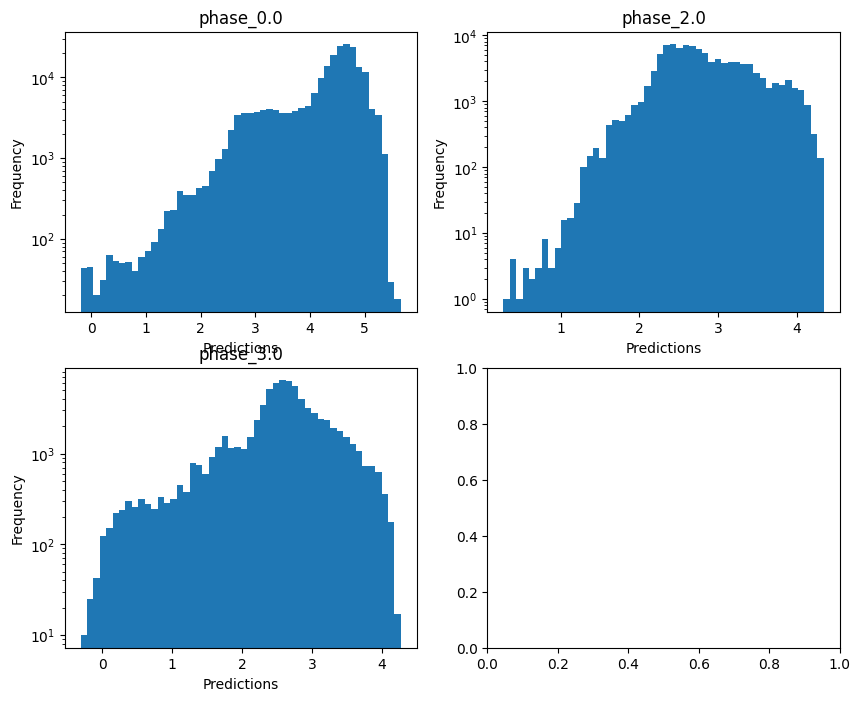

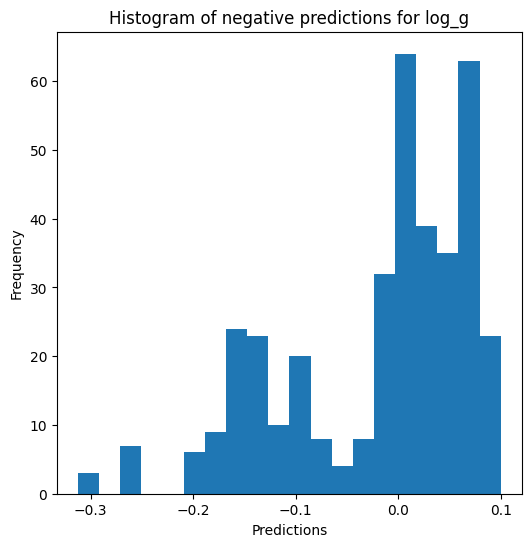


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.7110441989772942
  RMSE :  0.2487881057862079
  MAE :  0.1322797611243925
  MedAE :  0.03366949366901213
  CORR :  0.9153731517596262
  MAX_ER :  2.3524542764803087
  Percentiles : 
    75th percentile :  0.15828854379211882
    90th percentile :  0.42535353344476806
    95th percentile :  0.5842306587734449
    99th percentile :  0.8628555260180186

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.3665637703426564
  RMSE :  0.37495013770809504
  MAE :  0.29119679965809503
  MedAE :  0.23385808400561736
  CORR :  0.6063005323909932
  MAX_ER :  1.904922613514408
  Percentiles : 
    75th percentile :  0.41798874737182073
    90th percentile :  0.619474463549698
    95th percentile :  0.7531896781068755
    99th percentile :  1.0432816264370284

radius results for the phase category with

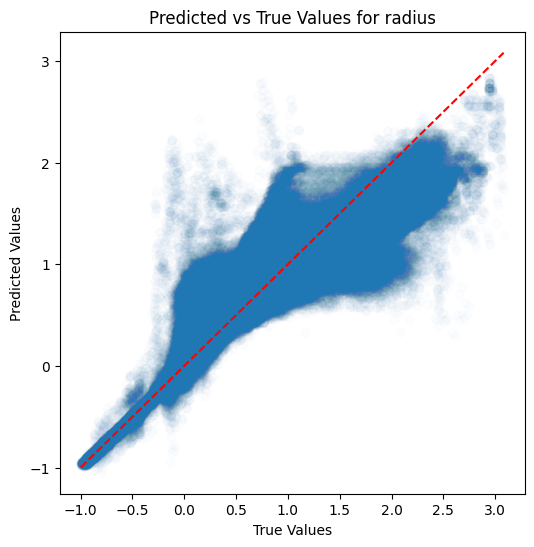

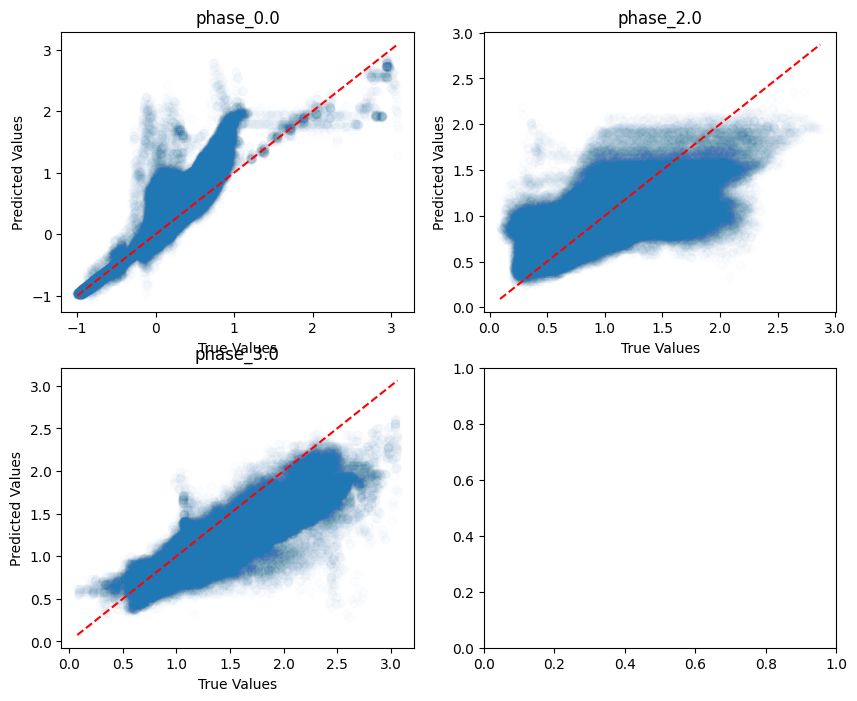

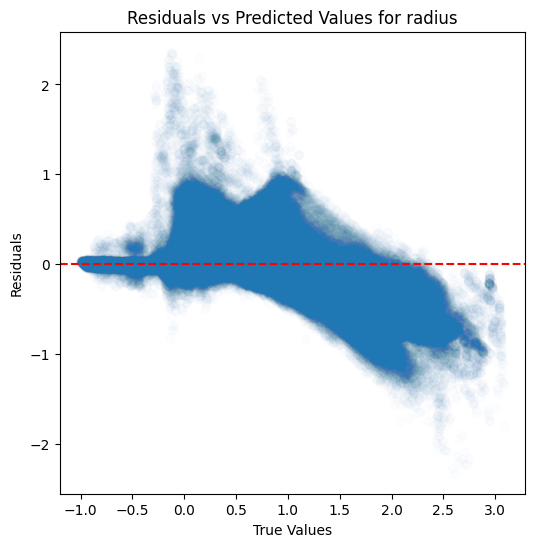

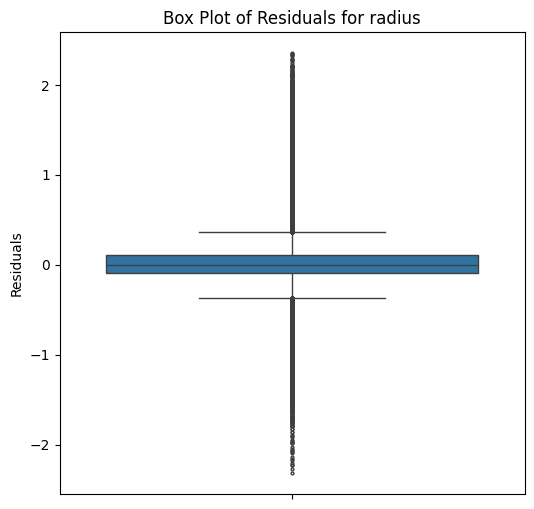

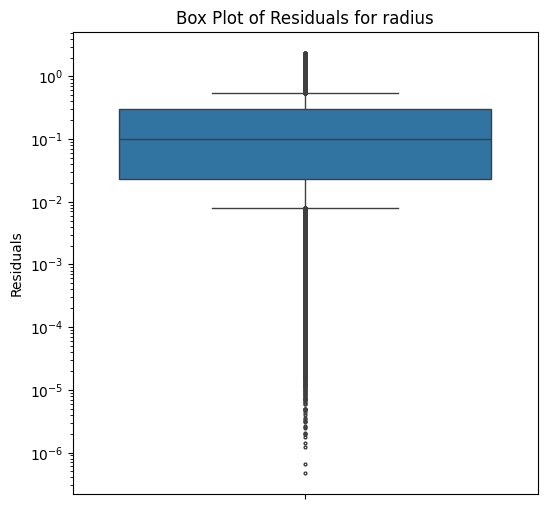

...

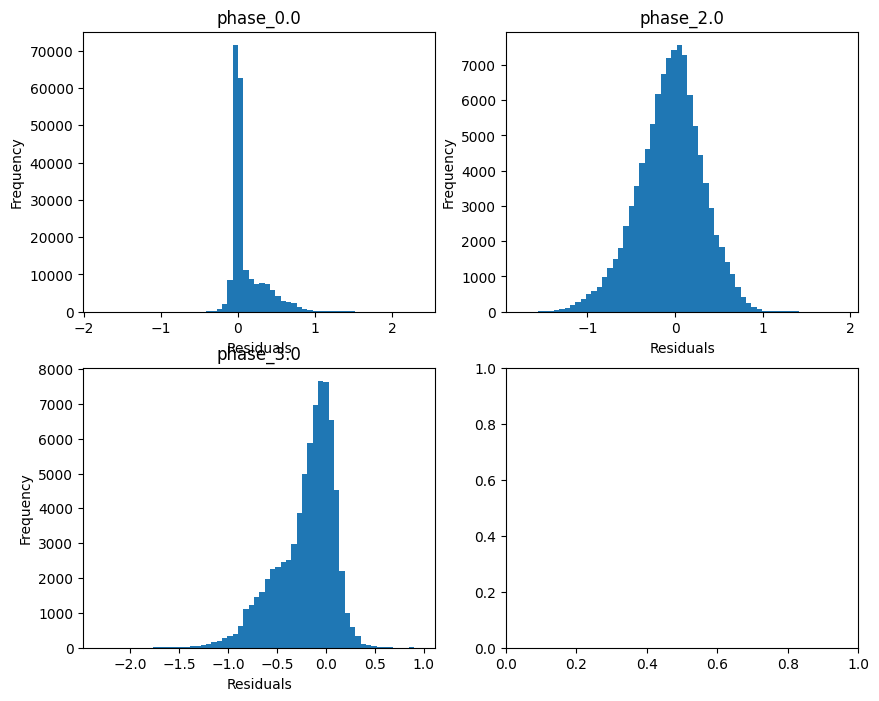

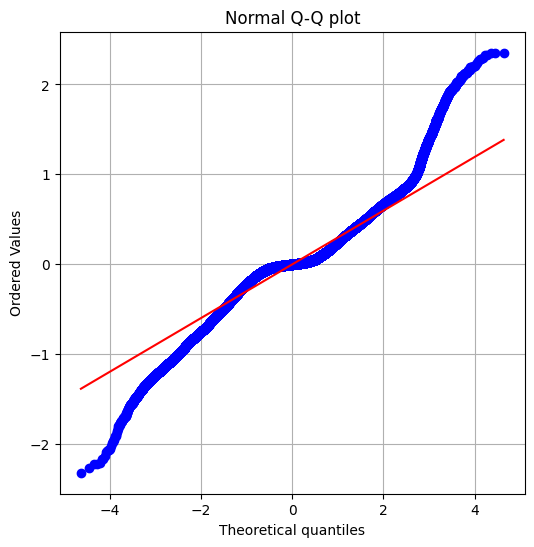

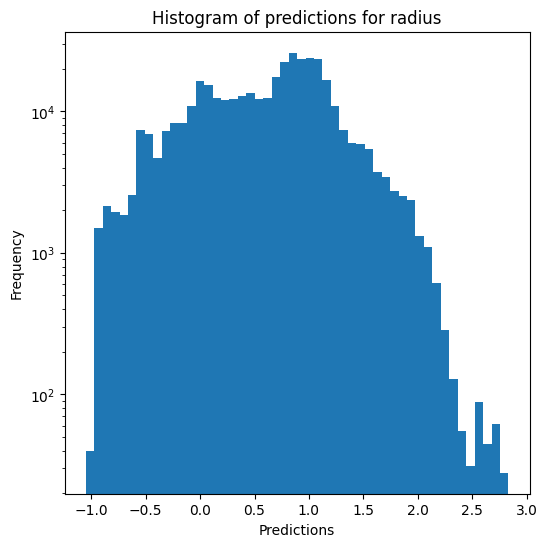

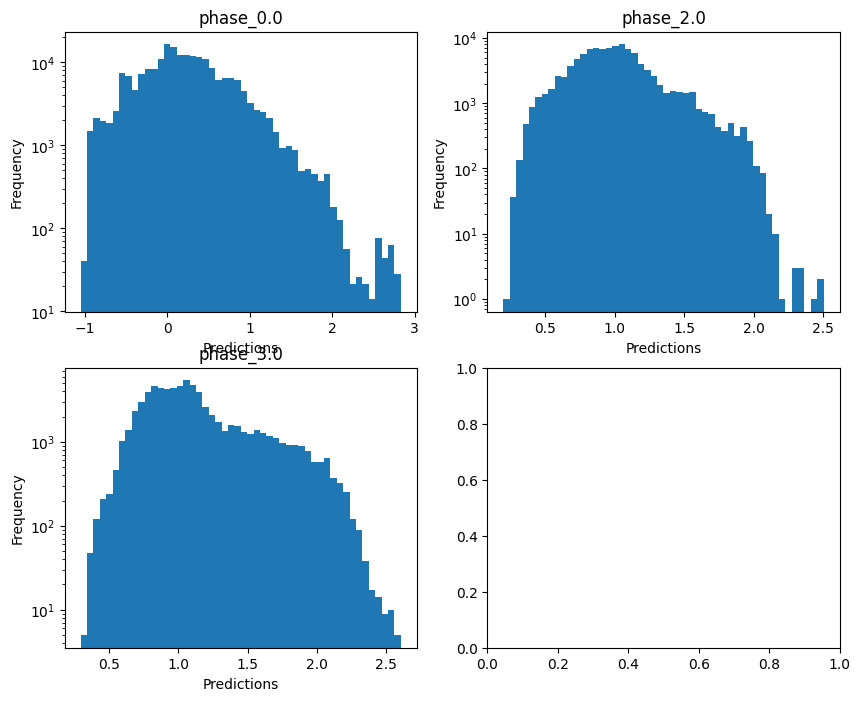

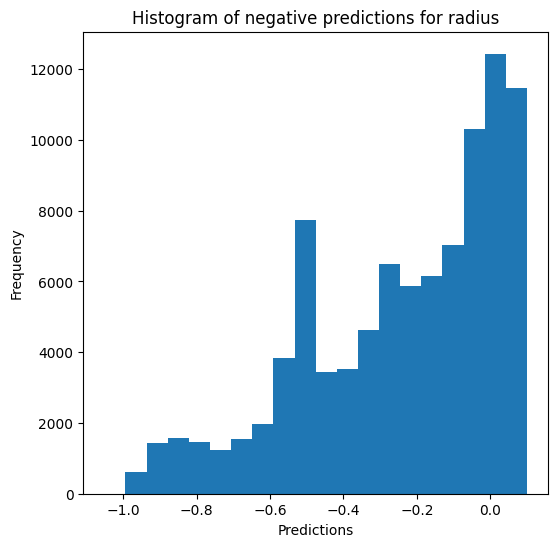

Saving predictions and results...


In [19]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)

### Multi-layer perceptron

In [20]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_power_14 train data :
Performing K-fold...
Split 1 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07744249802561232
2 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.0768963686016025
3 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07594424604783145
4 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07623435247373982
5 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07767635367386734

Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9219048655323632
  RMSE :  0.08371751450150876
  MAE :  0.059072751120069635
  MedAE :  0.046713496904667196
  CORR :  0.9603332725704673
  MAX_ER :  0.702192868727336
  Percentiles : 
    75th percentile :  0.07140689661904798
    90th percentile :  0.10799938508602917
    95th percentile :  0.15328937125650996
    99th percentile :  0.34129170204263776

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.5876557299556575
  RVE :  0.7685978104794773
  RMSE :  0.12297821836445652
  MAE :  0.08876449553806344
  MedAE :  0.06335035336467709
  CORR :  0.8776198420165832
  MAX_ER :  0.6064968687469641
  Percentiles : 
    75th percentile :  0.11966707622209416
    90th percentile :  0.20499403527169427
    95th percentile :  0.27285492231369596
    99th percen

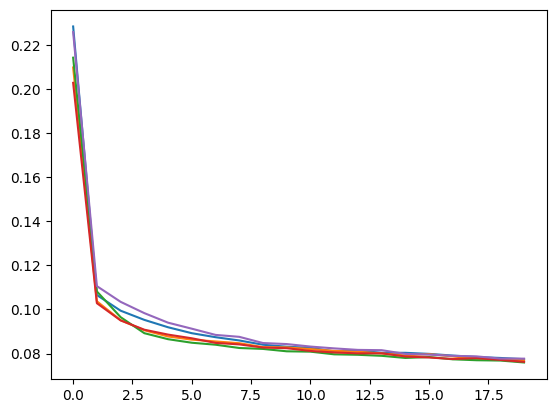

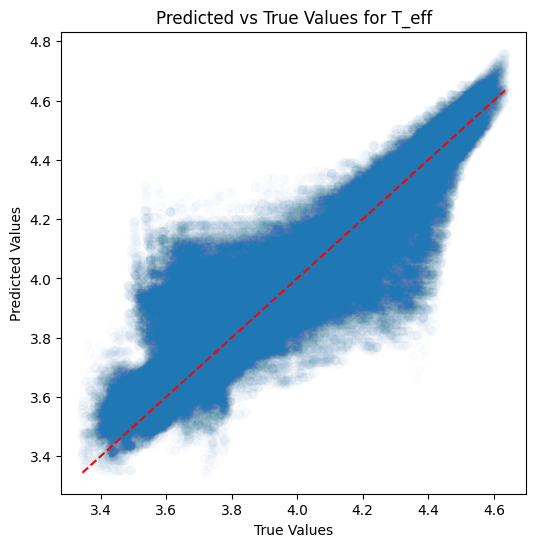

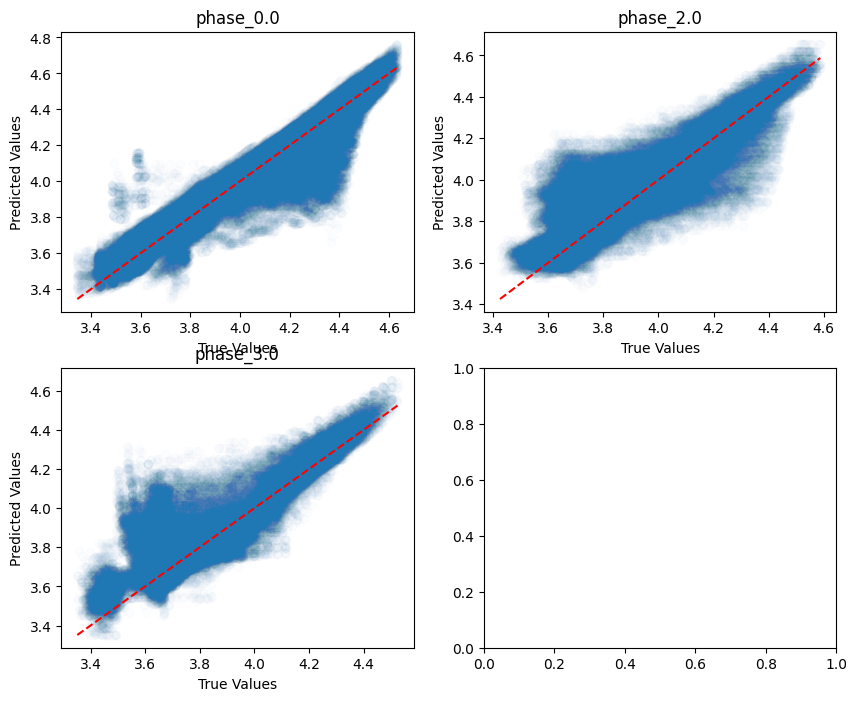

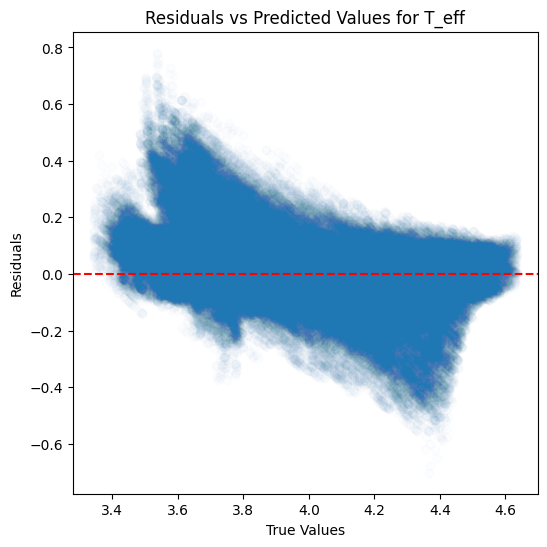

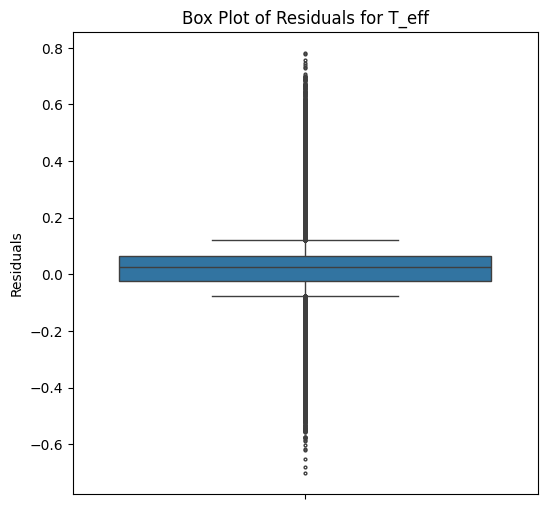

...

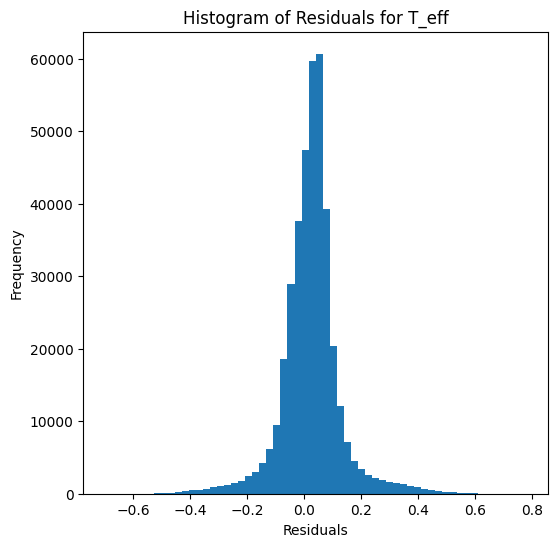

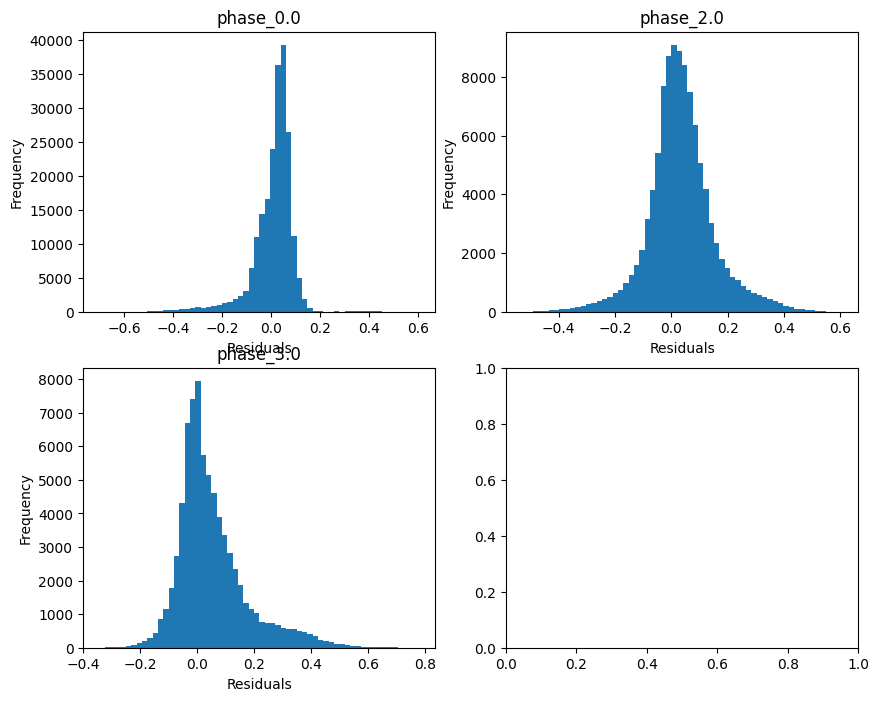

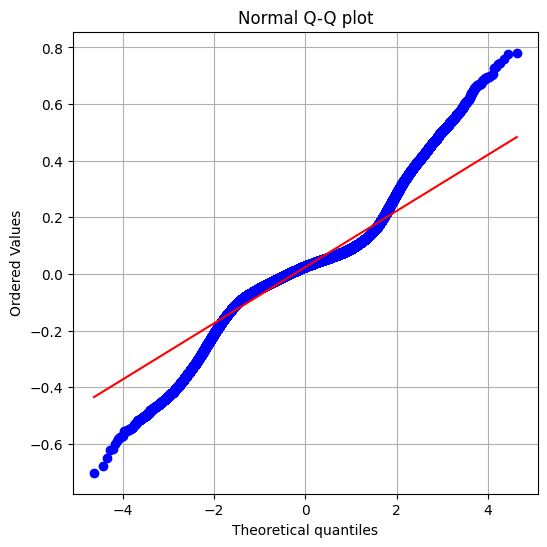

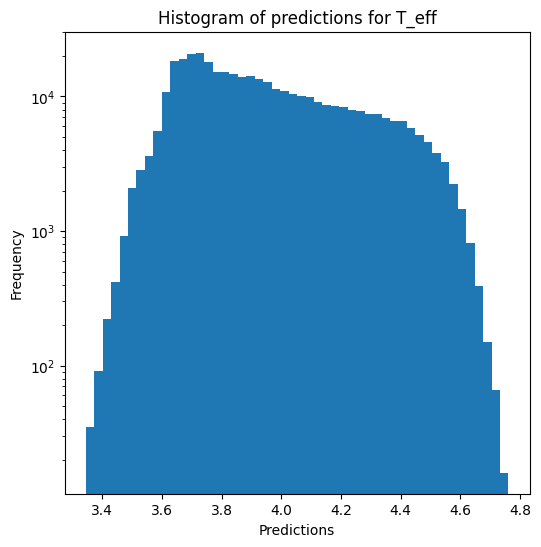

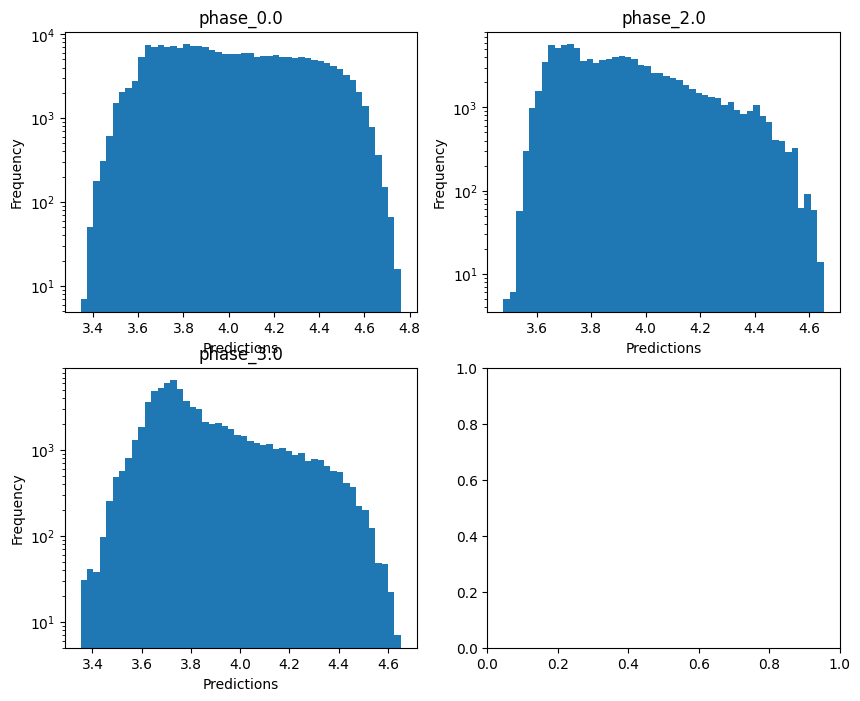


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.06800007240970896
  RMSE :  0.4542300995721291
  MAE :  0.17923595245170942
  MedAE :  0.05291143086791905
  CORR :  0.7851596223619828
  MAX_ER :  4.297448012546814
  Percentiles : 
    75th percentile :  0.09493188527033514
    90th percentile :  0.4231936429115984
    95th percentile :  1.1167101818552072
    99th percentile :  2.041874472810671

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.4046664571831846
  RMSE :  0.7191029521402523
  MAE :  0.5448030142985708
  MedAE :  0.40583893756477485
  CORR :  0.6380242319378019
  MAX_ER :  2.7918455366926853
  Percentiles : 
    75th percentile :  0.8072550599580366
    90th percentile :  1.2437477055356783
    95th percentile :  1.4986942509088645
    99th percentile :  1.9333230829357932

log_g results for the phase category with a v

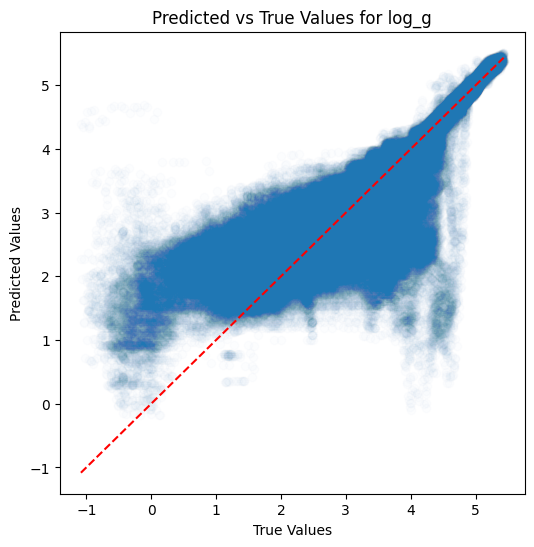

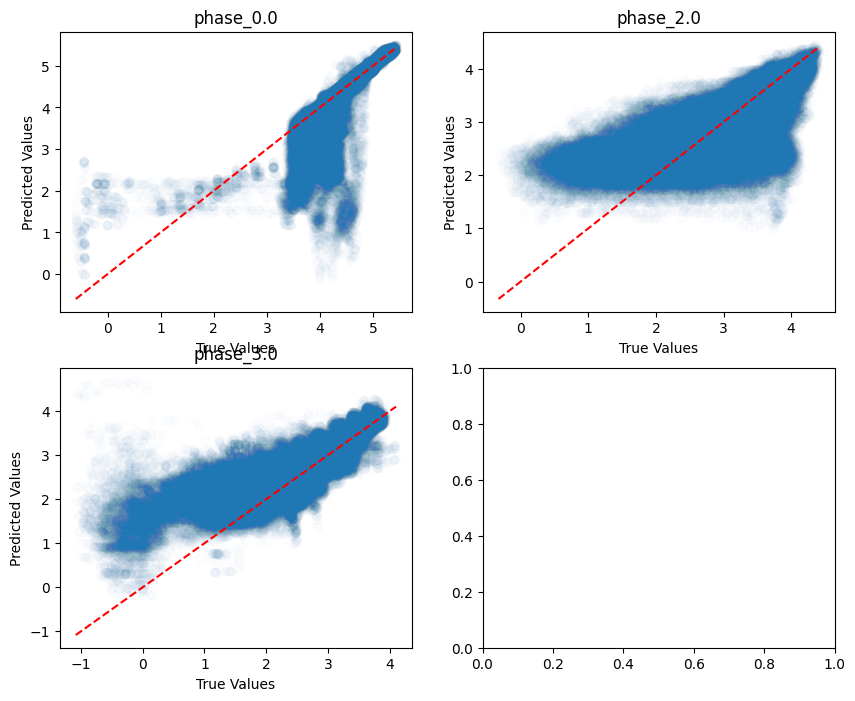

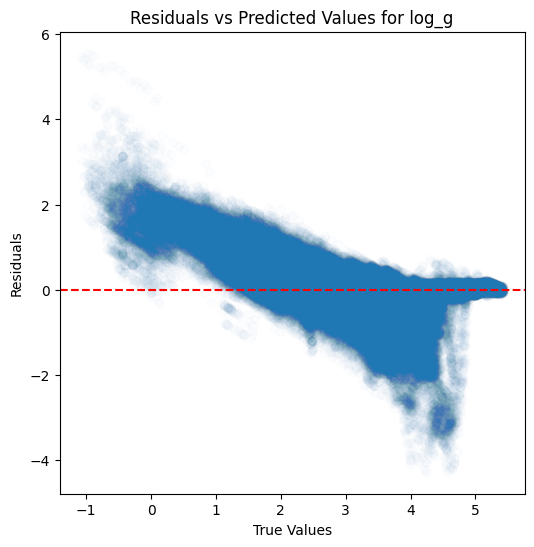

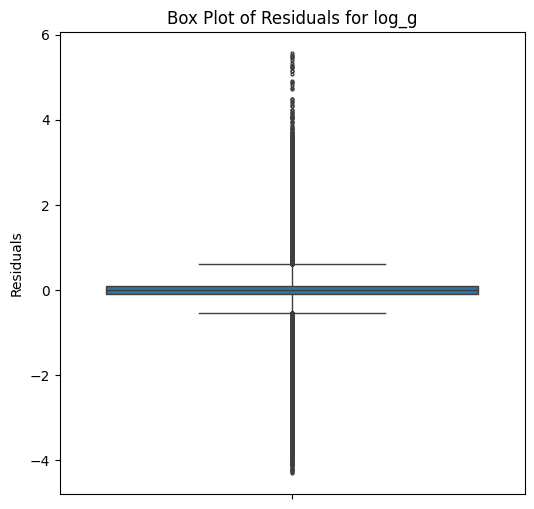

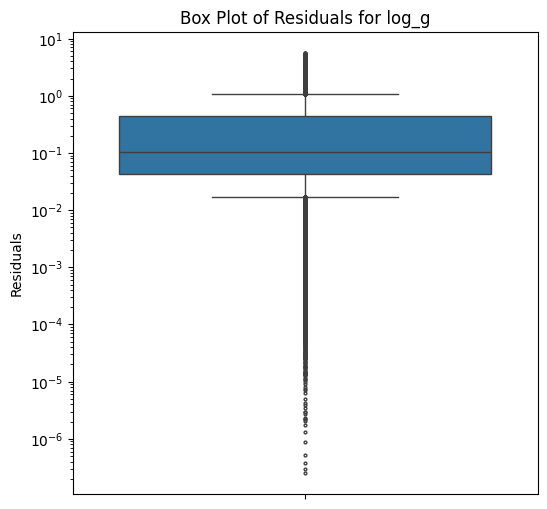

...

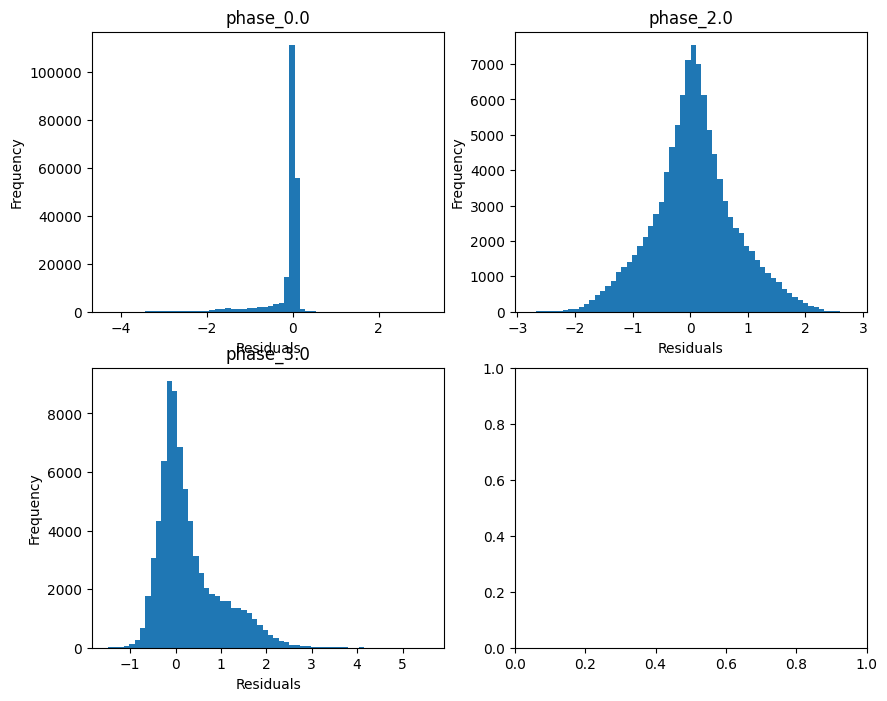

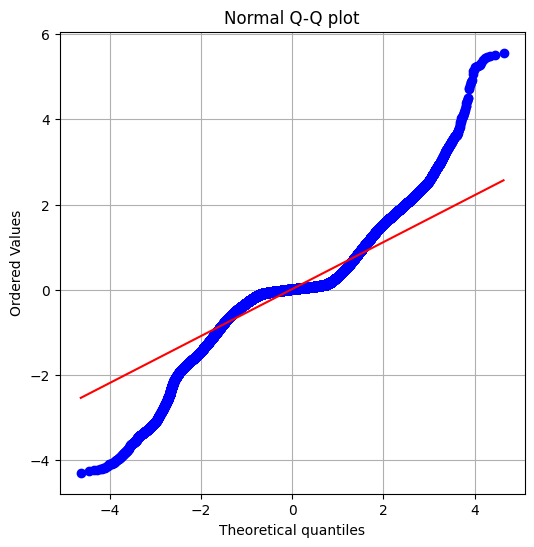

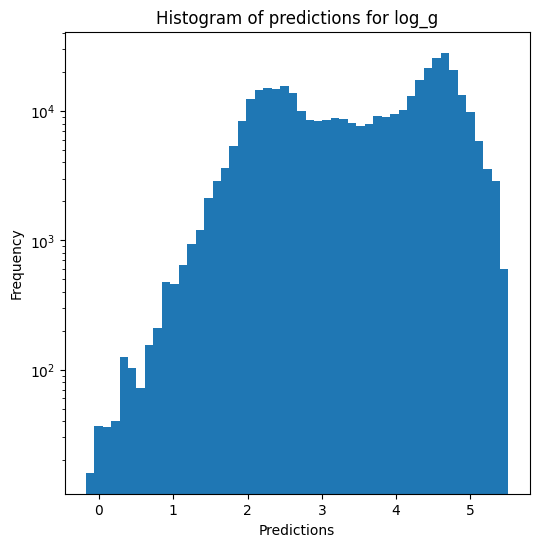

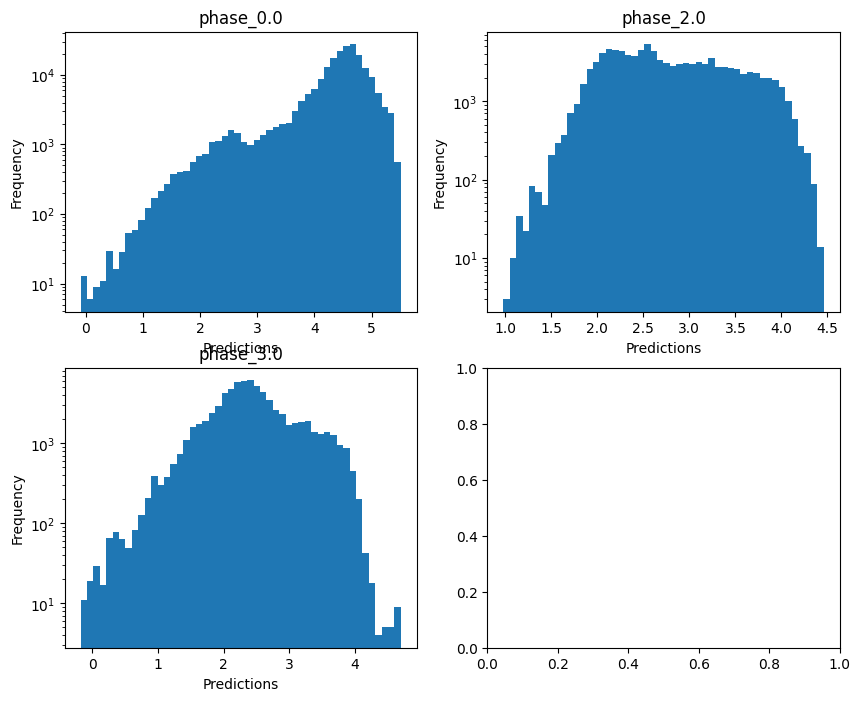

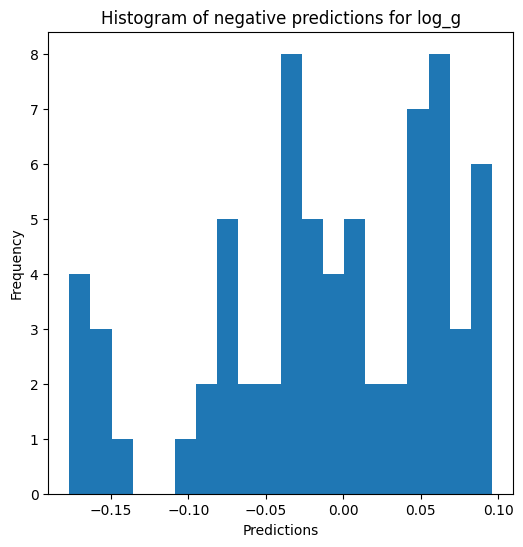


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.082068881511837
  RVE :  0.7302337145853055
  RMSE :  0.23091828214619728
  MAE :  0.09170000272396009
  MedAE :  0.025562657776108666
  CORR :  0.9028549453146374
  MAX_ER :  2.2182098200227496
  Percentiles : 
    75th percentile :  0.053180729039439156
    90th percentile :  0.21914079516162757
    95th percentile :  0.5682935215894522
    99th percentile :  1.0327062463598011

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.8708569524681256
  RVE :  0.40314366928950396
  RMSE :  0.36040128179539976
  MAE :  0.27338681331496584
  MedAE :  0.20369714915675713
  CORR :  0.637562256194628
  MAX_ER :  1.3908490864752432
  Percentiles : 
    75th percentile :  0.4054038205235815
    90th percentile :  0.6229893417124455
    95th percentile :  0.750211041331768
    99th percentile :  0.9633300300472882

radius results for the phase category 

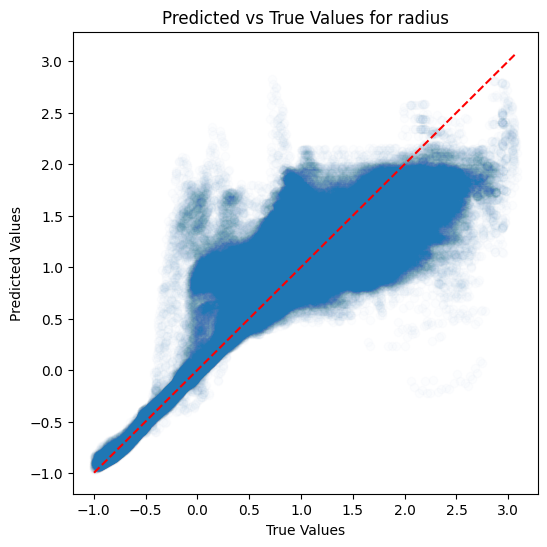

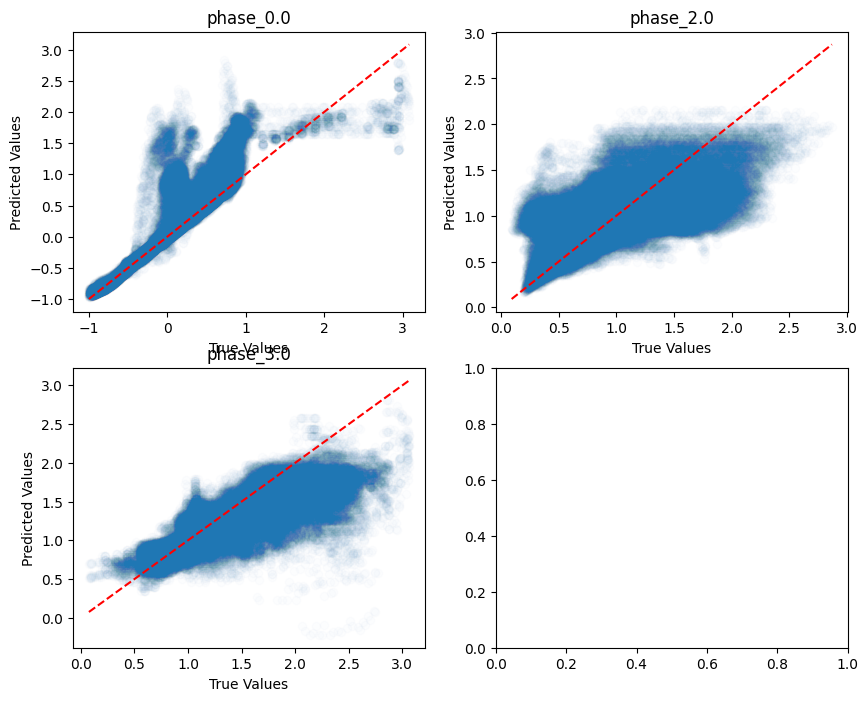

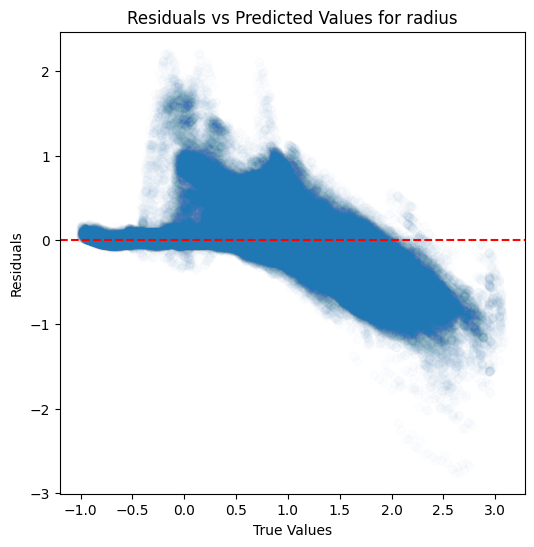

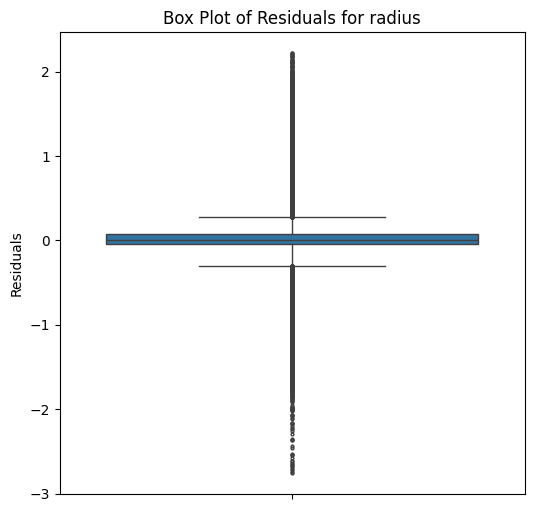

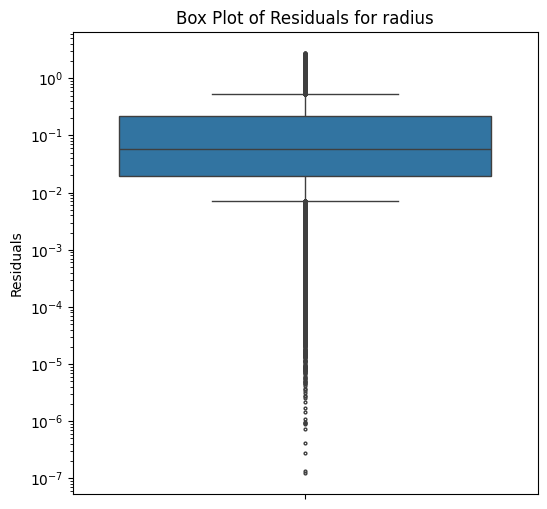

...

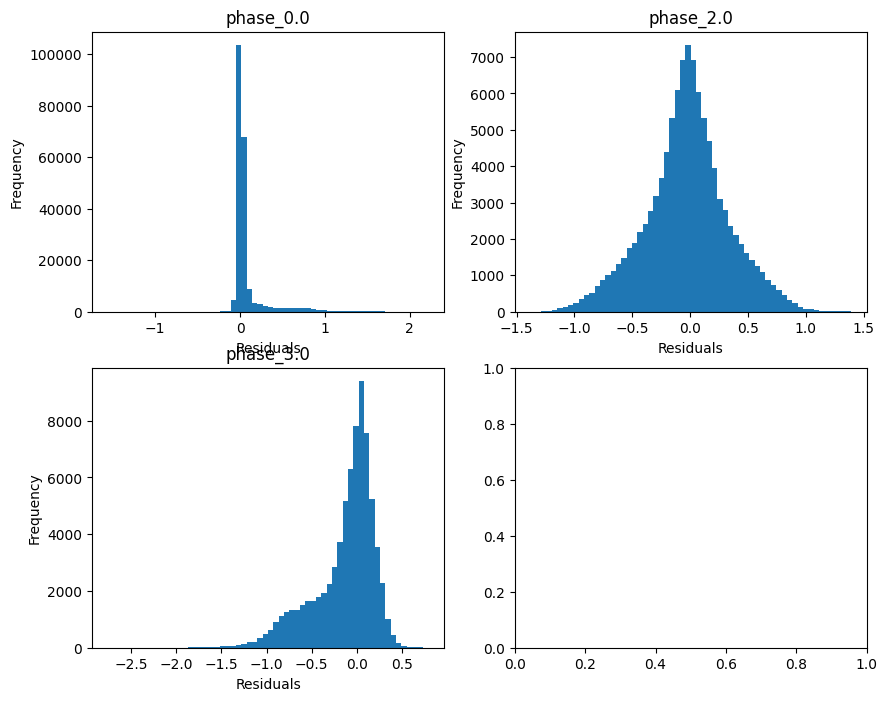

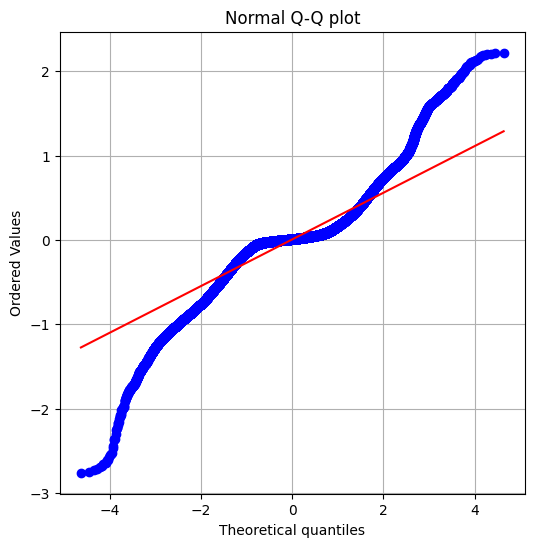

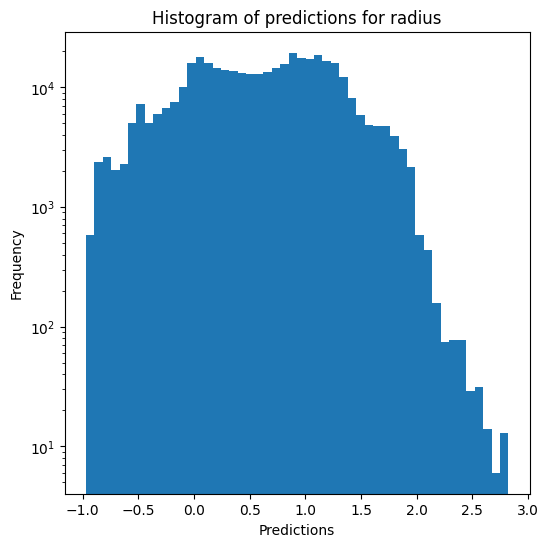

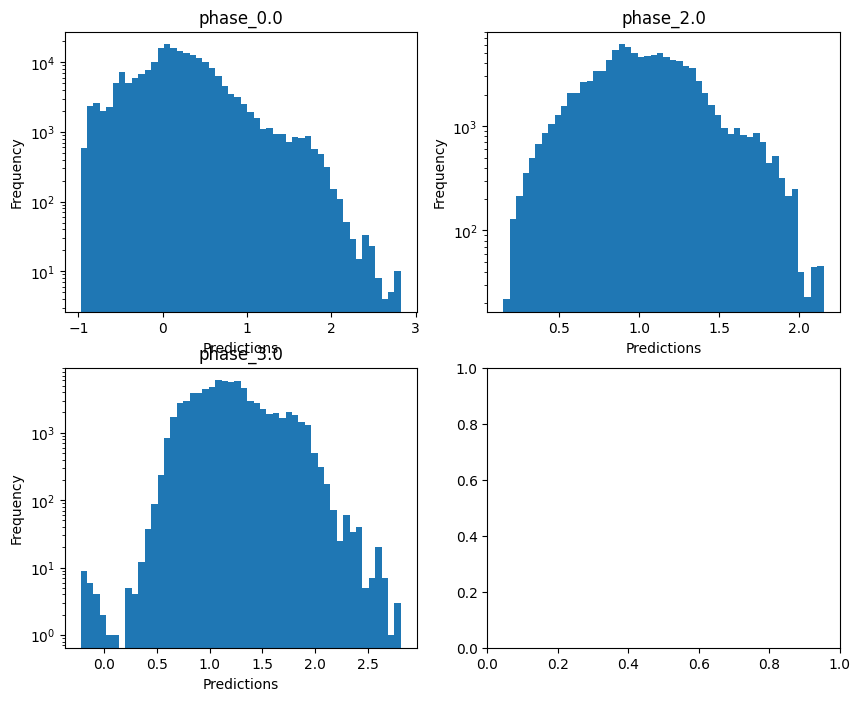

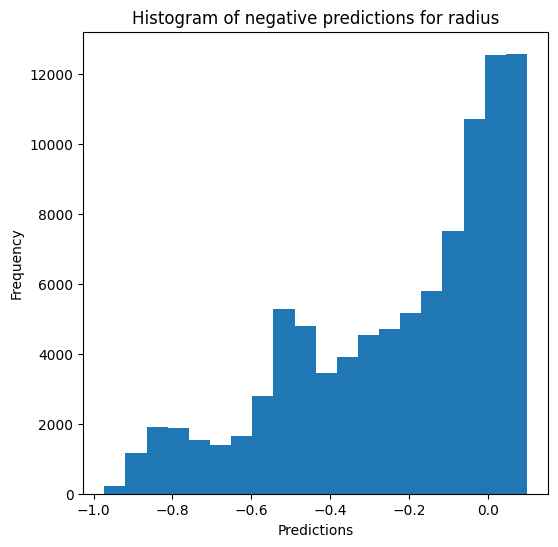

Saving predictions and results...


In [21]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name,
                                      hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)

Avec batch_size=auto (200):

plus de 30 minutes pour entrainer un seul split de Kfold avec les paramètres par défaut (1 hidden layer de taille 100)

plus de 15 minutes pour entrainer un seul split de Kfold avec les 1 hidden layer de taille 10

- et max_iter=20, hidden_layer_sizes=(100, 50, 25): ~5 minutes par fold (plutôt bon résultats)
- et max_iter=20, hidden_layer_sizes=(100, 100, 100): ~5 minutes par fold

Avec batch_size=400:


Avec learning_rate= :


hidden_layer_sizes = (100, 100), max_iter=20, batch_size=200 => 17 min pour 2 splits et min_loss de 2.1
RMSE = RVE :  0.984867927459382
RMSE :  2.5335132759292107
MAE :  0.7276983504493552
MedAE :  0.3034009994265745
CORR :  0.9927285673947535
MAX_ER :  169.74348568157313
Percentiles : 75th percentile :  0.5113604728134682 90th percentile :  1.1025928446049704 95th percentile :  2.1347654852226015 99th percentile :  9.897101952249908)

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=400 => 7 min pour 2 splits et min_loss de 2.2
RVE :  0.9797171492755655
RMSE :  2.983208723004754
MAE :  0.9125599339275378
MedAE :  0.43124518658659683
CORR :  0.9920536596906272
MAX_ER :  170.53076478793002
Percentiles : 75th percentile :  0.675744507049632 90th percentile :  1.2421052024331438 95th percentile :  2.441733387262636 99th percentile :  11.925724226452427

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=800 => 3 min pour 2 splits et min_loss de 2.3 et 2.7

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=1600 => 3 min 30 pour 2 splits et min_loss de 7.8 et 3.8

=> batch_size plus grand == plus rapide mais moins bon